In [1]:
#This program generates FIG. 2D 
#Fig2D: Plot of the number of significant changes in different scenarios with increasing FF input
#Fig Supplementary S2-B: Percentage of positive changes in different scenarios with increasing FF input

In [2]:
#Import some libraries 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import LogNorm, Normalize

In [3]:
#Importing some info I need 
runtime=np.loadtxt("../general_files/runtime.txt")*1000 #Runtime of the simulations

#Number of neurons for each type in each of the 4 layers
N= (np.loadtxt("../general_files/N.txt").reshape(4, 4)).astype(int)
Ntot=5000
#In layer 1: 
N1=int(0.0192574218*Ntot)
#print(N1)

#Print Some information about the mdodel
print("The corticular column in this model is composed by layer 2/3,4,5,6 and layer 1")
print("Total number of neurons in the column: %s + %s \n85 perc excitatory and 15 perc inhibitory \nIn each layer: 1 excitotory population and 3 inhibitory populations: pv, sst and vip cells.   "%(Ntot,N1))
print("Number of neurons for each type in each of the 4 layers:")
print(N)
print("The order is from left to right: E, PV, SST, VIP. From top to bottom: 2/3,4,5,6")


The corticular column in this model is composed by layer 2/3,4,5,6 and layer 1
Total number of neurons in the column: 5000 + 96 
85 perc excitatory and 15 perc inhibitory 
In each layer: 1 excitotory population and 3 inhibitory populations: pv, sst and vip cells.   
Number of neurons for each type in each of the 4 layers:
[[1236   65   47  107]
 [1010   98   53   27]
 [ 741   63   56   11]
 [1263  102  102   19]]
The order is from left to right: E, PV, SST, VIP. From top to bottom: 2/3,4,5,6


In [128]:
# You select one folder "state" and the correspondant folder with the perturbation data  
#0,30,60,80,110,140,170,200,230,230,260,280,310,340,370,400

#folder_state='../simulations_data/REVISIONS_1/Sp_input_e4_0pA_e5_0pA_e23_0pA_e6_0pA'  #spont

folder_state='../simulations_data/REVISIONS_1/Sp_input_e4_150pA_e5_0pA_e23_0pA_e6_0pA' #L4
#folder_state='../simulations_data/REVISIONS_1/Sp_input_e4_0pA_e5_150pA_e23_0pA_e6_0pA' #L5

#folder_state='../simulations_data/REVISIONS_1/Sp_input_e4_150pA_e5_150pA_e23_0pA_e6_0pA' L4 & L5


#folder_input='../simulations_data/REVISIONS_1/Sim_e4_150pA_e5_0pA_pert_-40pA' 
#folder_input='../simulations_data/REVISIONS_1/Sim_e4_150pA_e5_0pA_pert_-30pA' 
#folder_input='../simulations_data/REVISIONS_1/Sim_e4_150pA_e5_0pA_pert_-20pA' 
#folder_input='../simulations_data/REVISIONS_1/Sim_e4_150pA_e5_0pA_pert_-10pA' 
#folder_input='../simulations_data/REVISIONS_1/Sim_e4_150pA_e5_0pA_pert_10pA' 
#folder_input='../simulations_data/REVISIONS_1/Sim_e4_150pA_e5_0pA_pert_20pA' 
#folder_input='../simulations_data/REVISIONS_1/Sim_e4_150pA_e5_0pA_pert_30pA' 
folder_input='../simulations_data/REVISIONS_1/Sim_e4_150pA_e5_0pA_pert_40pA' 




#folder_input='../simulations_data/REVISIONS_1/Sim_e4_0pA_e5_150pA_pert_-40pA' 
#folder_input='../simulations_data/REVISIONS_1/Sim_e4_0pA_e5_150pA_pert_-30pA' 
#folder_input='../simulations_data/REVISIONS_1/Sim_e4_0pA_e5_150pA_pert_-20pA' 
#folder_input='../simulations_data/REVISIONS_1/Sim_e4_0pA_e5_150pA_pert_-10pA' 
#folder_input='../simulations_data/REVISIONS_1/Sim_e4_0pA_e5_150pA_pert_10pA' 
#folder_input='../simulations_data/REVISIONS_1/Sim_e4_0pA_e5_150pA_pert_20pA' 
#folder_input='../simulations_data/REVISIONS_1/Sim_e4_0pA_e5_150pA_pert_30pA' 
#folder_input='../simulations_data/REVISIONS_1/Sim_e4_0pA_e5_150pA_pert_40pA' 




#folder_input='../simulations_data/REVISIONS_1/Sim_e4_150pA_e5_150pA_pert_-40pA' 
#folder_input='../simulations_data/REVISIONS_1/Sim_e4_150pA_e5_150pA_pert_-30pA' 
#folder_input='../simulations_data/REVISIONS_1/Sim_e4_150pA_e5_150pA_pert_-20pA' 
#folder_input='../simulations_data/REVISIONS_1/Sim_e4_150pA_e5_150pA_pert_-10pA' 
#folder_input='../simulations_data/REVISIONS_1/Sim_e4_150pA_e5_150pA_pert_10pA' 
#folder_input='../simulations_data/REVISIONS_1/Sim_e4_150pA_e5_150pA_pert_20pA' 
#folder_input='../simulations_data/REVISIONS_1/Sim_e4_150pA_e5_150pA_pert_30pA' 
#folder_input='../simulations_data/REVISIONS_1/Sim_e4_150pA_e5_150pA_pert_40pA' 




#This is the threshold to check how much increase I am interested in 
threshold=0.2

In [129]:
#------------------------------------------------------------------------------
# Import the files 
#------------------------------------------------------------------------------

#This funciton takes the name of the folder and import all the spike data 
#The function returns the number of spikes for each group of neurons 

def take_files(a):
    
    #layer1
    S_vip1num_spikes=np.array(np.loadtxt(a+'/S_vip1numspike.txt') )

    #layer23
    S_e23num_spikes=np.array(np.loadtxt(a+'/S_e23numspike.txt') )
    S_pv23num_spikes=np.array(np.loadtxt(a+'/S_pv23numspike.txt') )
    S_sst23num_spikes=np.array(np.loadtxt(a+'/S_sst23numspike.txt') )
    S_vip23num_spikes=np.array(np.loadtxt(a+'/S_vip23numspike.txt') )

    #layer4
    S_e4num_spikes=np.array(np.loadtxt(a+'/S_e4numspike.txt') )
    S_pv4num_spikes=np.array(np.loadtxt(a+'/S_pv4numspike.txt') )
    S_sst4num_spikes=np.array(np.loadtxt(a+'/S_sst4numspike.txt') )
    S_vip4num_spikes=np.array(np.loadtxt(a+'/S_vip4numspike.txt') )

    #layer5
    S_e5num_spikes=np.array(np.loadtxt(a+'/S_e5numspike.txt') )
    S_pv5num_spikes=np.array(np.loadtxt(a+'/S_pv5numspike.txt') )
    S_sst5num_spikes=np.array(np.loadtxt(a+'/S_sst5numspike.txt') )
    S_vip5num_spikes=np.array(np.loadtxt(a+'/S_vip5numspike.txt') )

    #layer6
    S_e6num_spikes=np.array(np.loadtxt(a+'/S_e6numspike.txt') )
    S_pv6num_spikes=np.array(np.loadtxt(a+'/S_pv6numspike.txt') )
    S_sst6num_spikes=np.array(np.loadtxt(a+'/S_sst6numspike.txt') )
    S_vip6num_spikes=np.array(np.loadtxt(a+'/S_vip6numspike.txt') ) 
    
    return S_vip1num_spikes,S_e4num_spikes,S_pv4num_spikes,S_sst4num_spikes,S_vip4num_spikes,S_e5num_spikes,S_pv5num_spikes,S_sst5num_spikes,S_vip5num_spikes, S_e6num_spikes,S_pv6num_spikes,S_sst6num_spikes,S_vip6num_spikes,S_e23num_spikes,S_pv23num_spikes,S_sst23num_spikes,S_vip23num_spikes

In [130]:
#------------------------------------------------------------------------------
# Compute the rates for all the neuron groups 
#------------------------------------------------------------------------------

#Funciton to compute the mean firing rates for all the neuron groups given the number spikes 
def compute_FR(N,N1,runtime,S_vip1num_spikes,
              S_e4num_spikes,S_pv4num_spikes,S_sst4num_spikes,S_vip4num_spikes,
              S_e5num_spikes,S_pv5num_spikes,S_sst5num_spikes,S_vip5num_spikes,
              S_e6num_spikes,S_pv6num_spikes,S_sst6num_spikes,S_vip6num_spikes,
             S_e23num_spikes,S_pv23num_spikes,S_sst23num_spikes,S_vip23num_spikes):

    #runtime must be in seconds (it is in ms now)
    runtime=runtime/1000
    tot_sp_vip1 =  S_vip1num_spikes  #Layer 2/3
    rate_vip1= tot_sp_vip1/(N1*runtime)

    print("runtime: %s" %runtime)
    tot_sp_e23 =  S_e23num_spikes  #Layer 2/3
    #print(tot_sp_e23)
    #print(tot_sp_e23)
    #print(N[0][0])
    # Total number of spikes and rate for each group:
    rate_e23= tot_sp_e23/(N[0][0]*runtime)
    tot_sp_pv23 =  S_pv23num_spikes
    rate_pv23= tot_sp_pv23/(N[0][1]*runtime)
    tot_sp_sst23 =  S_sst23num_spikes
    rate_sst23= tot_sp_sst23/(N[0][2]*runtime)
    tot_sp_vip23 =  S_vip23num_spikes
    rate_vip23= tot_sp_vip23/(N[0][3]*runtime)
    #print(tot_sp_vip23)

    tot_sp_e4 =  S_e4num_spikes
    rate_e4= tot_sp_e4/(N[1][0]*runtime)
    tot_sp_pv4 =  S_pv4num_spikes
    rate_pv4= tot_sp_pv4/(N[1][1]*runtime)
    tot_sp_sst4 =  S_sst4num_spikes
    rate_sst4= tot_sp_sst4/(N[1][2]*runtime)
    tot_sp_vip4 =  S_vip4num_spikes
    rate_vip4= tot_sp_vip4/(N[1][3]*runtime)

    tot_sp_e5 =  S_e5num_spikes
    rate_e5= tot_sp_e5/(N[2][0]*runtime)
    tot_sp_pv5 =  S_pv5num_spikes
    rate_pv5= tot_sp_pv5/(N[2][1]*runtime)
    tot_sp_sst5 =  S_sst5num_spikes
    rate_sst5= tot_sp_sst5/(N[2][2]*runtime)
    tot_sp_vip5 =  S_vip5num_spikes
    rate_vip5= tot_sp_vip5/(N[2][3]*runtime)


    tot_sp_e6 =  S_e6num_spikes
    rate_e6= tot_sp_e6/(N[3][0]*runtime)
    tot_sp_pv6 =  S_pv6num_spikes
    rate_pv6= tot_sp_pv6/(N[3][1]*runtime)
    tot_sp_sst6 =  S_sst6num_spikes
    rate_sst6= tot_sp_sst6/(N[3][2]*runtime)
    tot_sp_vip6 =  S_vip6num_spikes
    rate_vip6= tot_sp_vip6/(N[3][3]*runtime)
    
    print("-----------------------Computing the firing rates--------------------------------")
    print('rate_vip1: %f'%(rate_vip1))
    print('rate_e23: %f rate_pv23: %f rate_sst23: %f rate_vip23: %f'%(rate_e23,rate_pv23,rate_sst23,rate_vip23))
    print('rate_e4: %f rate_pv4: %f rate_sst4: %f rate_vip4: %f'%(rate_e4,rate_pv4,rate_sst4,rate_vip4))
    print('rate_e5: %f rate_pv5: %f rate_sst5: %f rate_vip5: %f'%(rate_e5,rate_pv5,rate_sst5,rate_vip5))
    print('rate_e6: %f rate_pv6: %f rate_sst6: %f rate_vip6: %f'%(rate_e6,rate_pv6,rate_sst6,rate_vip6))
    
    return rate_e23,rate_pv23,rate_sst23,rate_vip23,rate_e4,rate_pv4,rate_sst4,rate_vip4,rate_e5,rate_pv5,rate_sst5,rate_vip5,rate_e6,rate_pv6,rate_sst6,rate_vip6


In [131]:
# Import the files in which no perturbation input is given 
S_vip1num_spikes_0,S_e4num_spikes_0,S_pv4num_spikes_0,S_sst4num_spikes_0,S_vip4num_spikes_0,S_e5num_spikes_0,S_pv5num_spikes_0,S_sst5num_spikes_0,S_vip5num_spikes_0,S_e6num_spikes_0,S_pv6num_spikes_0,S_sst6num_spikes_0,S_vip6num_spikes_0,S_e23num_spikes_0,S_pv23num_spikes_0,S_sst23num_spikes_0,S_vip23num_spikes_0=take_files(folder_state)

#Compute the rates

rate_e23_0,rate_pv23_0,rate_sst23_0,rate_vip23_0,rate_e4_0,rate_pv4_0,rate_sst4_0,rate_vip4_0,rate_e5_0,rate_pv5_0,rate_sst5_0,rate_vip5_0,rate_e6_0,rate_pv6_0,rate_sst6_0,rate_vip6_0=compute_FR(N,N1,runtime,
S_vip1num_spikes_0,S_e4num_spikes_0,S_pv4num_spikes_0,S_sst4num_spikes_0,
S_vip4num_spikes_0,S_e5num_spikes_0,S_pv5num_spikes_0,S_sst5num_spikes_0,
S_vip5num_spikes_0,S_e6num_spikes_0,S_pv6num_spikes_0,S_sst6num_spikes_0,
S_vip6num_spikes_0,S_e23num_spikes_0,S_pv23num_spikes_0,S_sst23num_spikes_0,S_vip23num_spikes_0)

runtime: 3.0
-----------------------Computing the firing rates--------------------------------
rate_vip1: 0.899306
rate_e23: 0.491640 rate_pv23: 6.692308 rate_sst23: 6.269504 rate_vip23: 13.956386
rate_e4: 17.583168 rate_pv4: 11.074830 rate_sst4: 2.018868 rate_vip4: 2.382716
rate_e5: 2.180387 rate_pv5: 12.730159 rate_sst5: 6.077381 rate_vip5: 16.030303
rate_e6: 3.698601 rate_pv6: 10.241830 rate_sst6: 6.411765 rate_vip6: 4.298246


In [132]:
#I create the matrix that will contain the firing rate of each population in that particular simulation
#The input is given to one different population for every simulation.

Matrix_all=[] #create empty array

for i in ['e23','pv23','sst23','vip23','e4','pv4','sst4','vip4','e5','pv5','sst5','vip5','e6','pv6','sst6','vip6']:
    
    #i1 contains the data of the simualtion with perturbative input to first population (E2/3)
    #i2 (input to PV2/3), etc. 
    #I have 16 simulations: input to one population in each simualtion (16 populations in total)
    
    #Import the data of one simulation 'i'
    S_vip1num_spikes_1,S_e4num_spikes_1,S_pv4num_spikes_1,S_sst4num_spikes_1,S_vip4num_spikes_1,S_e5num_spikes_1,S_pv5num_spikes_1,S_sst5num_spikes_1,S_vip5num_spikes_1,S_e6num_spikes_1,S_pv6num_spikes_1,S_sst6num_spikes_1,S_vip6num_spikes_1,S_e23num_spikes_1,S_pv23num_spikes_1,S_sst23num_spikes_1,S_vip23num_spikes_1=take_files(folder_input+'/'+i)

    #compute the rates 
    rate_e23_1,rate_pv23_1,rate_sst23_1,rate_vip23_1,rate_e4_1,rate_pv4_1,rate_sst4_1,rate_vip4_1,rate_e5_1,rate_pv5_1,rate_sst5_1,rate_vip5_1,rate_e6_1,rate_pv6_1,rate_sst6_1,rate_vip6_1=compute_FR(N,N1,runtime,
    S_vip1num_spikes_1,S_e4num_spikes_1,S_pv4num_spikes_1,S_sst4num_spikes_1,
    S_vip4num_spikes_1,S_e5num_spikes_1,S_pv5num_spikes_1,S_sst5num_spikes_1,
    S_vip5num_spikes_1,S_e6num_spikes_1,S_pv6num_spikes_1,S_sst6num_spikes_1,
    S_vip6num_spikes_1,S_e23num_spikes_1,S_pv23num_spikes_1,S_sst23num_spikes_1,S_vip23num_spikes_1)


    #PERCENTAGE CHANGE of the firing rate of EACH population (I compare to the value before the input)
    dif_e23=(rate_e23_1 - rate_e23_0)/ rate_e23_0
    dif_pv23=(rate_pv23_1 - rate_pv23_0) / rate_pv23_0
    dif_sst23=(rate_sst23_1 - rate_sst23_0) / rate_sst23_0
    dif_vip23= (rate_vip23_1 - rate_vip23_0)/rate_vip23_0
    dif_e4=(rate_e4_1 - rate_e4_0 )/rate_e4_0
    dif_pv4=(rate_pv4_1 - rate_pv4_0) /rate_pv4_0
    dif_sst4=(rate_sst4_1 - rate_sst4_0) /rate_sst4_0
    dif_vip4=(rate_vip4_1 - rate_vip4_0) /rate_vip4_0
    dif_e5=(rate_e5_1 - rate_e5_0) /rate_e5_0
    dif_pv5=(rate_pv5_1 - rate_pv5_0) /rate_pv5_0
    dif_sst5=(rate_sst5_1 - rate_sst5_0) /rate_sst5_0
    dif_vip5=(rate_vip5_1 - rate_vip5_0) /rate_vip5_0
    dif_e6=(rate_e6_1 - rate_e6_0) /rate_e6_0
    dif_pv6=(rate_pv6_1 - rate_pv6_0) /rate_pv6_0
    dif_sst6=(rate_sst6_1 - rate_sst6_0) /rate_sst6_0
    dif_vip6=(rate_vip6_1 - rate_vip6_0) /rate_vip6_0
    

    #I create the first row of the matrix containing all the rates
    dif_row=[dif_e23,dif_pv23,dif_sst23,dif_vip23,
            dif_e4,dif_pv4,dif_sst4,dif_vip4,
             dif_e5,dif_pv5,dif_sst5,dif_vip5,
             dif_e6,dif_pv6,dif_sst6,dif_vip6]
    
    Matrix_all.append(dif_row) #Fill the matrix with the data you computed
    
    
#f=open('../simulations_data/REVISIONS_1/matrix/MATRIX_L4.txt','w+') #create the file to write the values of the matrix
# f=open('../simulations_data/REVISIONS_1/matrix/MATRIX_L4_L5.txt','w+') #create the file to write the values of the matrix



#     for i in range(0,16):
#         for j in range(0,16):
#             f.write('%f ' %Matrix_all[i][j]) # write the value in the i,j position of the matrix 
#         f.write('\n')
#     f.close()

runtime: 3.0
-----------------------Computing the firing rates--------------------------------
rate_vip1: 1.031250
rate_e23: 9.220874 rate_pv23: 11.507692 rate_sst23: 10.539007 rate_vip23: 27.202492
rate_e4: 17.261716 rate_pv4: 18.438776 rate_sst4: 2.886792 rate_vip4: 10.777778
rate_e5: 3.495277 rate_pv5: 17.021164 rate_sst5: 9.261905 rate_vip5: 14.272727
rate_e6: 3.084455 rate_pv6: 10.686275 rate_sst6: 6.303922 rate_vip6: 4.877193
runtime: 3.0
-----------------------Computing the firing rates--------------------------------
rate_vip1: 0.760417
rate_e23: 0.192557 rate_pv23: 21.753846 rate_sst23: 4.943262 rate_vip23: 11.504673
rate_e4: 16.960066 rate_pv4: 9.210884 rate_sst4: 1.509434 rate_vip4: 1.691358
rate_e5: 2.024291 rate_pv5: 10.534392 rate_sst5: 5.910714 rate_vip5: 15.545455
rate_e6: 3.656902 rate_pv6: 9.905229 rate_sst6: 6.571895 rate_vip6: 4.157895
runtime: 3.0
-----------------------Computing the firing rates--------------------------------
rate_vip1: 0.715278
rate_e23: 0.27669

In [133]:
#Save the matrix in one file
filename_matrix = folder_input.replace('../simulations_data/REVISIONS_1', '').replace('/', '') +'.txt'
print(filename_matrix)

f=open('../simulations_data/REVISIONS_1/matrix/'+filename_matrix,'w+') #create the file to write the values of the matrix
for i in range(0,16):
    for j in range(0,16):
        f.write('%f ' %Matrix_all[i][j]) # write the value in the i,j position of the matrix 
    f.write('\n')
f.close()

Sim_e4_150pA_e5_0pA_pert_40pA.txt


In [134]:
#I import the matrix I just created
m_import=np.loadtxt('../simulations_data/REVISIONS_1/matrix/'+filename_matrix)
#print(m_import)

In [135]:
#Plot of the matrix
#Percentage change of the firing rate of each population as effect of the perturbation input to one population ("source population").

# fig = plt.figure(figsize=(8, 6)) #create the figure
# x_axis_labels = ['e23','pv23','sst23','vip23','e4','pv4','sst4','vip4','e5','pv5','sst5','vip5','e6','pv6','sst6','vip6'] # labels for x-axis
# y_axis_labels = ['e23','pv23','sst23','vip23','e4','pv4','sst4','vip4','e5','pv5','sst5','vip5','e6','pv6','sst6','vip6'] # labels for x-axis
# mA_plot = sns.heatmap(np.array(m_import),square=True,cmap='Reds',xticklabels=x_axis_labels, yticklabels=y_axis_labels) # plot GH with heatmap
# #norm=LogNorm()
# mA_plot.set_xlabel('Effect on', fontsize=15)
# mA_plot.set_ylabel('Input to', fontsize=15)
# plt.title('Matrix state',fontsize=18)
# plt.show(mA_plot)

In [ ]:
#HERE I UPLOAD ALL THE THINGS I PREVIOUSLY CREATED AND MAKE THE MATRIX

In [280]:
import numpy as np

# Define the threshold values you want to iterate over
threshold_values = [0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.7, 0.8, 0.9, 1, 1.5, 2]  # Add more thresholds as needed

# List of perturbation inputs
perturbation_inputs = [-40, -30, -20, -10, 10, 20, 30, 40]

# Iterate over each threshold value
for threshold in threshold_values:
    # Iterate through each perturbation input and process the corresponding file
    for pert in perturbation_inputs:
        # Construct the filename for the input data
        filename_matrix = f'Sim_e4_150pA_e5_0pA_pert_{pert}pA.txt'
        
        # Load the data from the file
        m_import = np.loadtxt('../simulations_data/REVISIONS_1/matrix/' + filename_matrix)
        
        # Initialize the sign matrix filled with 0
        sign_matrix = [[0 for x in range(16)] for y in range(16)]

        # Compute the sign matrix based on the threshold
        for h in range(16):
            for k in range(16):
                if m_import[h][k] > 0 and m_import[h][k] > threshold:
                    sign_matrix[h][k] = 1
                elif abs(m_import[h][k]) < threshold:
                    sign_matrix[h][k] = 0
                elif m_import[h][k] < 0 and abs(m_import[h][k]) > threshold:
                    sign_matrix[h][k] = -1

        # Create a filename for the sign matrix to save
        filename_matrix_sign = f'{threshold}_sign_{filename_matrix}'
        
        # Save the sign matrix to a file
        with open('../simulations_data/REVISIONS_1/matrix/' + filename_matrix_sign, 'w+') as f:
            for i in range(16):
                for j in range(16):
                    f.write('%d ' % sign_matrix[i][j])  # Save as integer (1, -1, 0)
                f.write('\n')

        print(f'Sign matrix for threshold {threshold} and perturbation {pert}pA saved to {filename_matrix_sign}')


Sign matrix for threshold 0.05 and perturbation -40pA saved to 0.05_sign_Sim_e4_150pA_e5_0pA_pert_-40pA.txt
Sign matrix for threshold 0.05 and perturbation -30pA saved to 0.05_sign_Sim_e4_150pA_e5_0pA_pert_-30pA.txt
Sign matrix for threshold 0.05 and perturbation -20pA saved to 0.05_sign_Sim_e4_150pA_e5_0pA_pert_-20pA.txt
Sign matrix for threshold 0.05 and perturbation -10pA saved to 0.05_sign_Sim_e4_150pA_e5_0pA_pert_-10pA.txt
Sign matrix for threshold 0.05 and perturbation 10pA saved to 0.05_sign_Sim_e4_150pA_e5_0pA_pert_10pA.txt
Sign matrix for threshold 0.05 and perturbation 20pA saved to 0.05_sign_Sim_e4_150pA_e5_0pA_pert_20pA.txt
Sign matrix for threshold 0.05 and perturbation 30pA saved to 0.05_sign_Sim_e4_150pA_e5_0pA_pert_30pA.txt
Sign matrix for threshold 0.05 and perturbation 40pA saved to 0.05_sign_Sim_e4_150pA_e5_0pA_pert_40pA.txt
Sign matrix for threshold 0.1 and perturbation -40pA saved to 0.1_sign_Sim_e4_150pA_e5_0pA_pert_-40pA.txt
Sign matrix for threshold 0.1 and pert

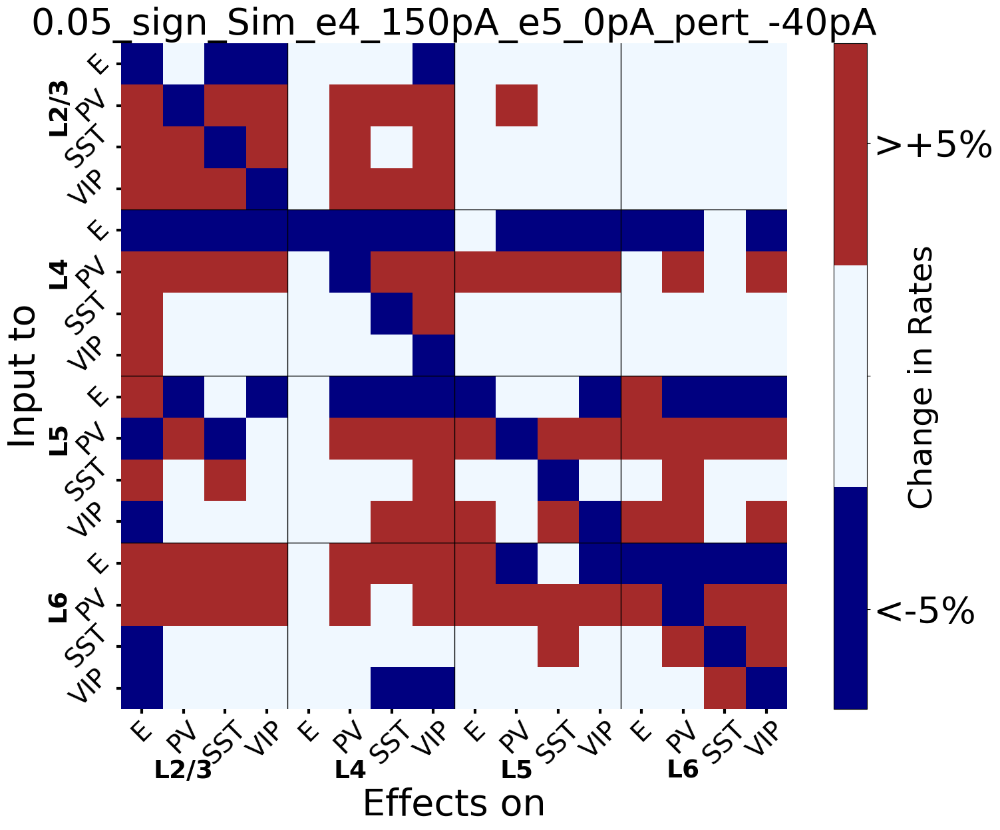

Plot saved for threshold 0.05 and perturbation -40pA.


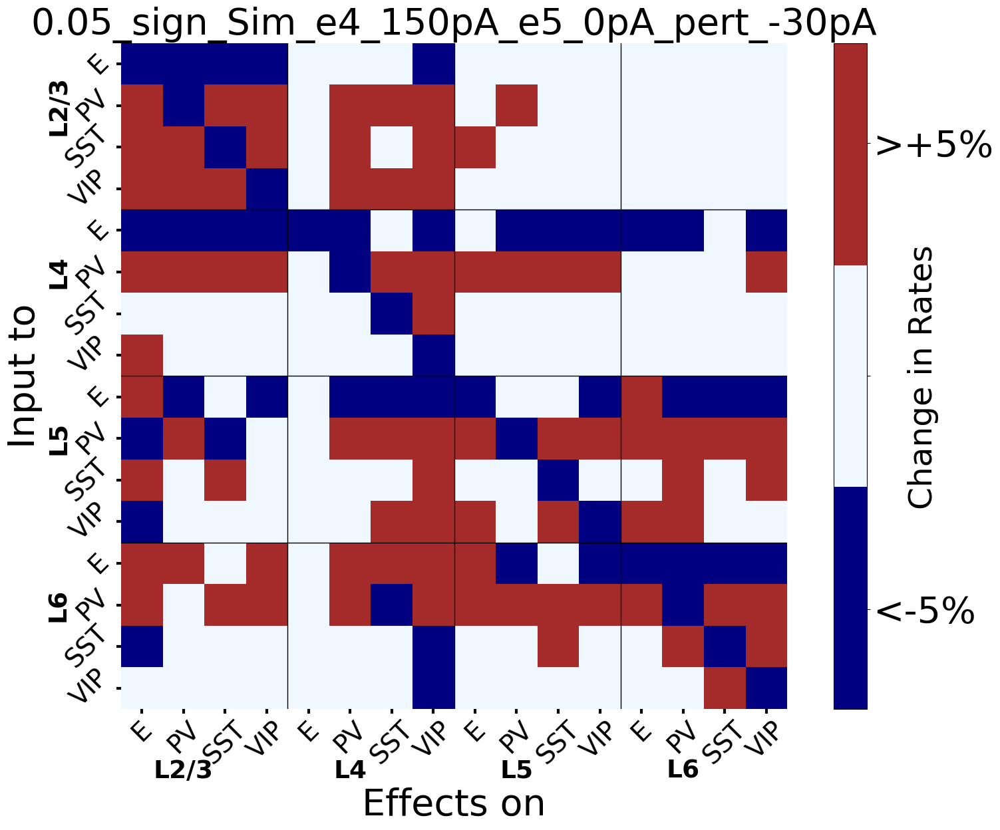

Plot saved for threshold 0.05 and perturbation -30pA.


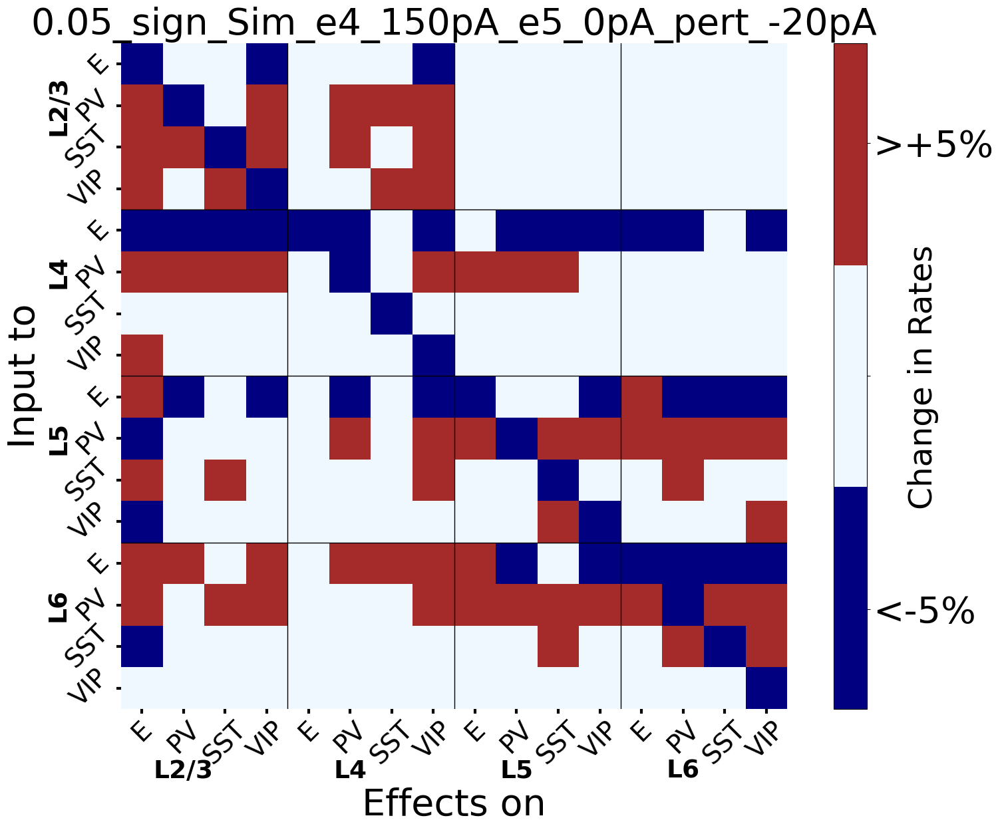

Plot saved for threshold 0.05 and perturbation -20pA.


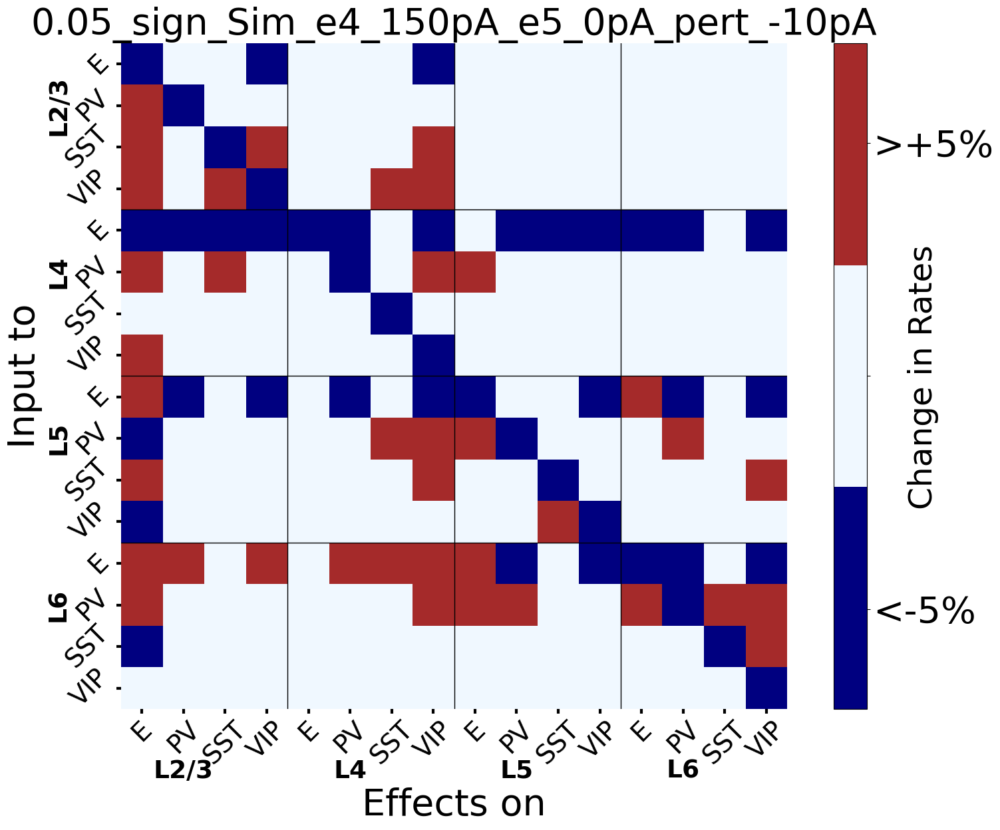

Plot saved for threshold 0.05 and perturbation -10pA.


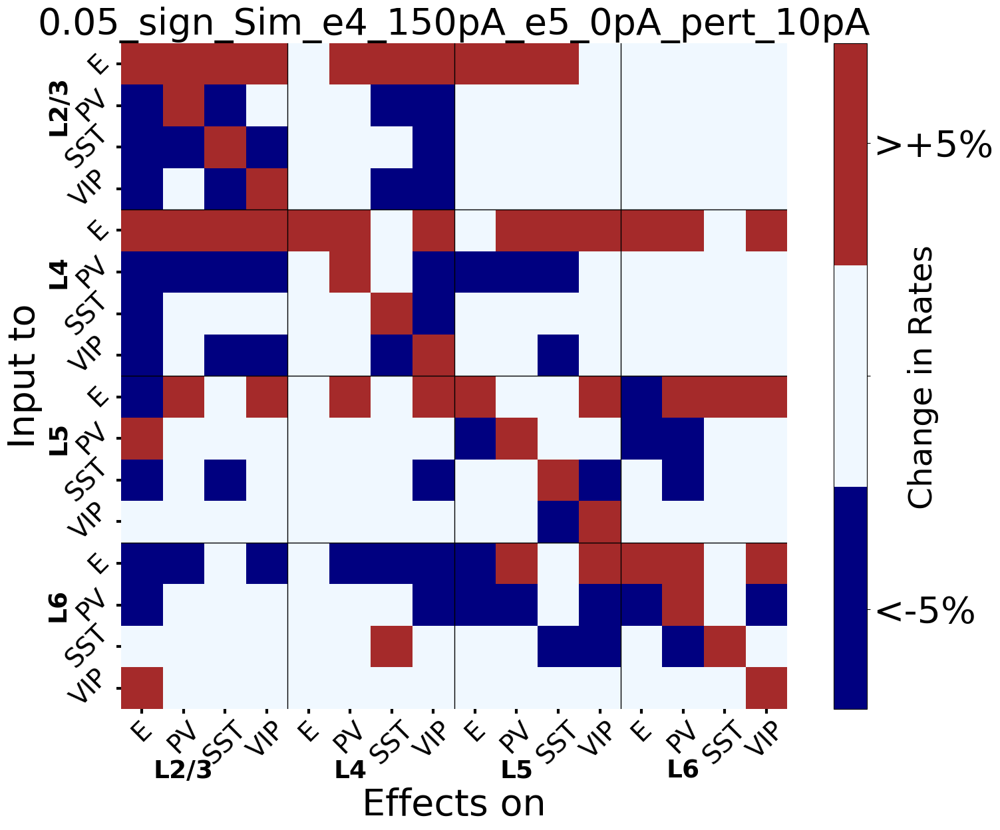

Plot saved for threshold 0.05 and perturbation 10pA.


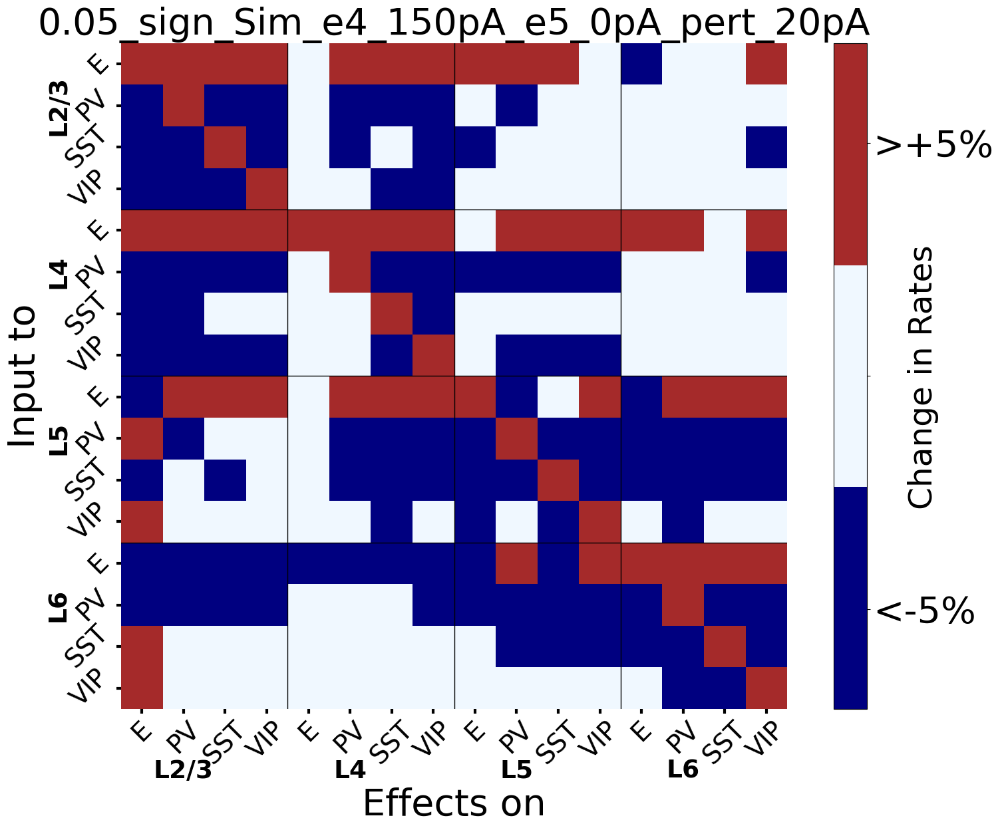

Plot saved for threshold 0.05 and perturbation 20pA.


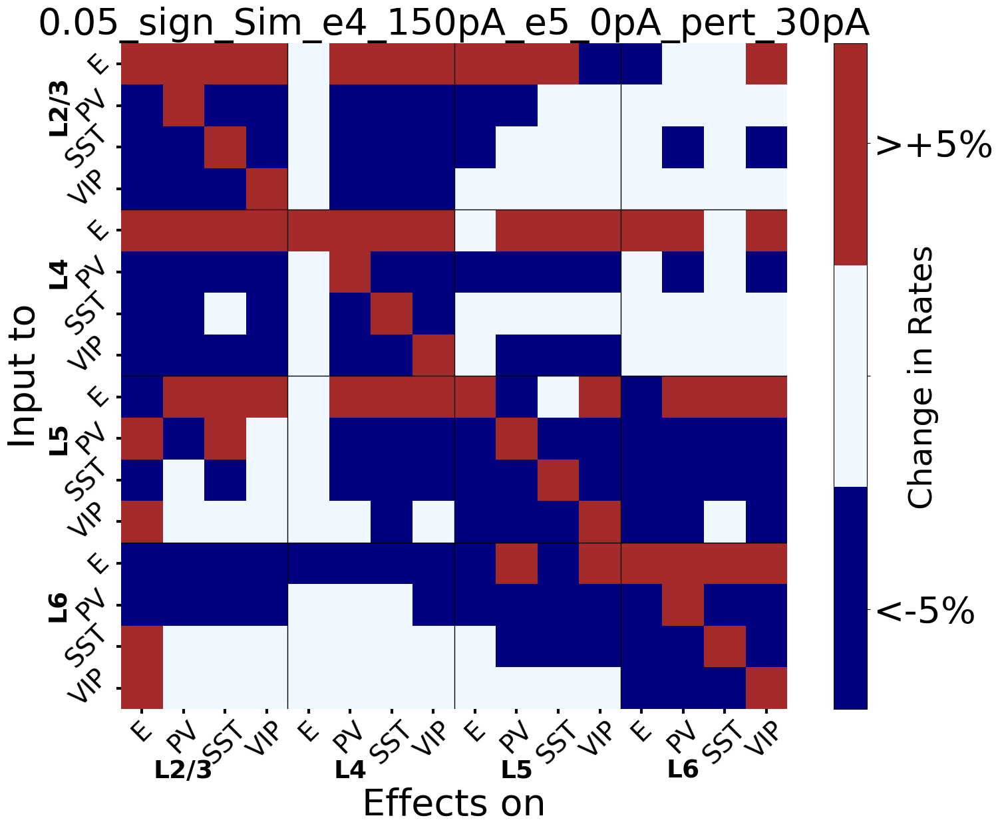

Plot saved for threshold 0.05 and perturbation 30pA.


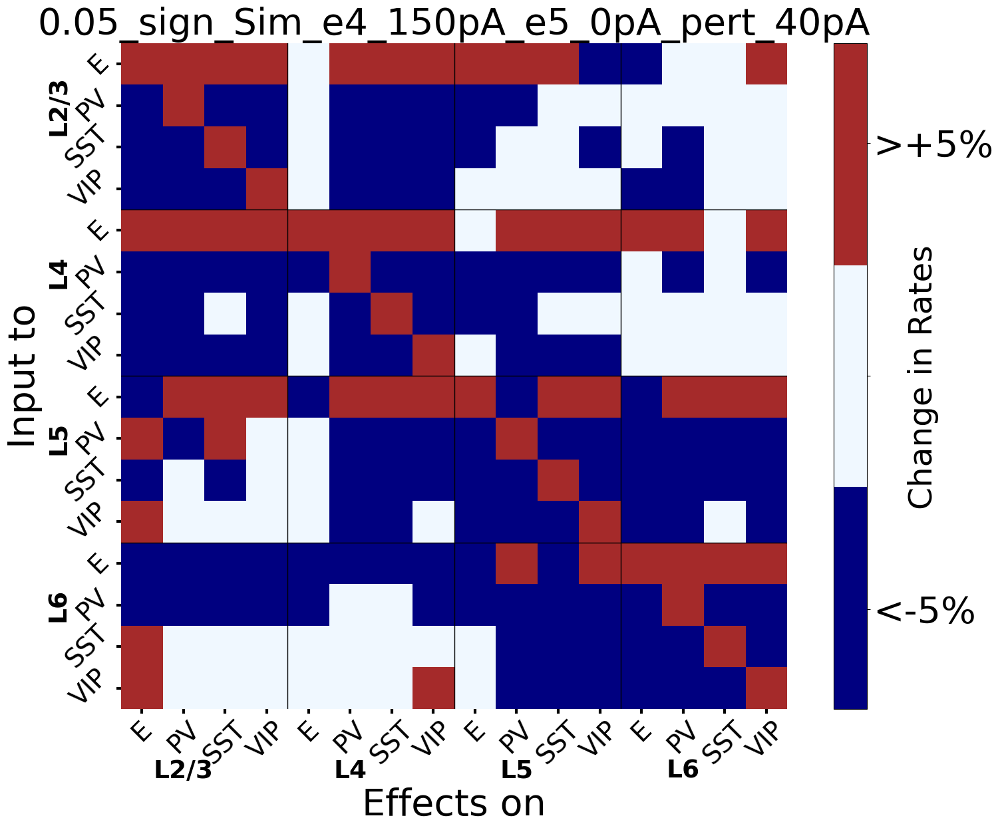

Plot saved for threshold 0.05 and perturbation 40pA.


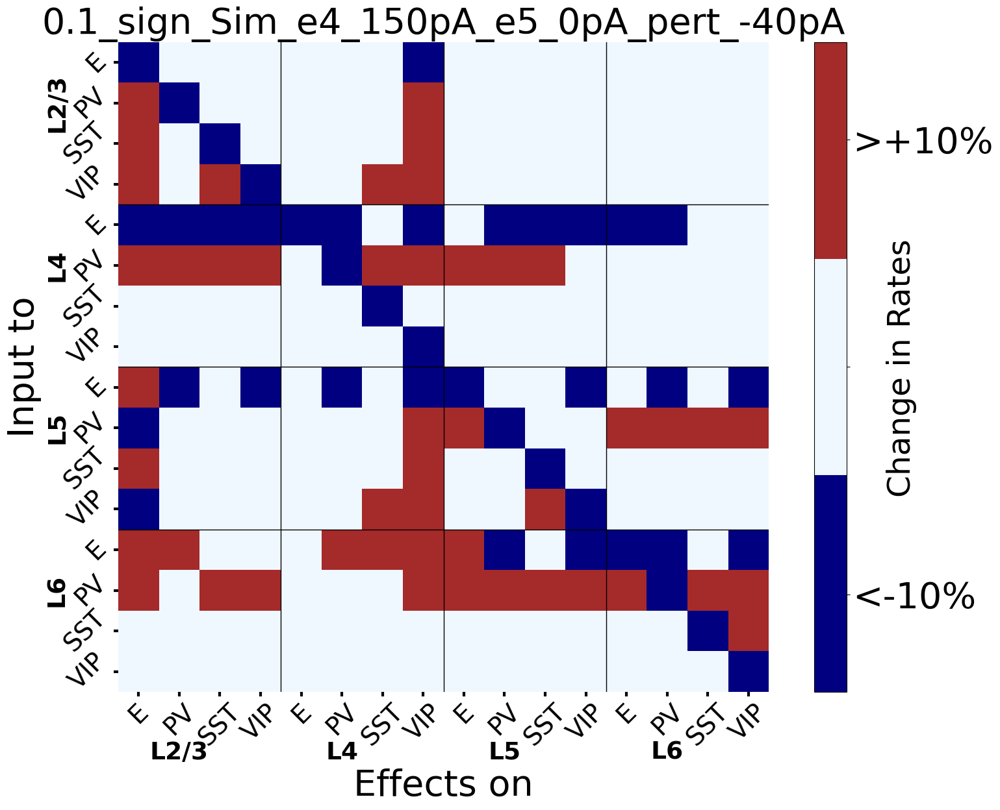

Plot saved for threshold 0.1 and perturbation -40pA.


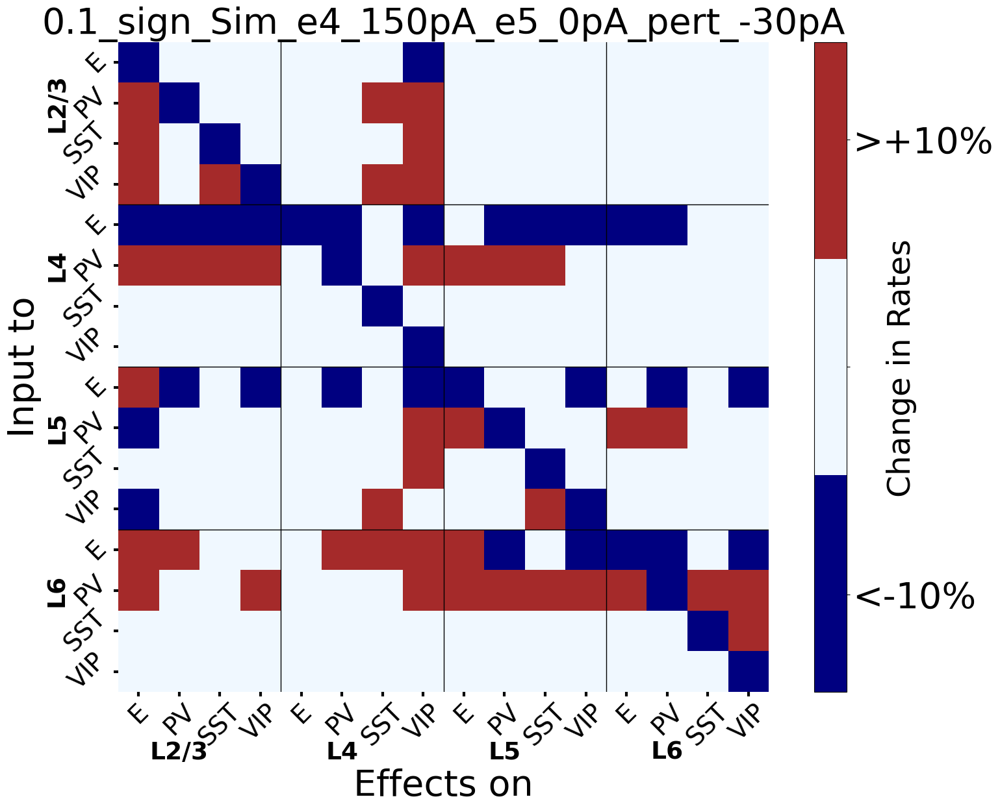

Plot saved for threshold 0.1 and perturbation -30pA.


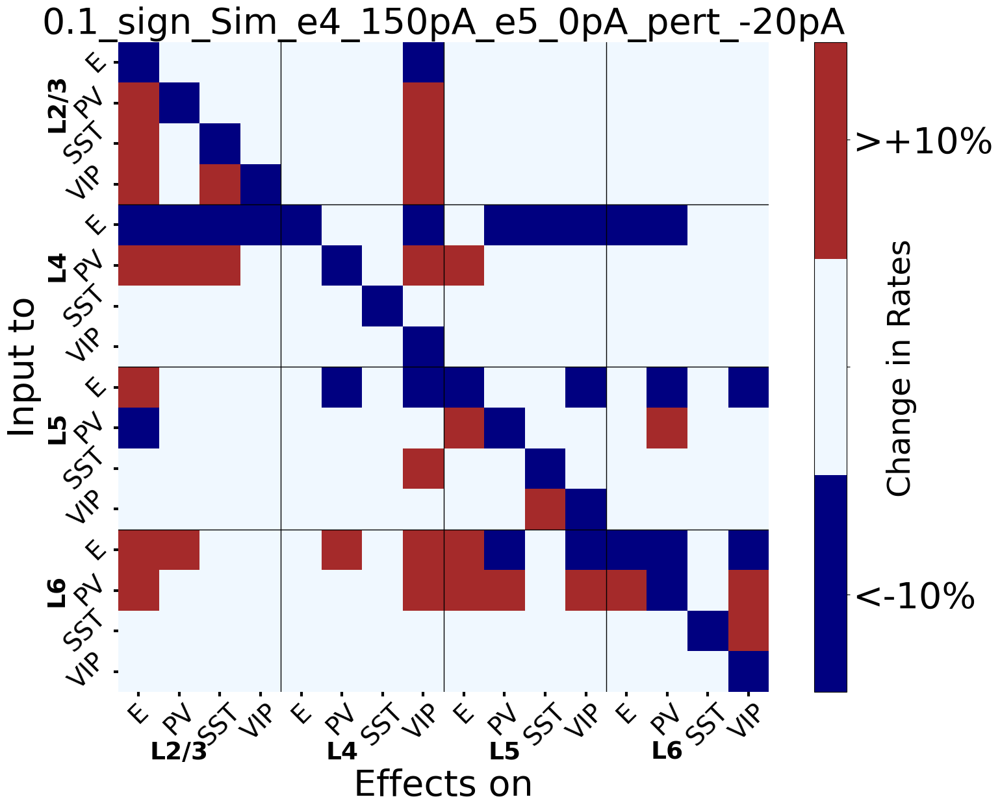

Plot saved for threshold 0.1 and perturbation -20pA.


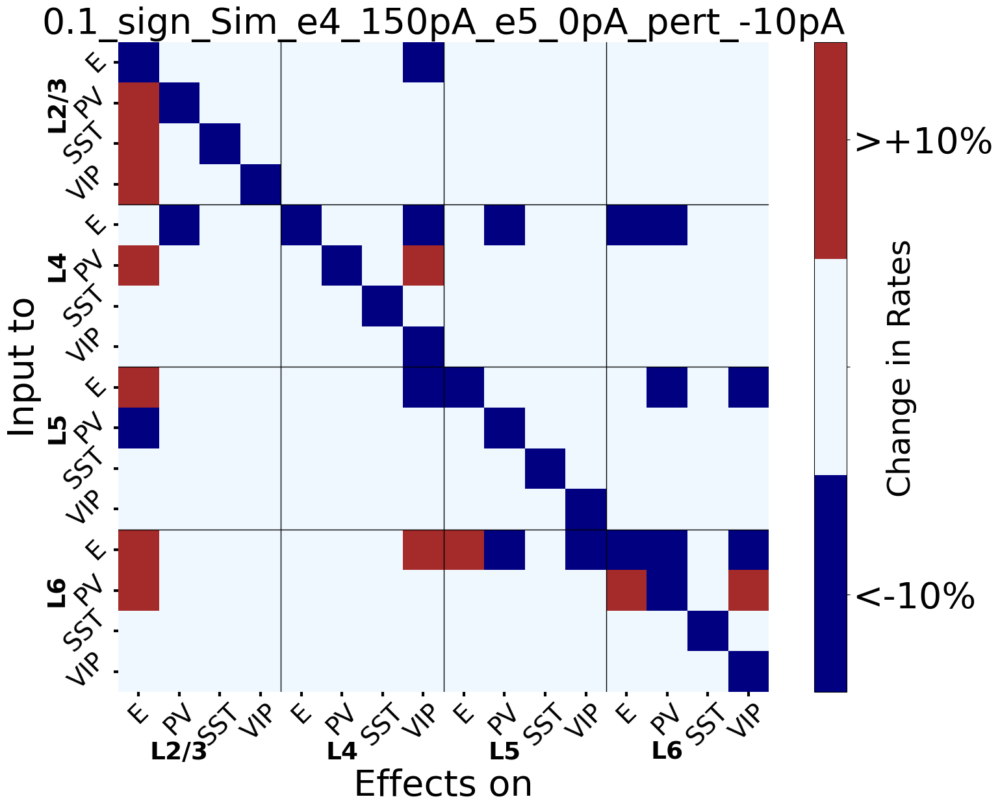

Plot saved for threshold 0.1 and perturbation -10pA.


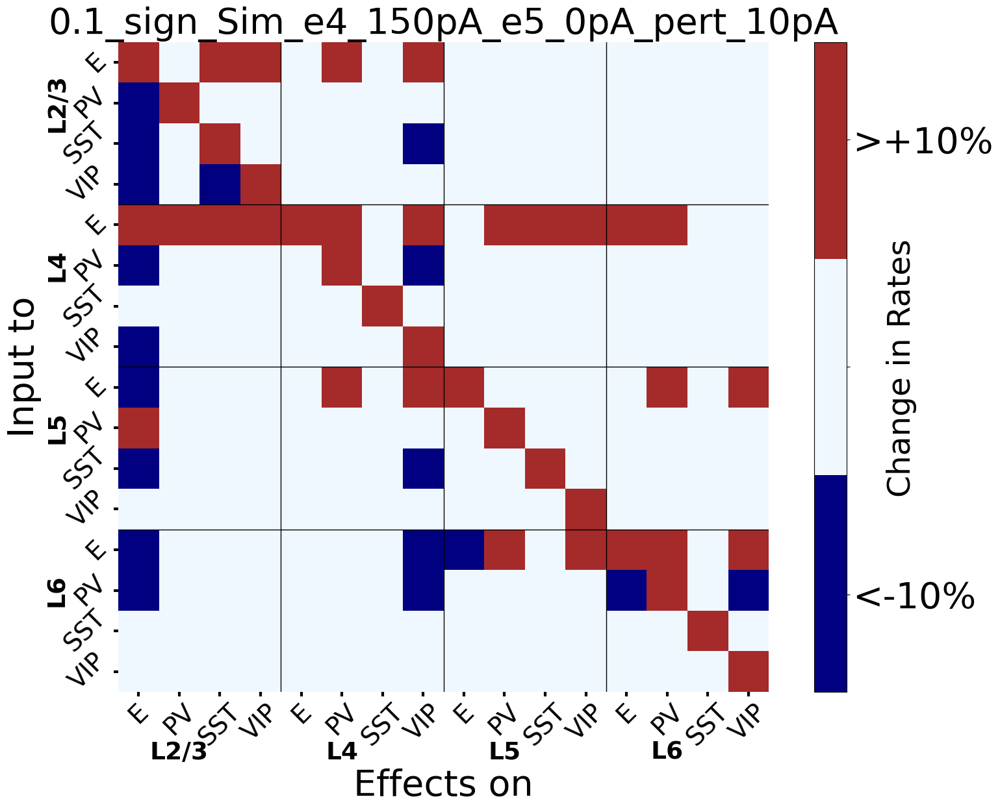

Plot saved for threshold 0.1 and perturbation 10pA.


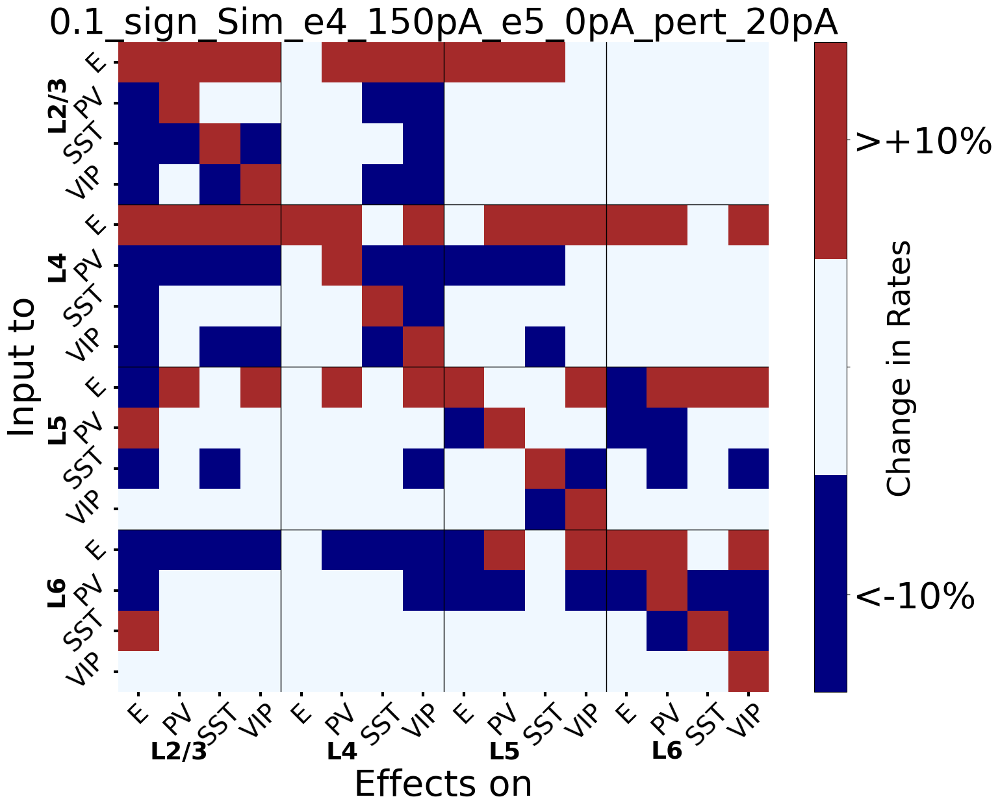

Plot saved for threshold 0.1 and perturbation 20pA.


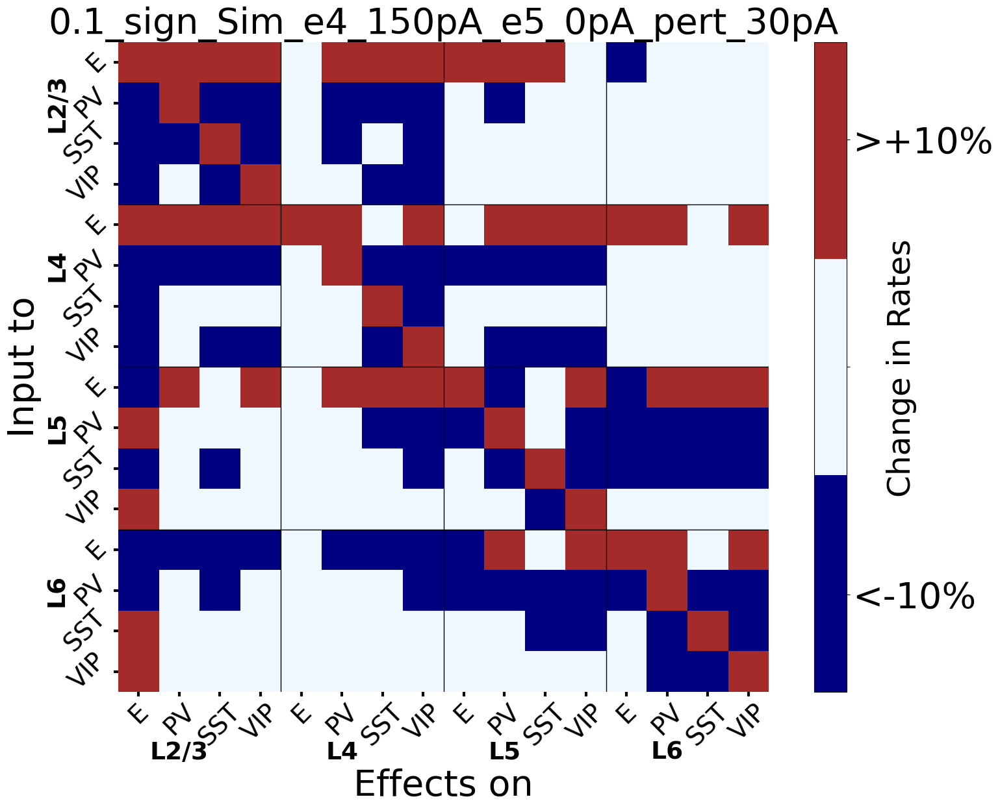

Plot saved for threshold 0.1 and perturbation 30pA.


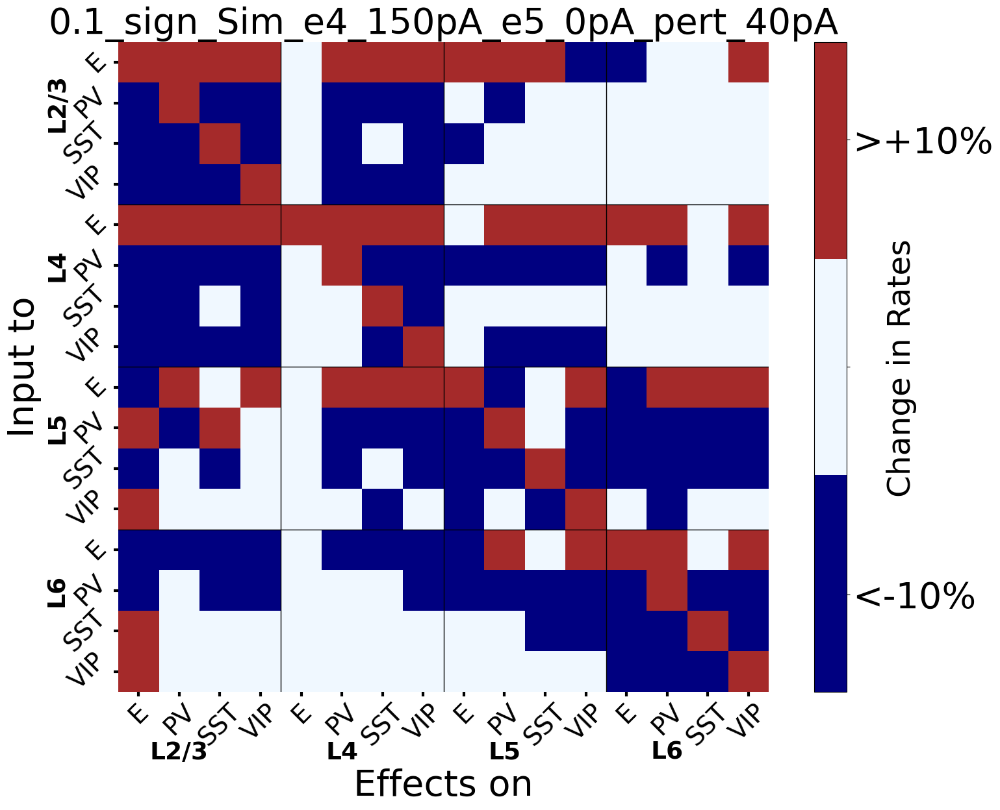

Plot saved for threshold 0.1 and perturbation 40pA.


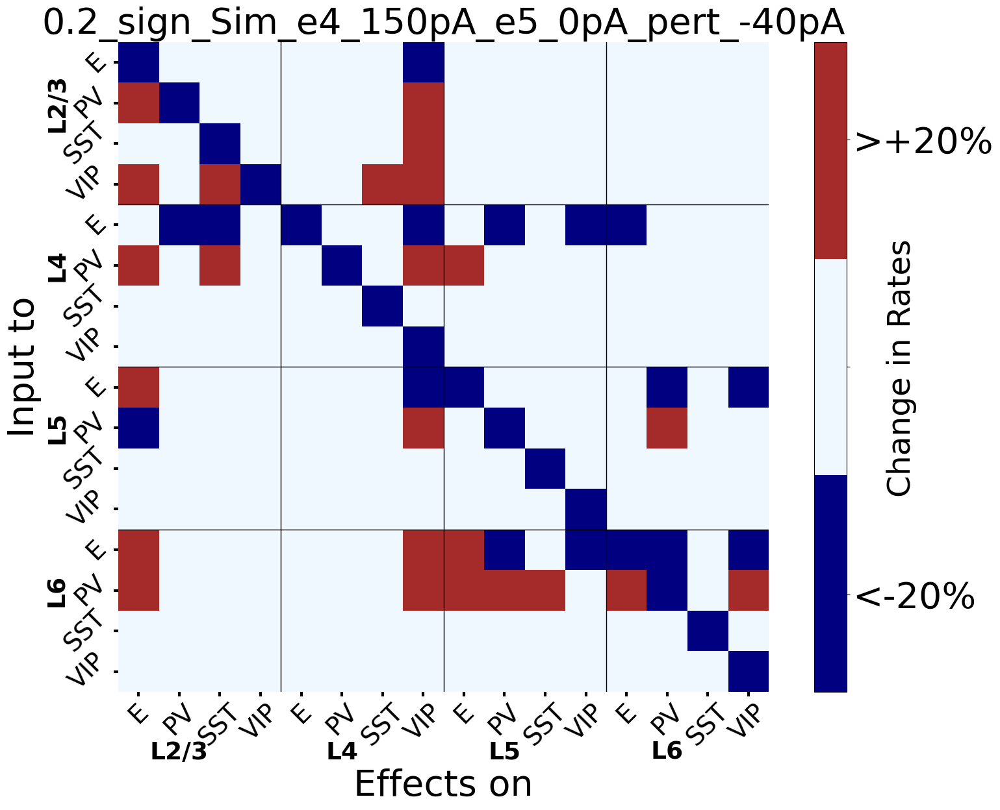

Plot saved for threshold 0.2 and perturbation -40pA.


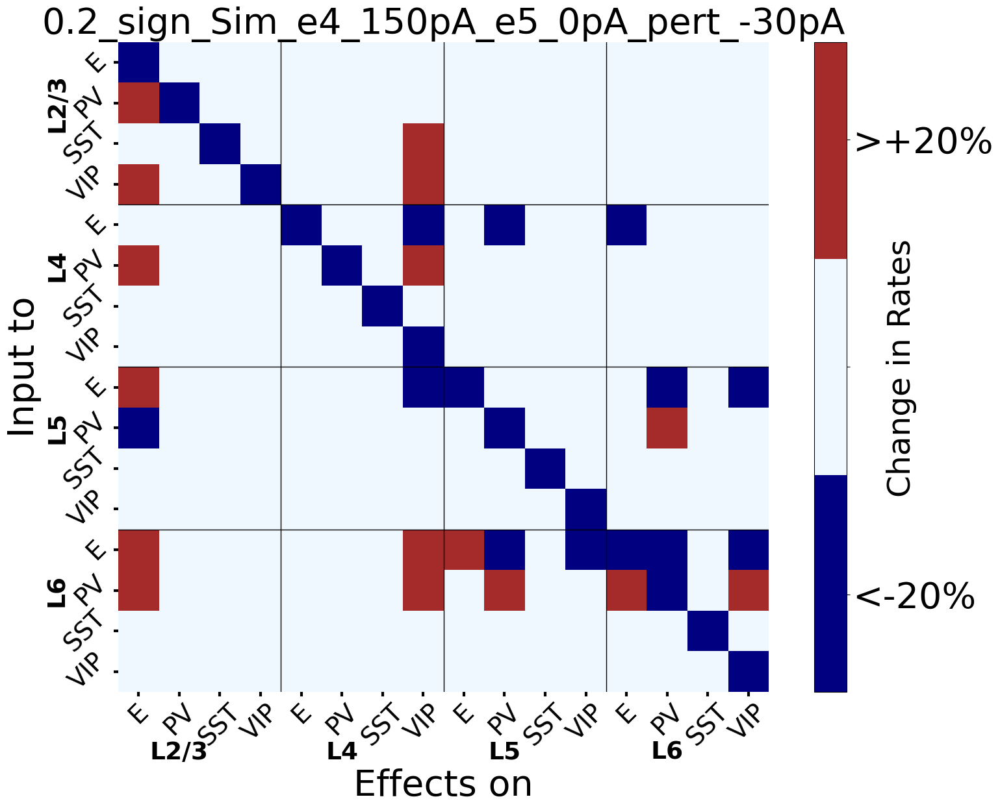

Plot saved for threshold 0.2 and perturbation -30pA.


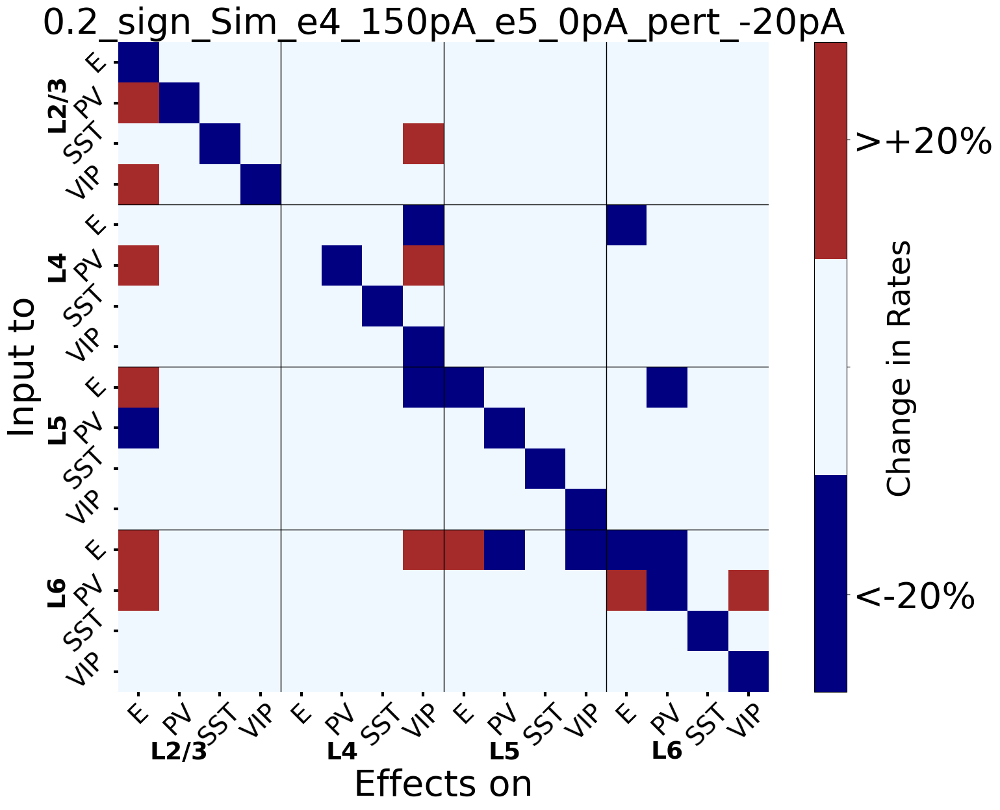

Plot saved for threshold 0.2 and perturbation -20pA.


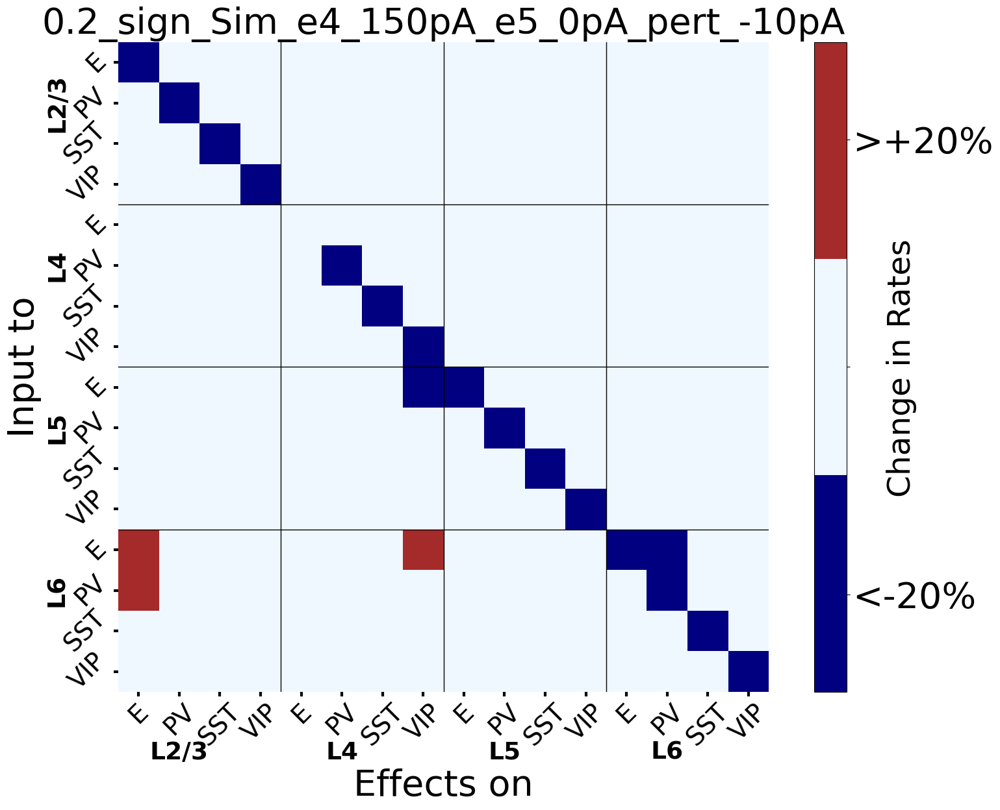

Plot saved for threshold 0.2 and perturbation -10pA.


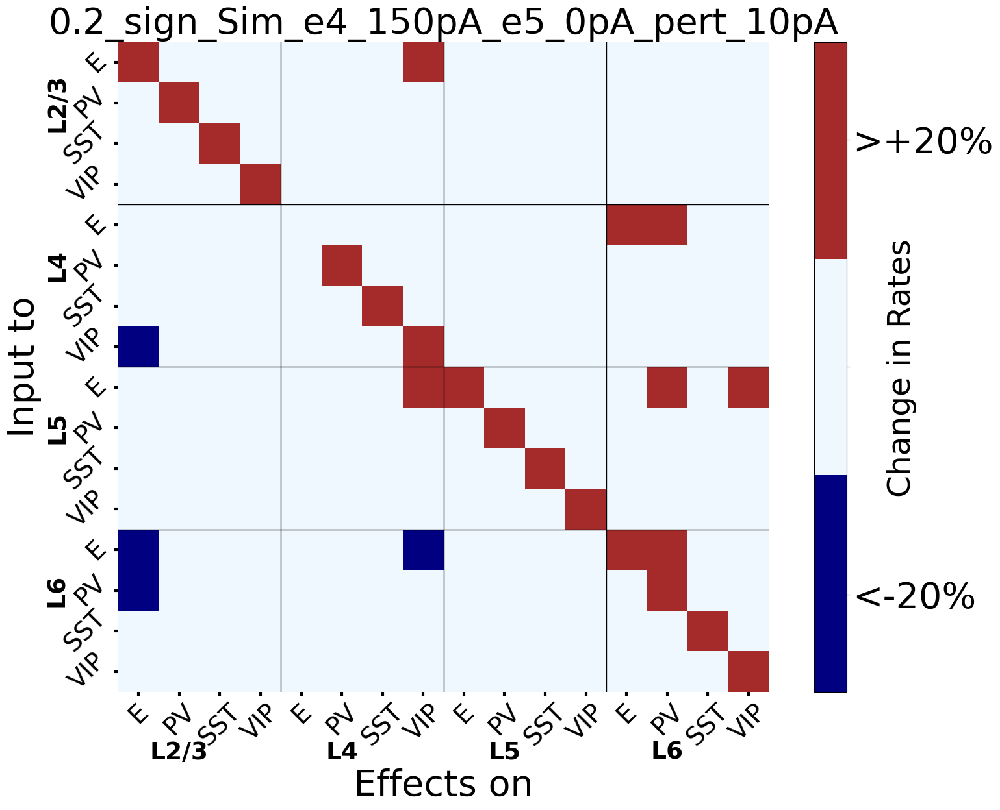

Plot saved for threshold 0.2 and perturbation 10pA.


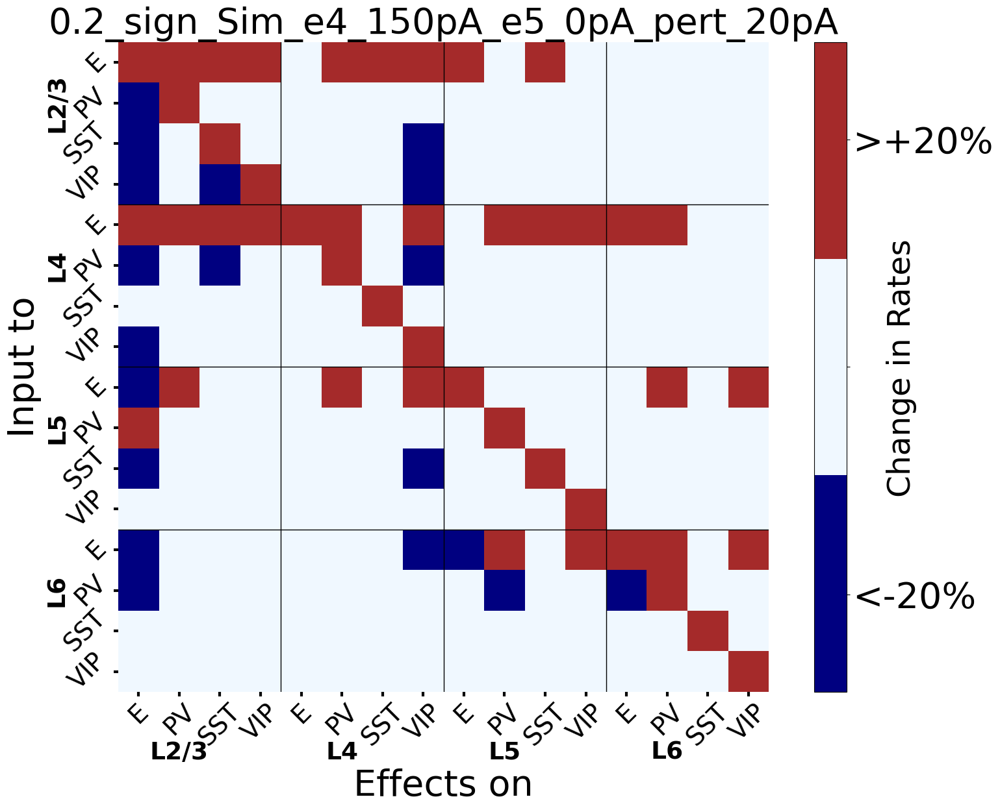

Plot saved for threshold 0.2 and perturbation 20pA.


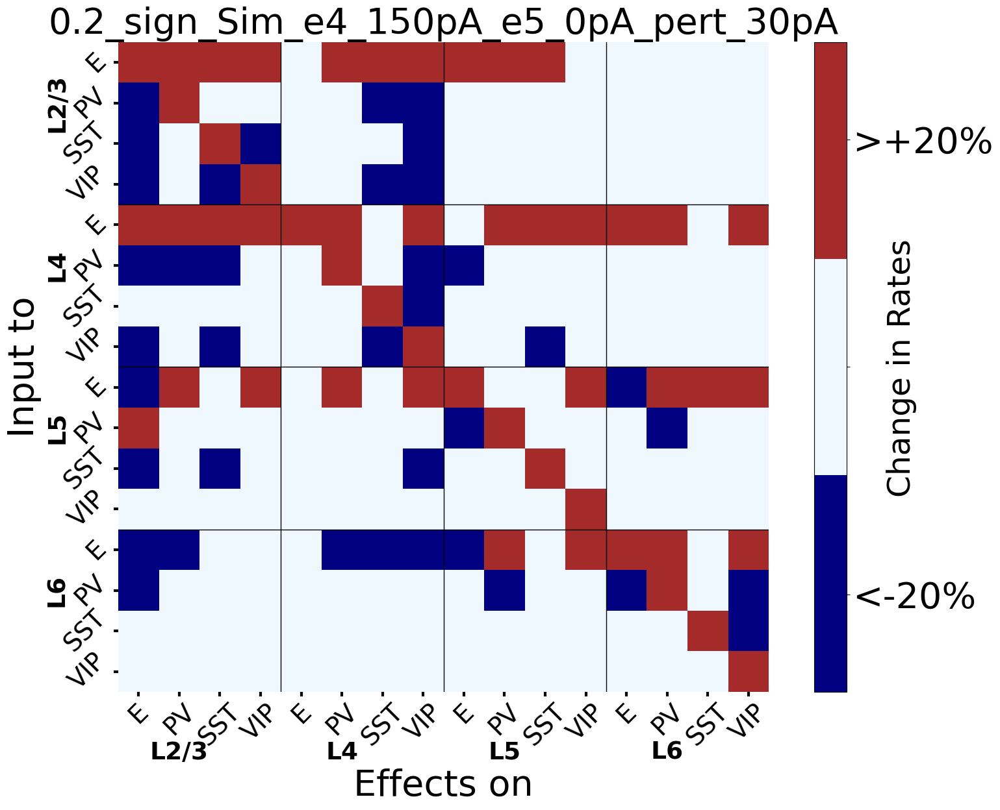

Plot saved for threshold 0.2 and perturbation 30pA.


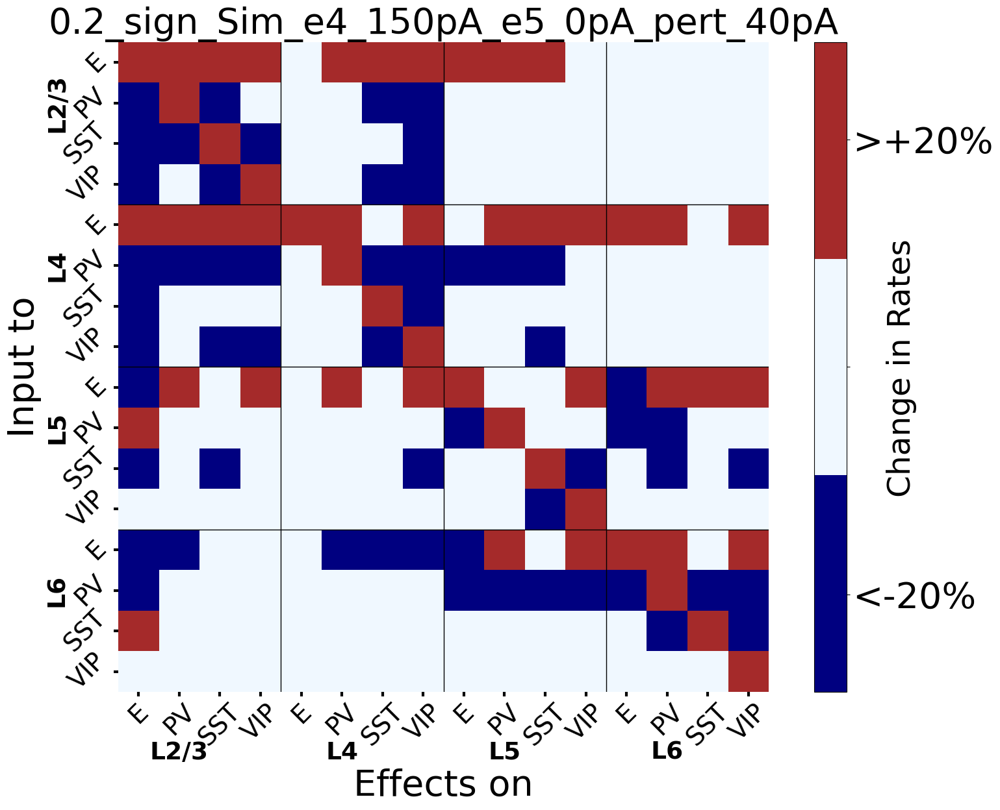

Plot saved for threshold 0.2 and perturbation 40pA.


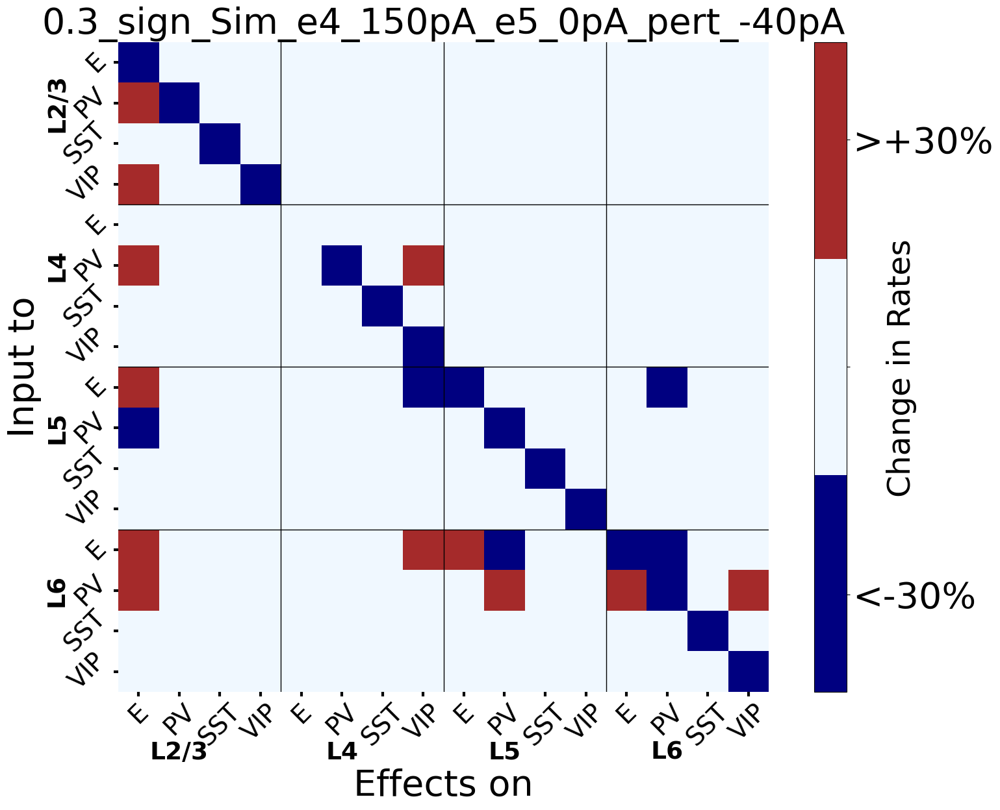

Plot saved for threshold 0.3 and perturbation -40pA.


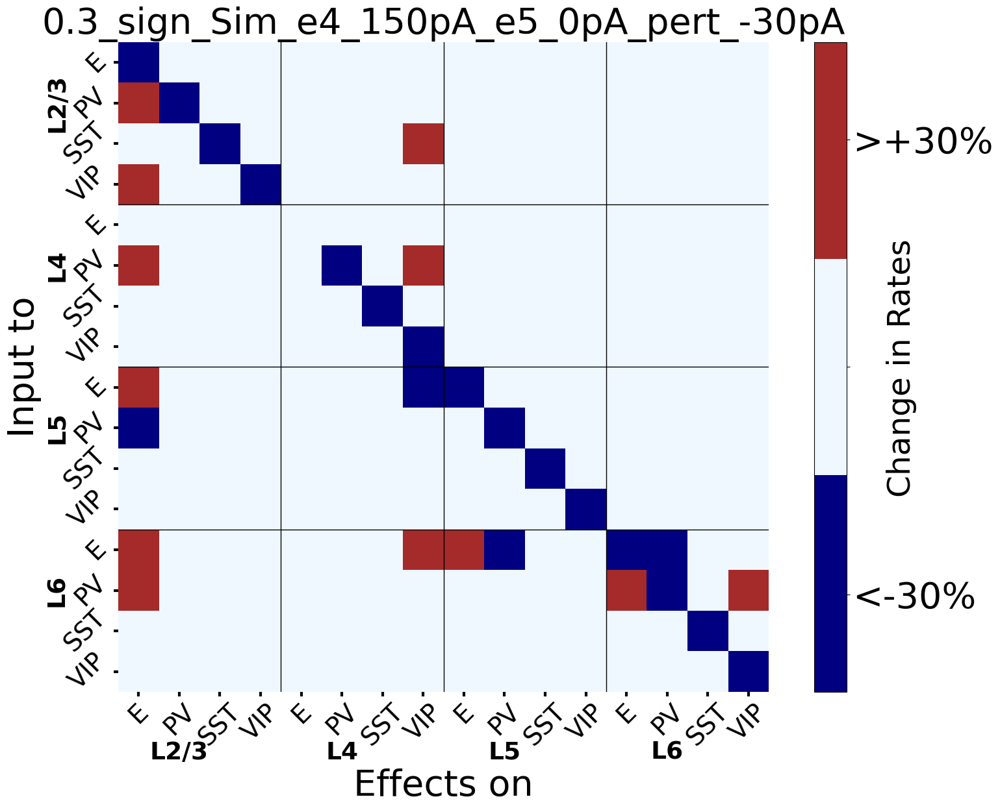

Plot saved for threshold 0.3 and perturbation -30pA.


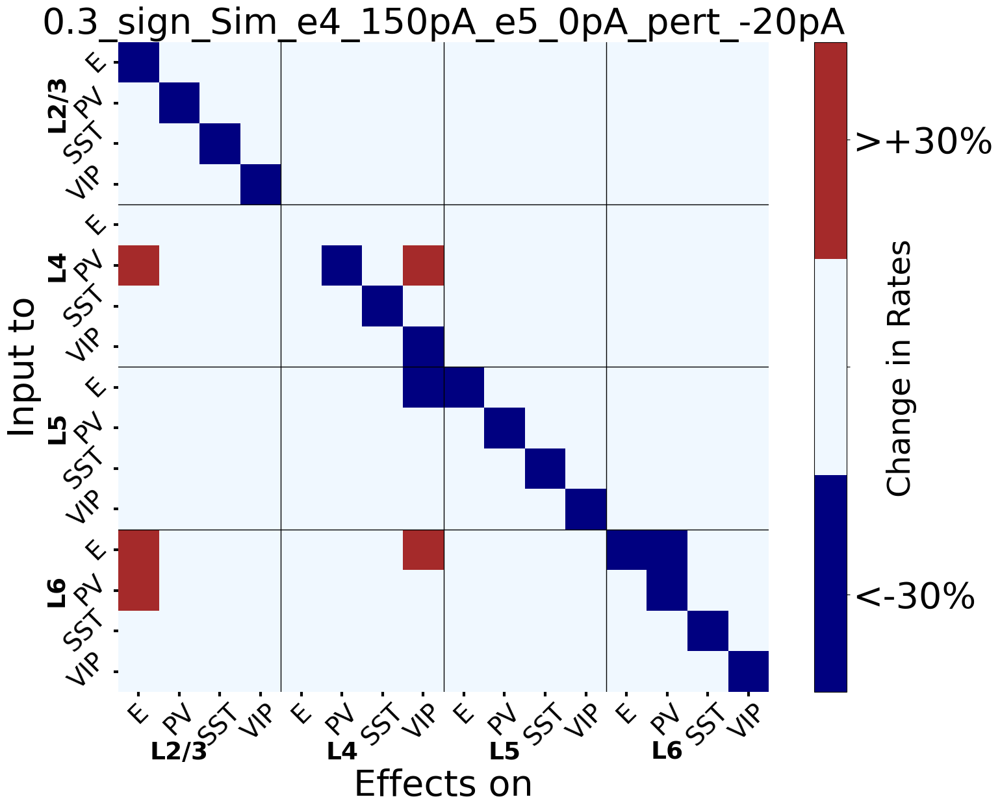

Plot saved for threshold 0.3 and perturbation -20pA.


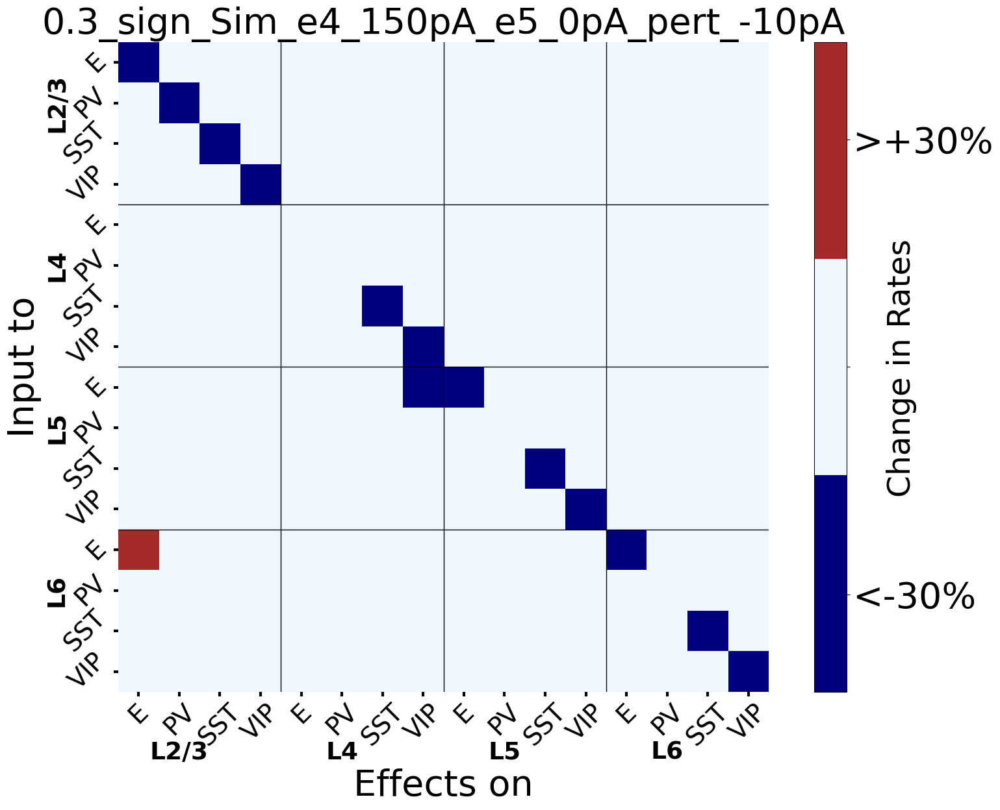

Plot saved for threshold 0.3 and perturbation -10pA.


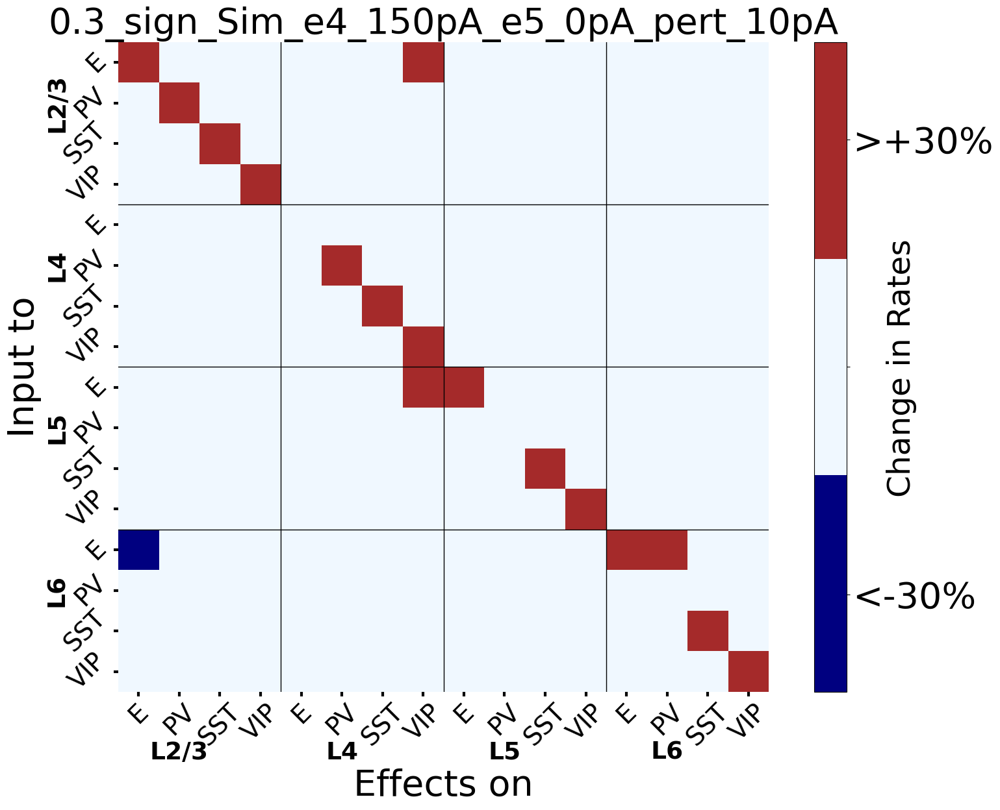

Plot saved for threshold 0.3 and perturbation 10pA.


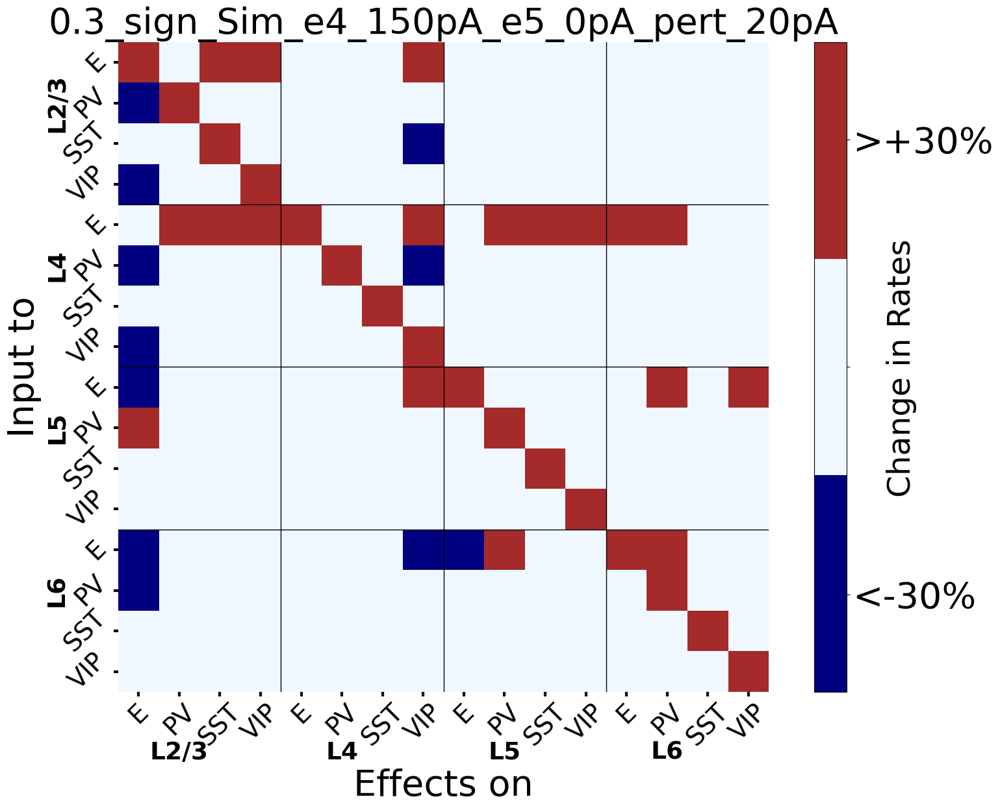

Plot saved for threshold 0.3 and perturbation 20pA.


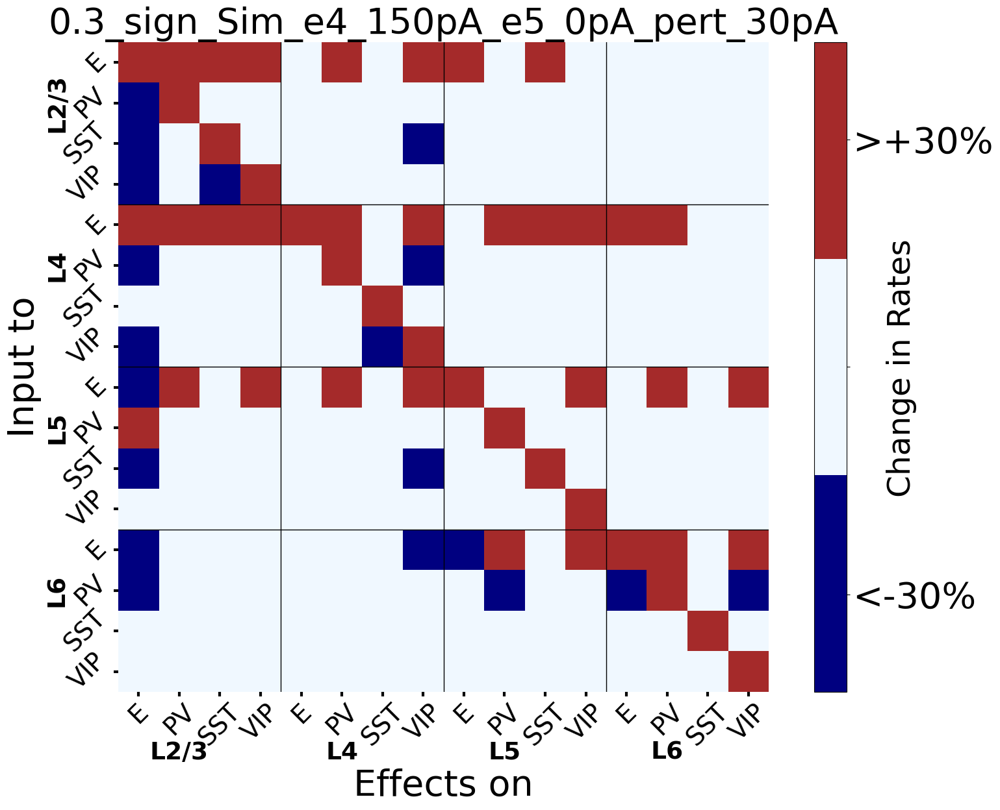

Plot saved for threshold 0.3 and perturbation 30pA.


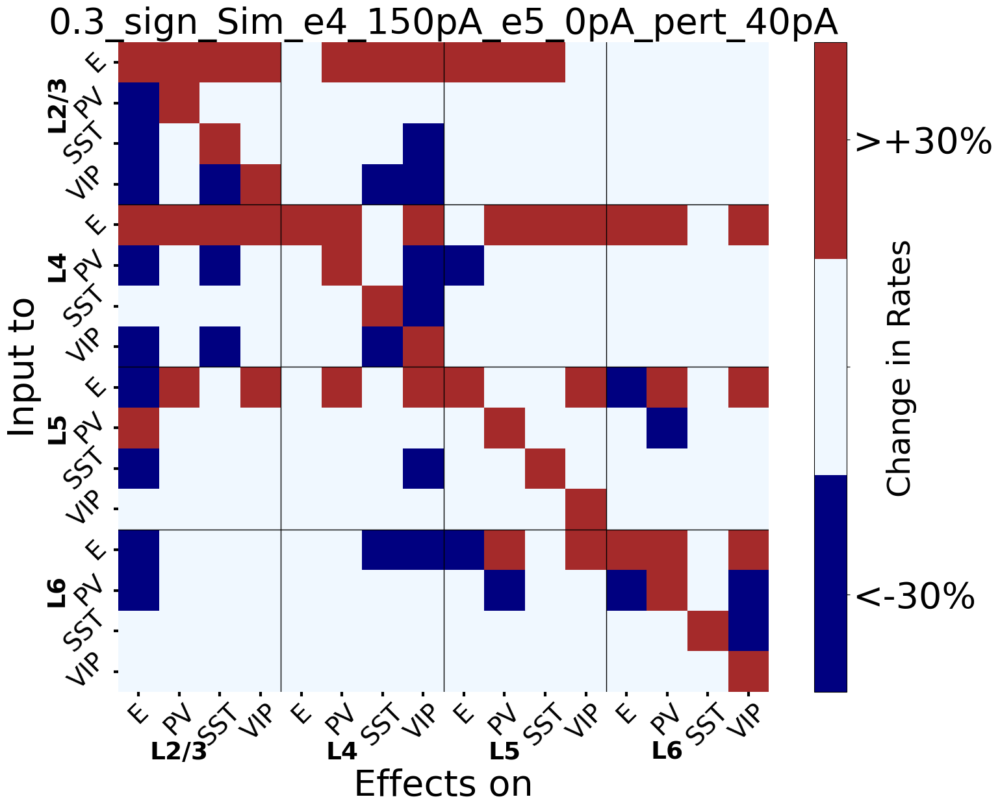

Plot saved for threshold 0.3 and perturbation 40pA.


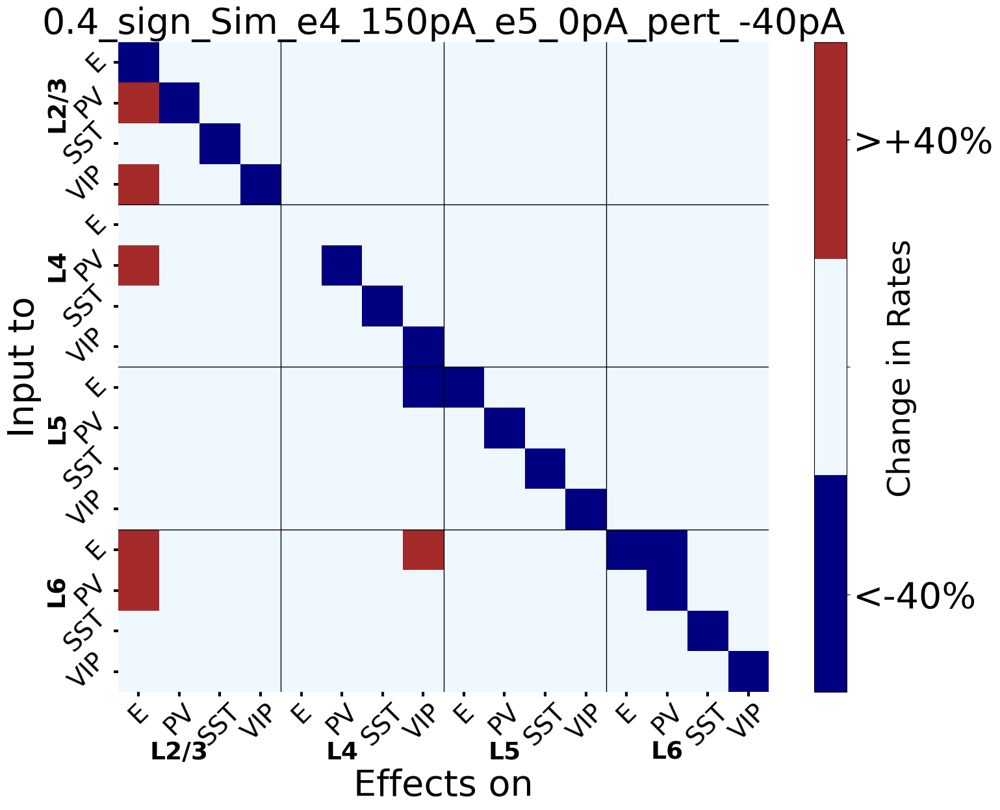

Plot saved for threshold 0.4 and perturbation -40pA.


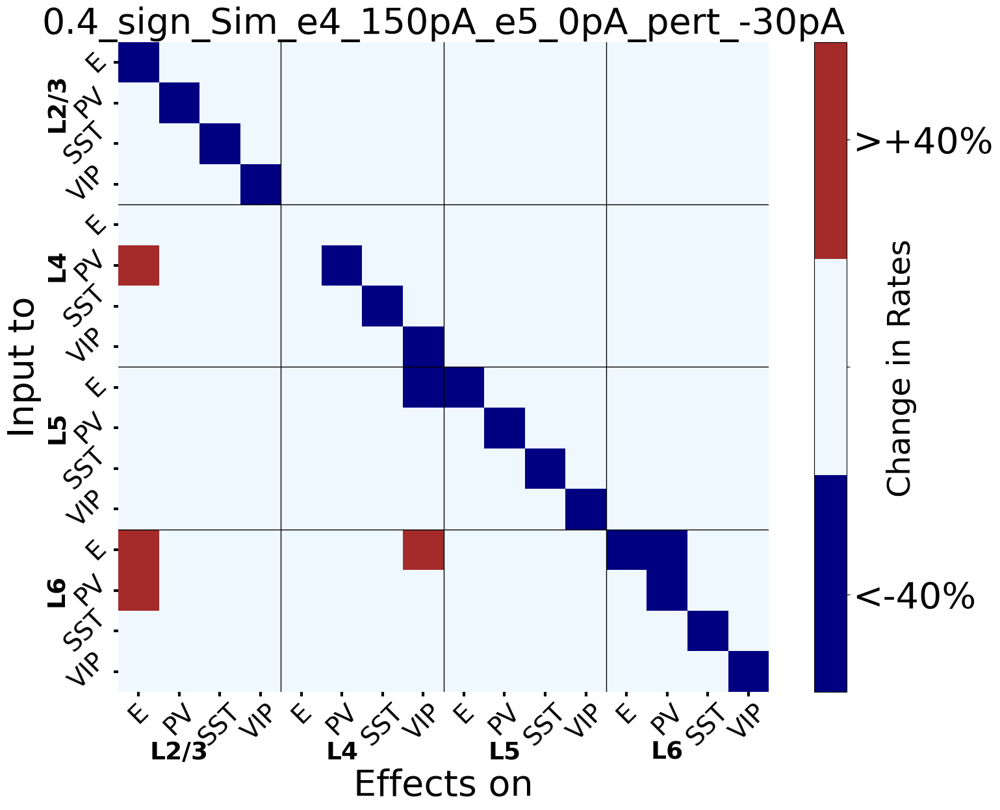

Plot saved for threshold 0.4 and perturbation -30pA.


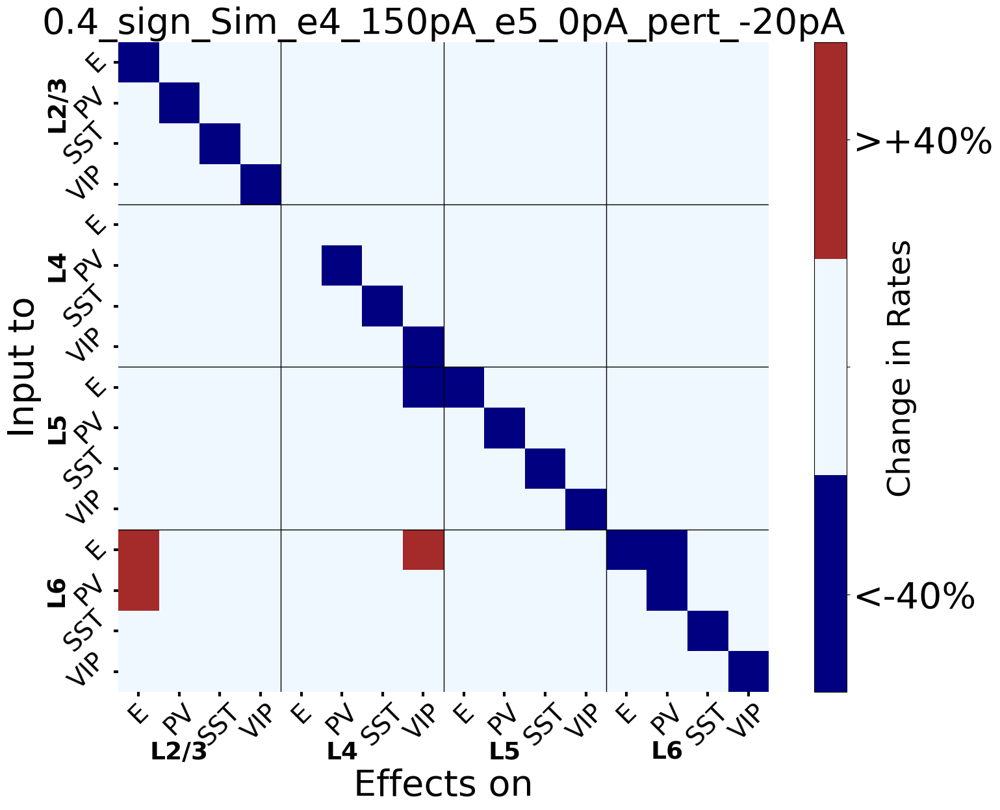

Plot saved for threshold 0.4 and perturbation -20pA.


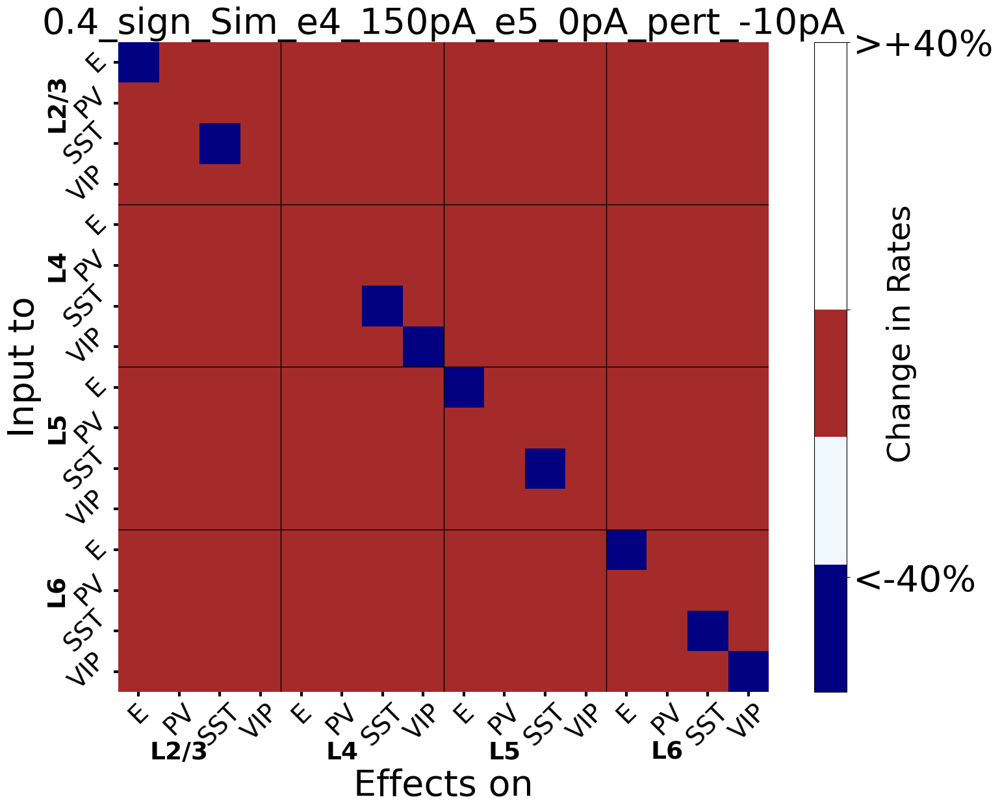

Plot saved for threshold 0.4 and perturbation -10pA.


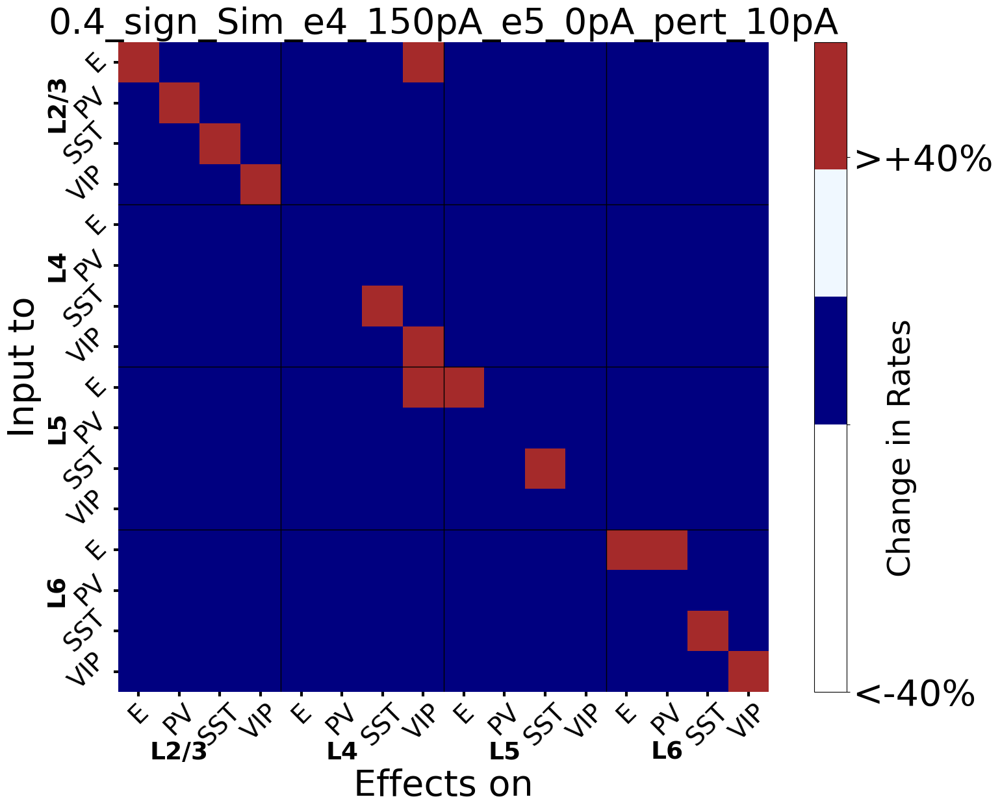

Plot saved for threshold 0.4 and perturbation 10pA.


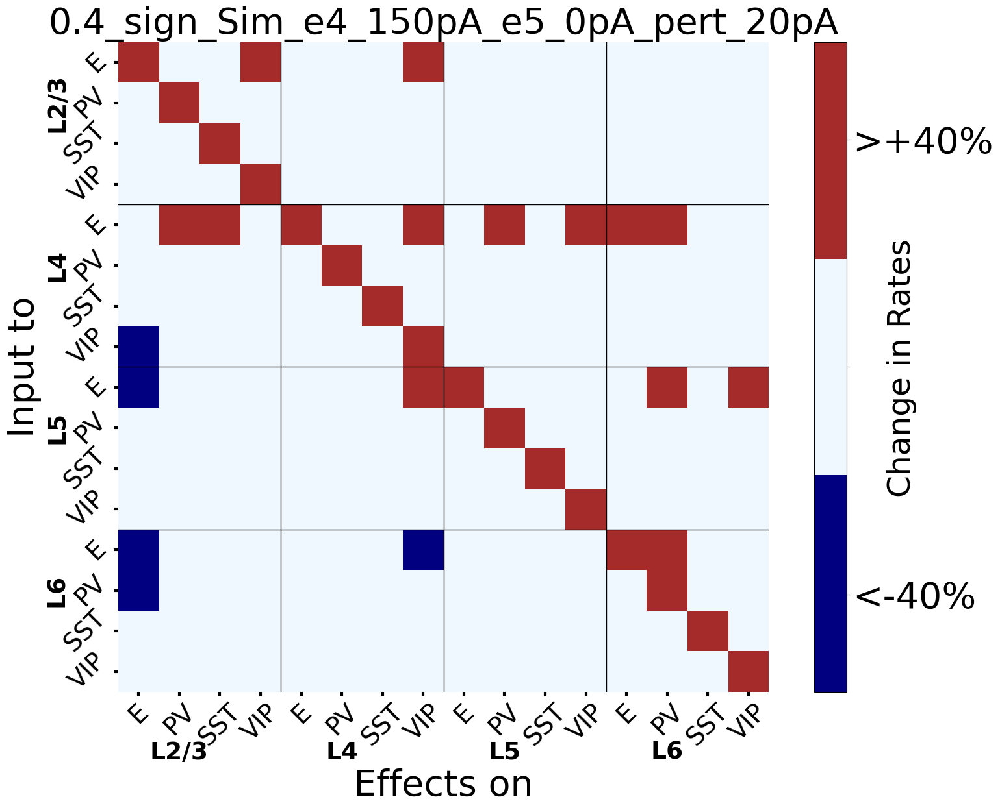

Plot saved for threshold 0.4 and perturbation 20pA.


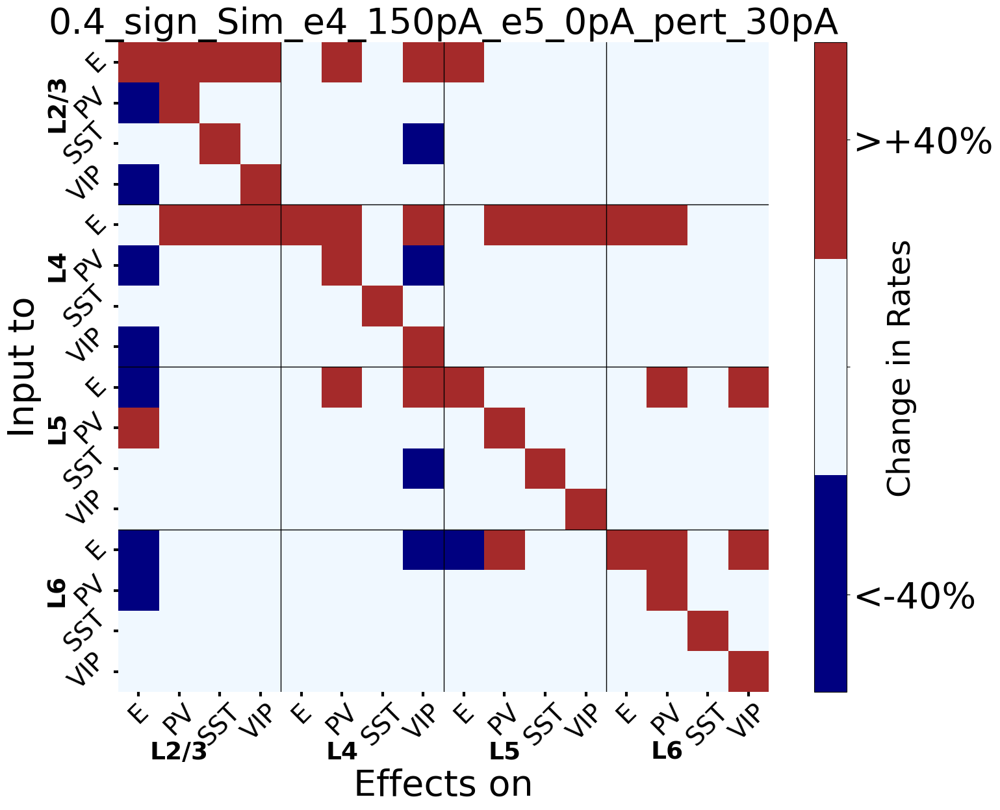

Plot saved for threshold 0.4 and perturbation 30pA.


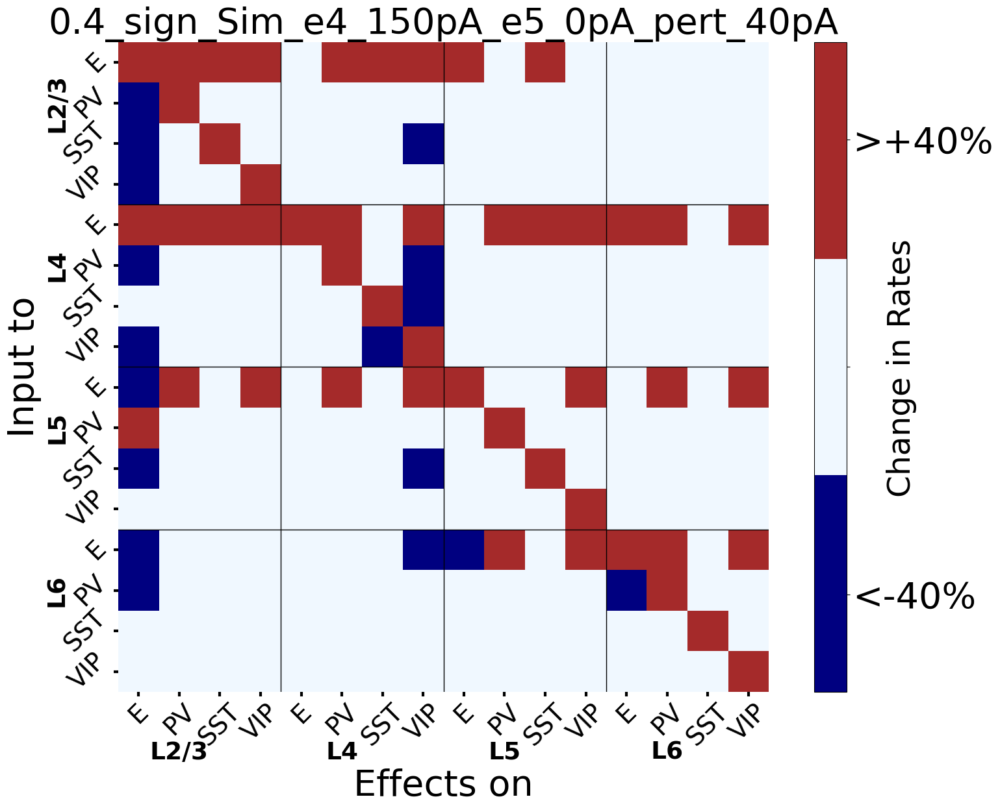

Plot saved for threshold 0.4 and perturbation 40pA.


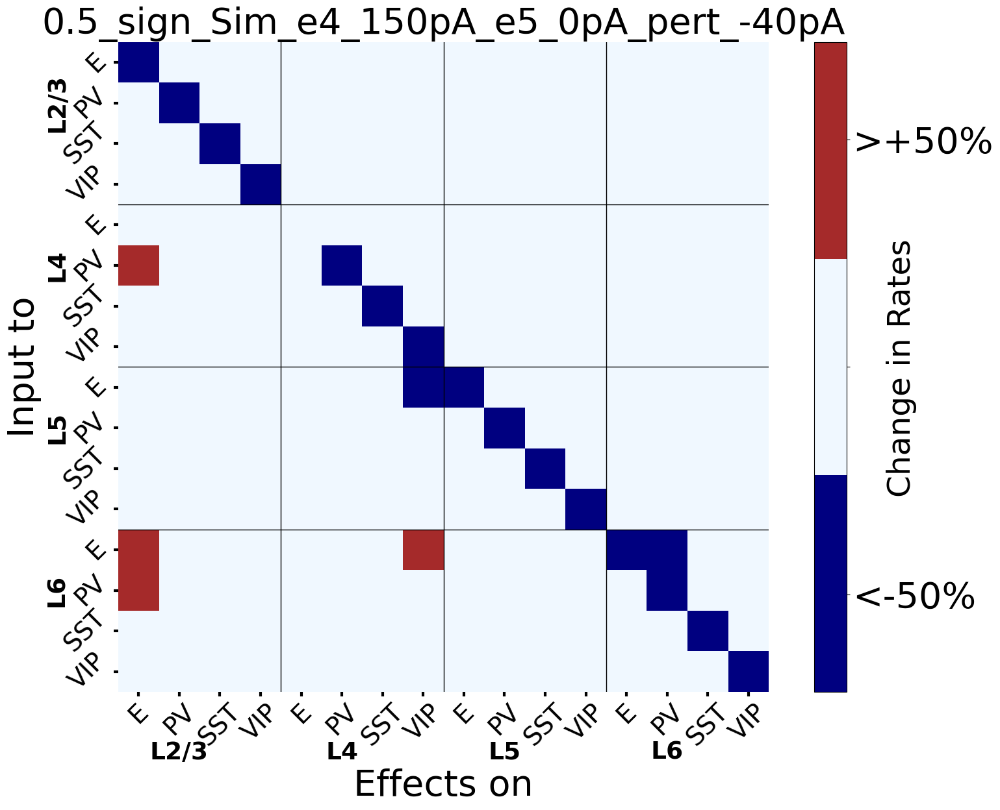

Plot saved for threshold 0.5 and perturbation -40pA.


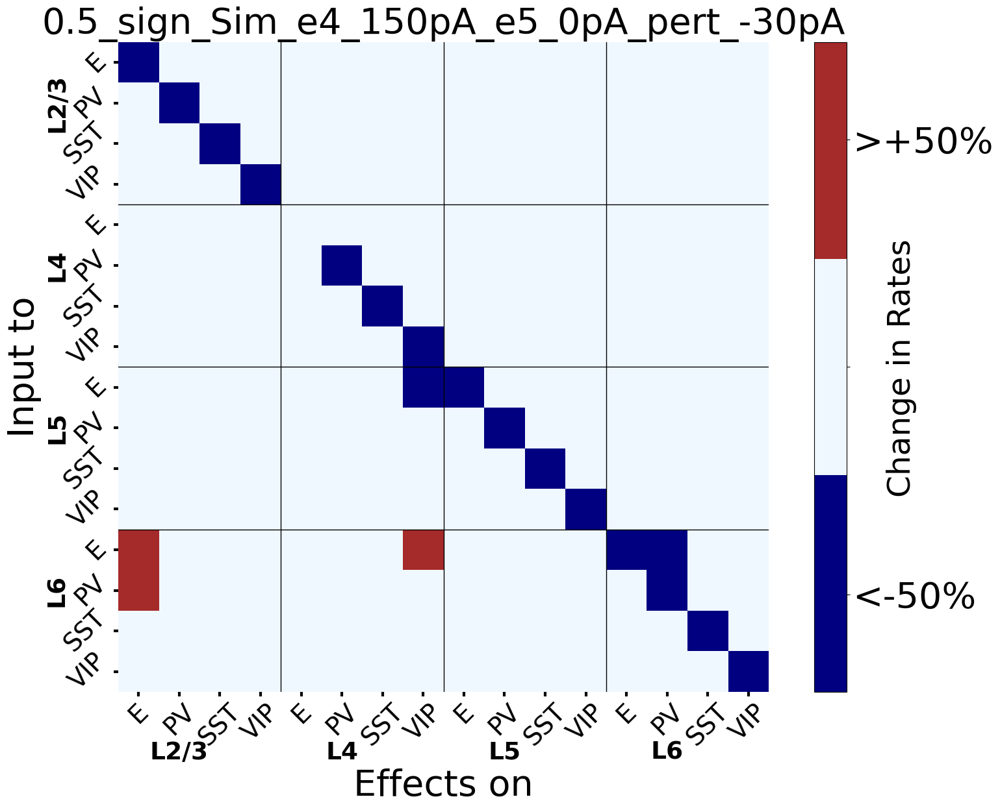

Plot saved for threshold 0.5 and perturbation -30pA.


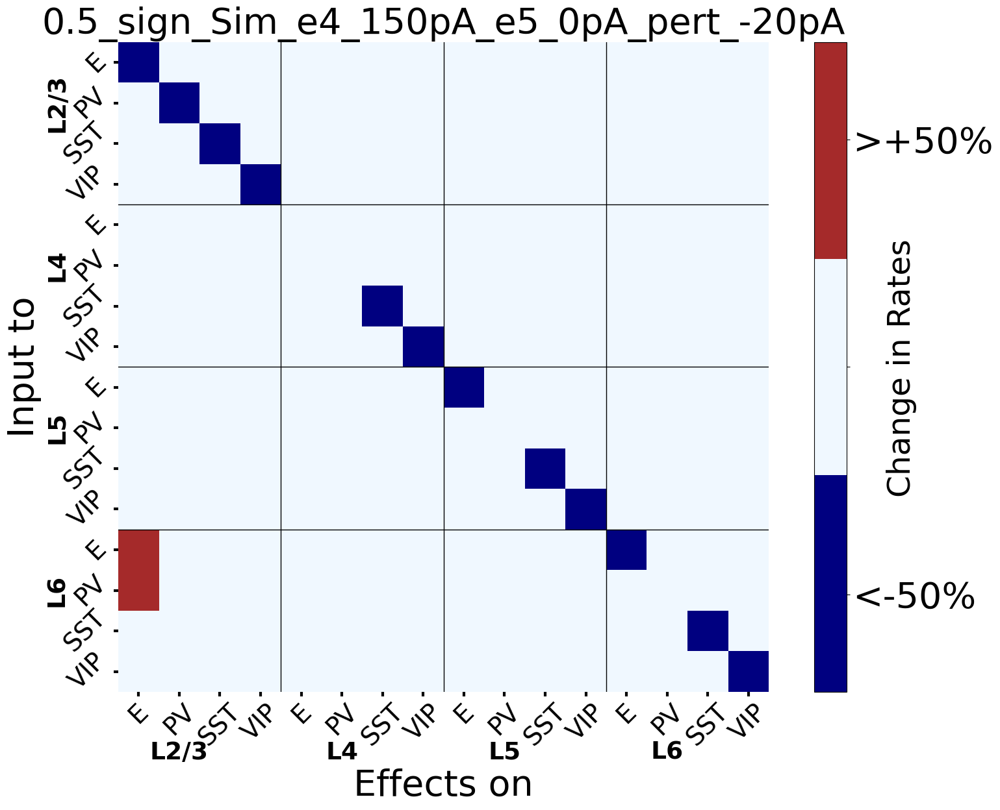

Plot saved for threshold 0.5 and perturbation -20pA.


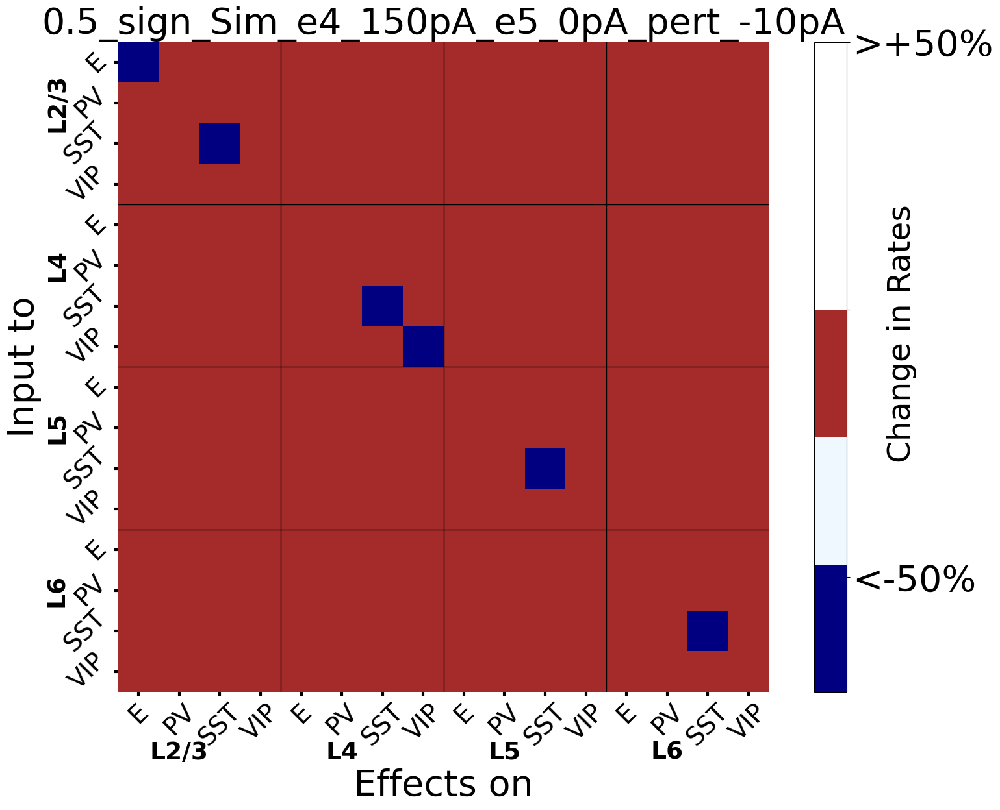

Plot saved for threshold 0.5 and perturbation -10pA.


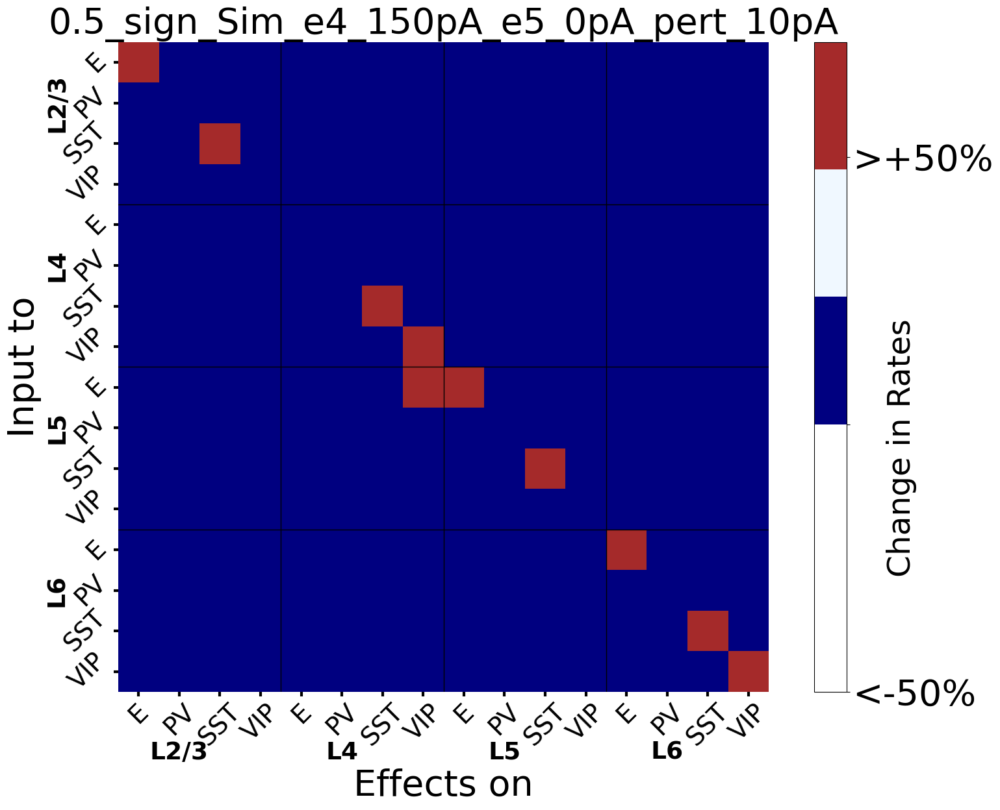

Plot saved for threshold 0.5 and perturbation 10pA.


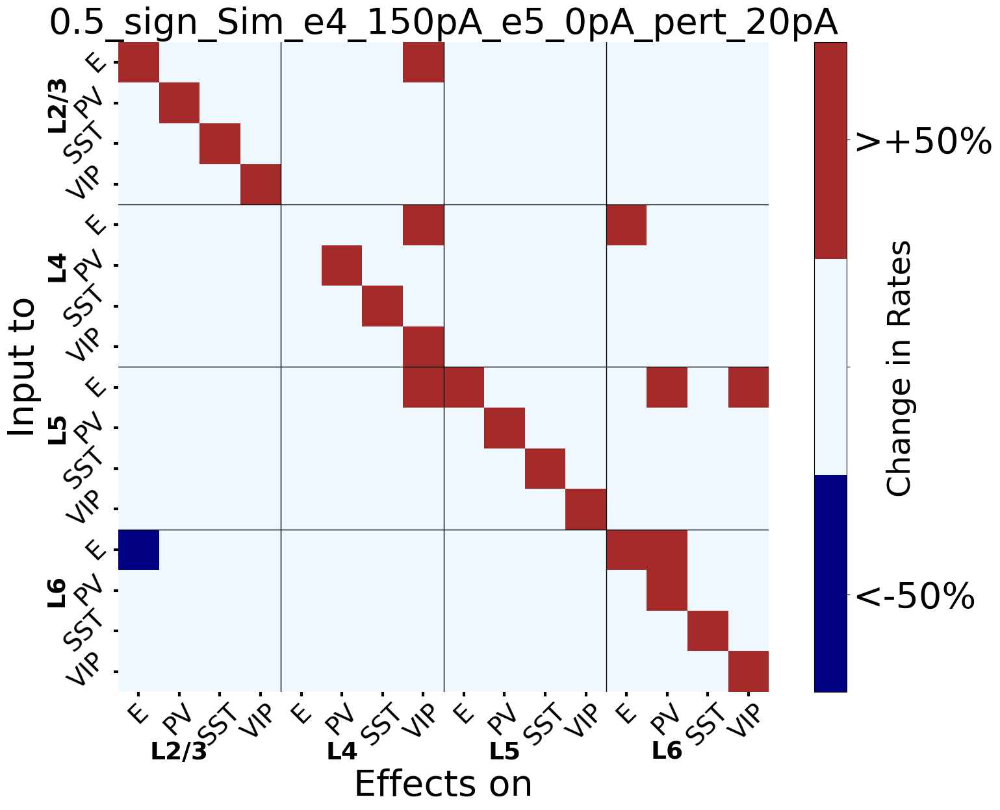

Plot saved for threshold 0.5 and perturbation 20pA.


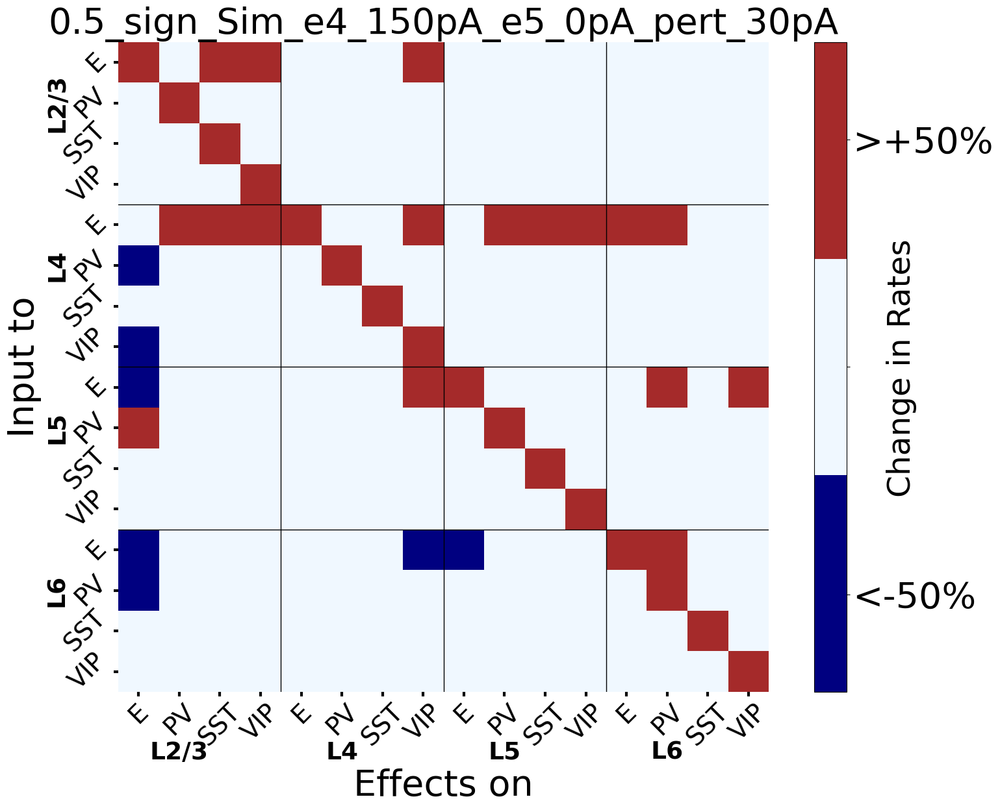

Plot saved for threshold 0.5 and perturbation 30pA.


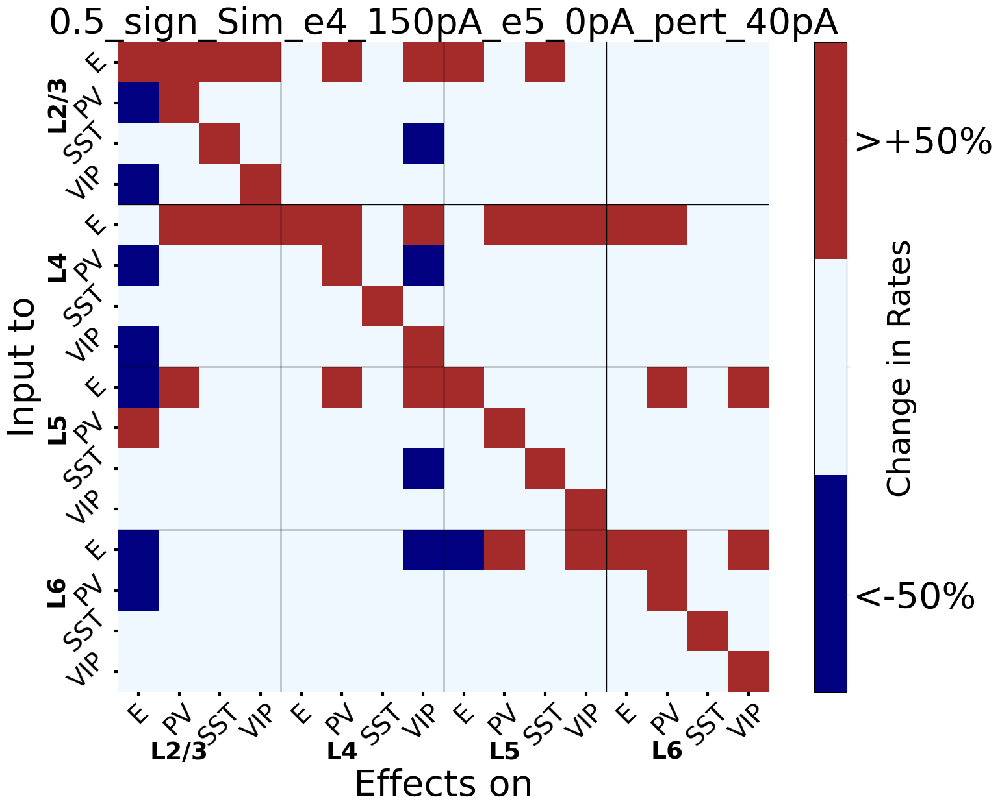

Plot saved for threshold 0.5 and perturbation 40pA.


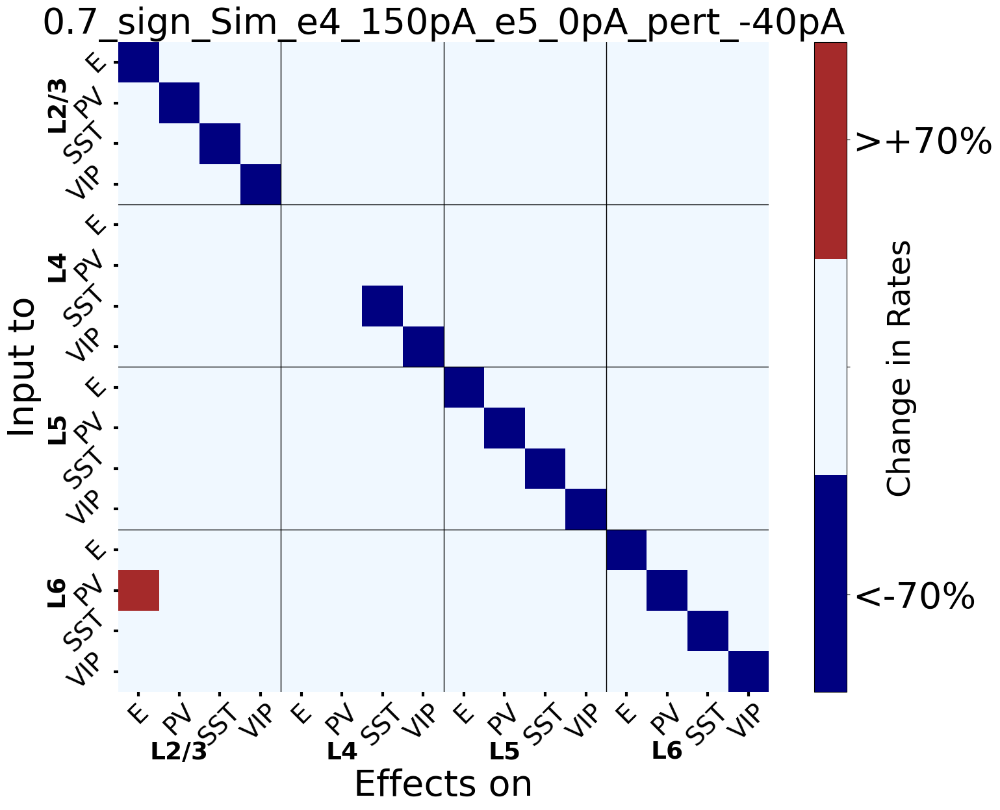

Plot saved for threshold 0.7 and perturbation -40pA.


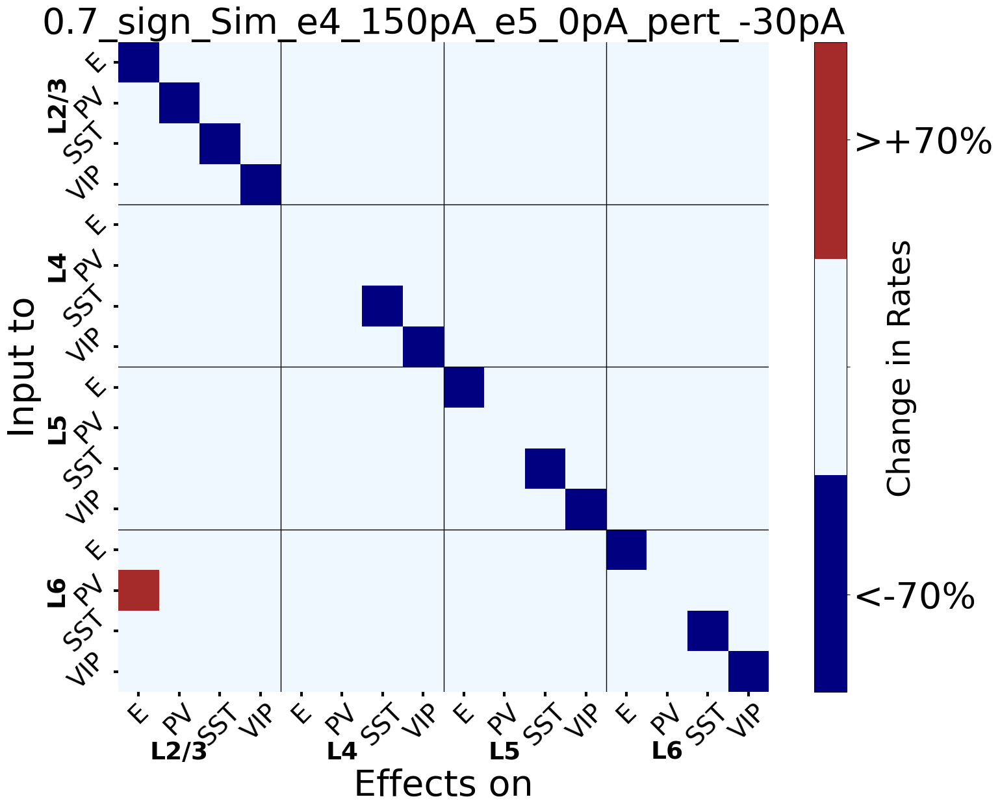

Plot saved for threshold 0.7 and perturbation -30pA.


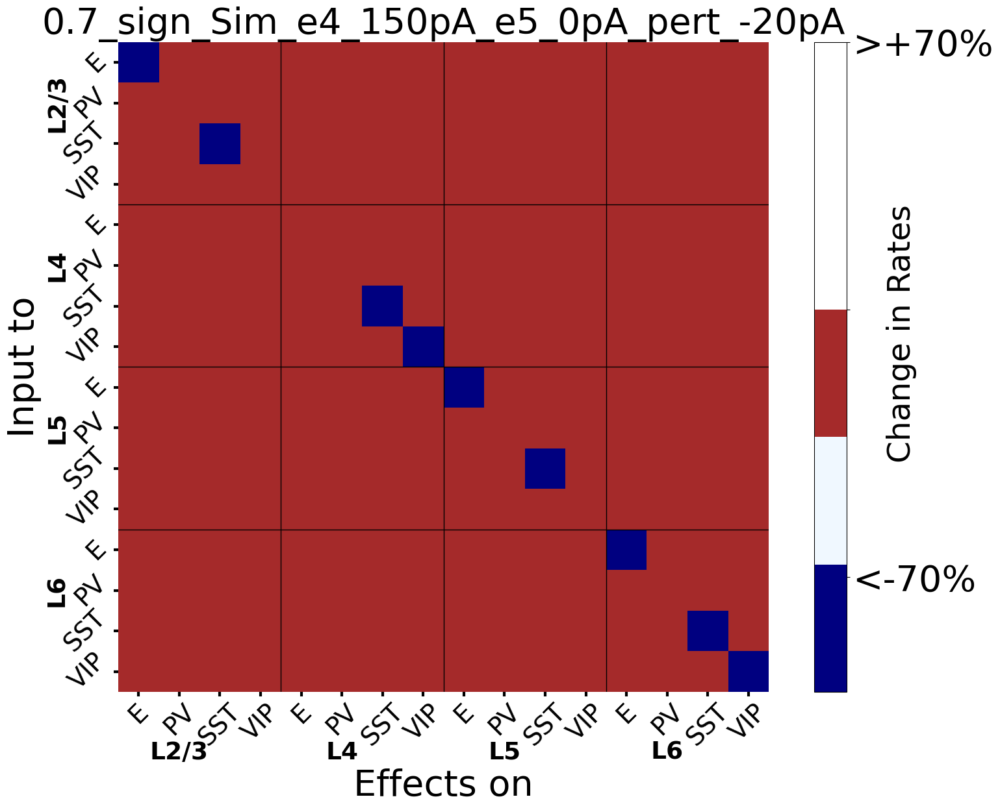

Plot saved for threshold 0.7 and perturbation -20pA.


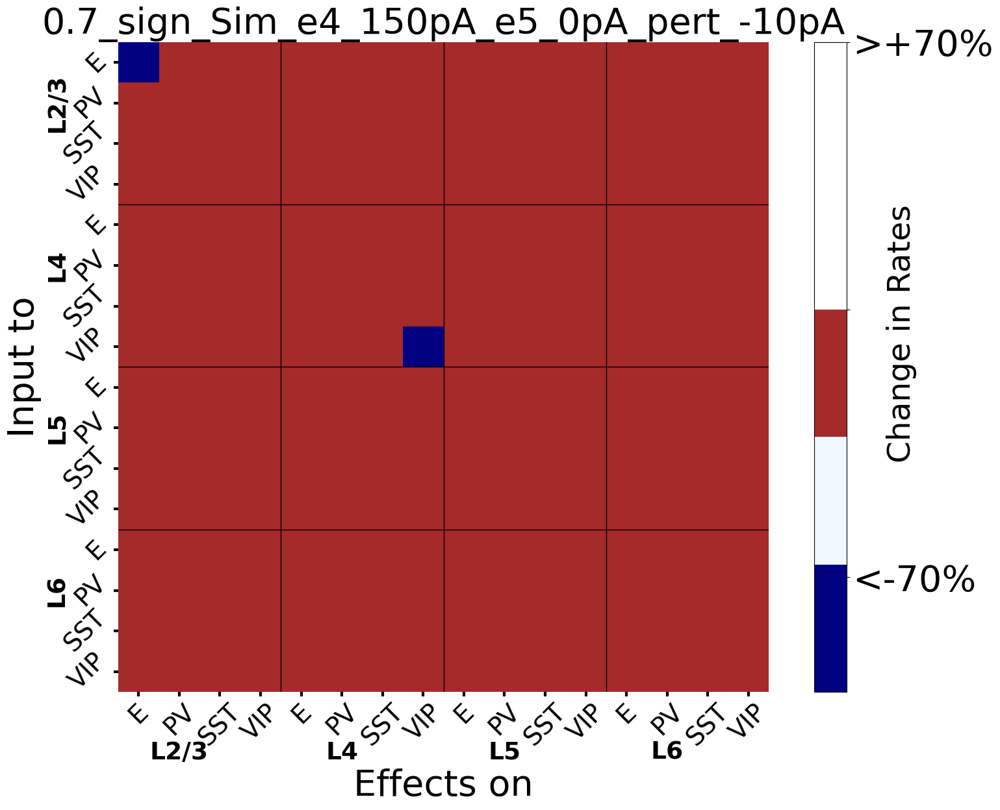

Plot saved for threshold 0.7 and perturbation -10pA.


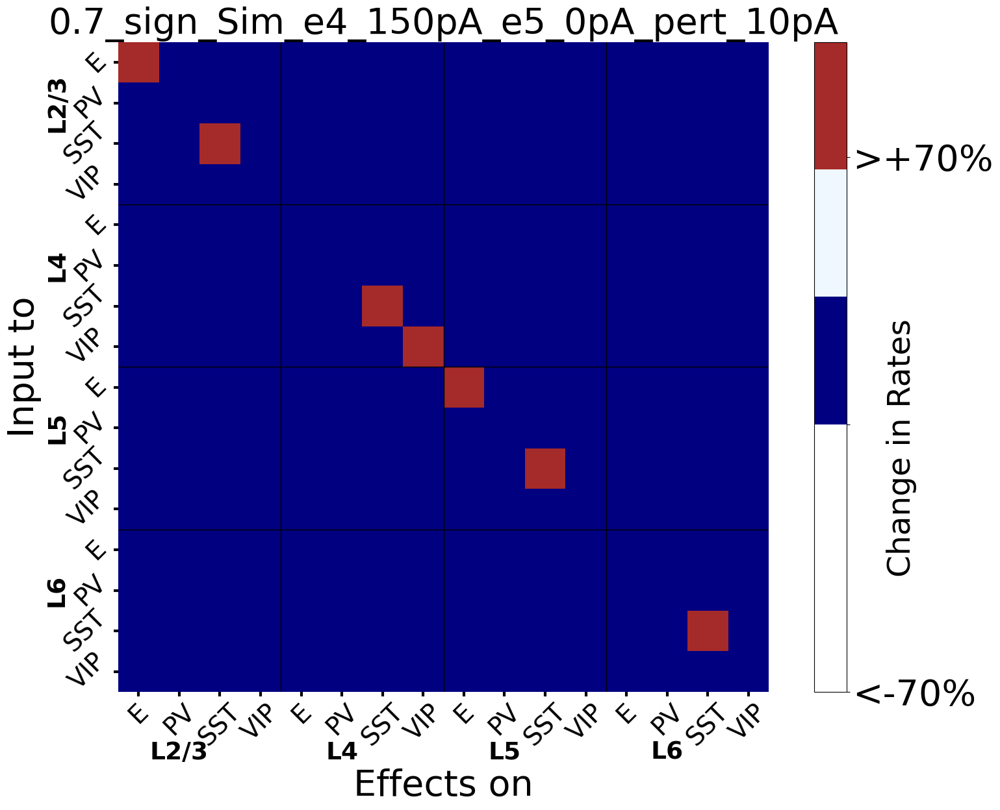

Plot saved for threshold 0.7 and perturbation 10pA.


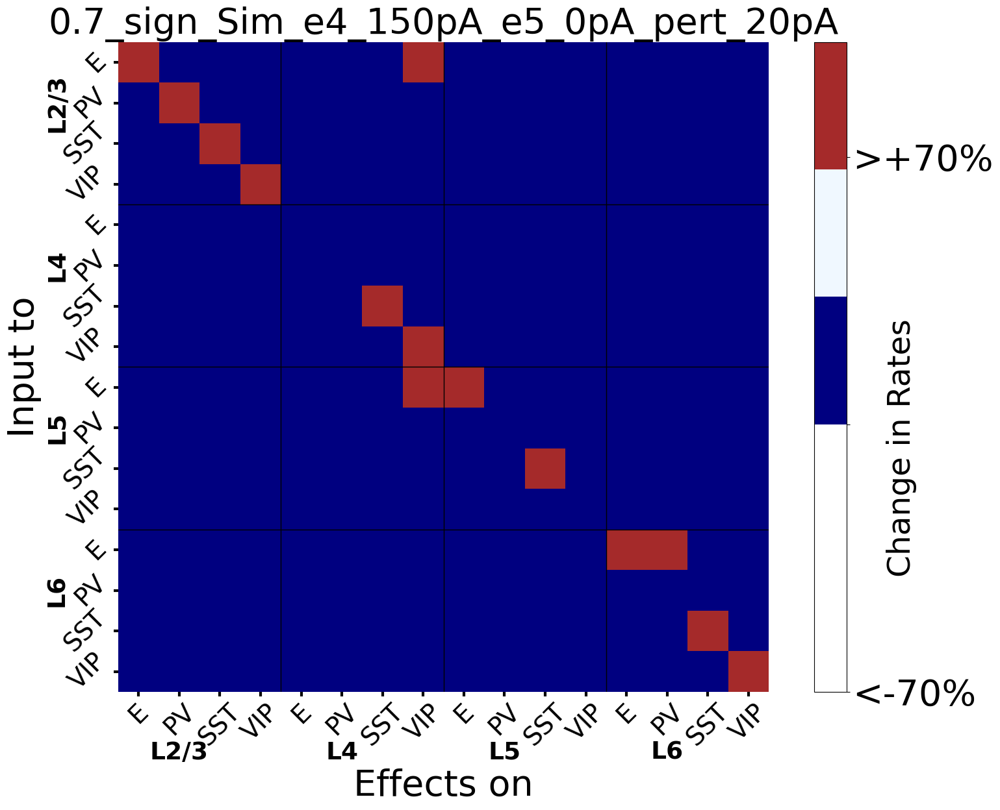

Plot saved for threshold 0.7 and perturbation 20pA.


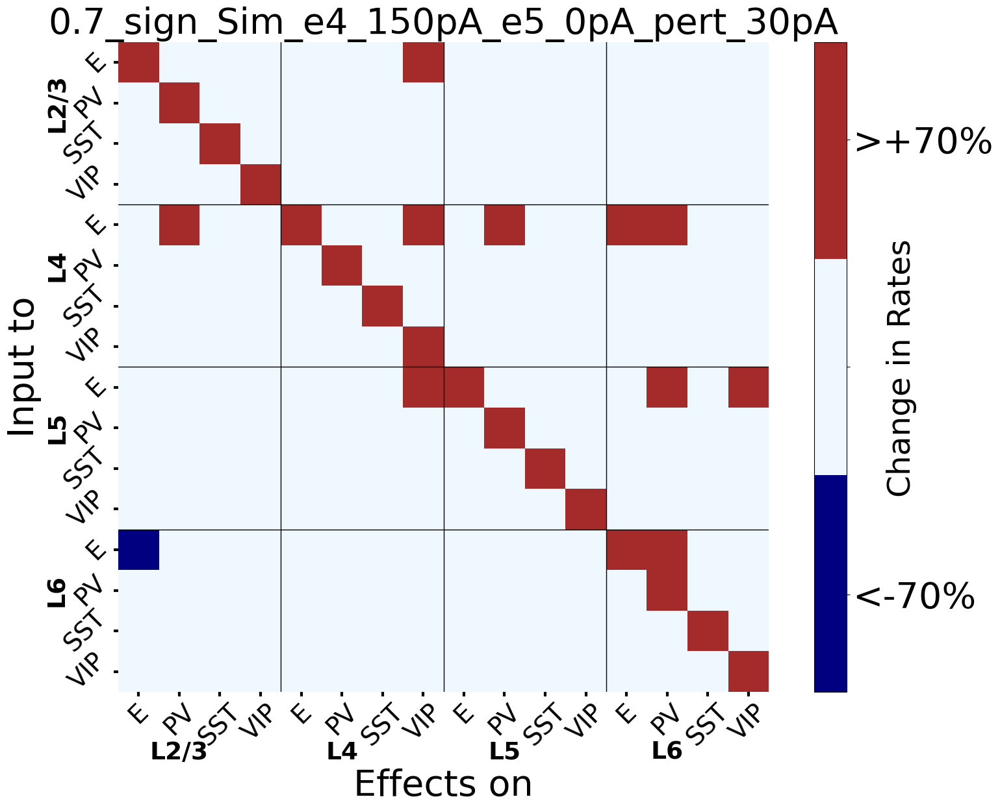

Plot saved for threshold 0.7 and perturbation 30pA.


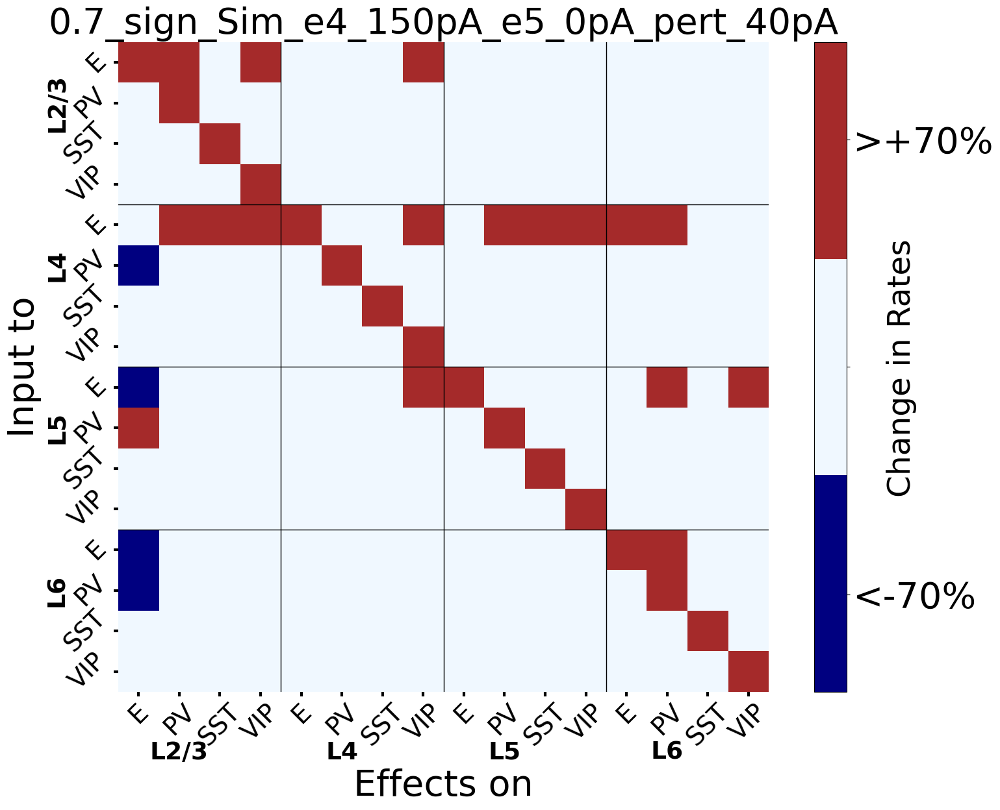

Plot saved for threshold 0.7 and perturbation 40pA.


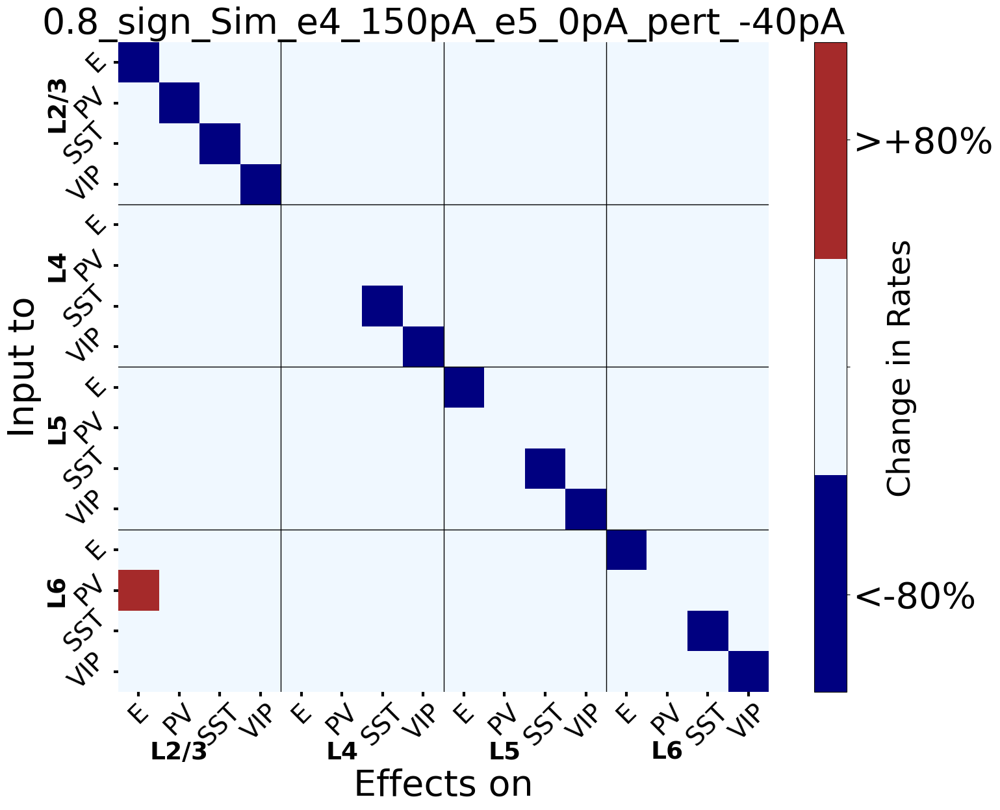

Plot saved for threshold 0.8 and perturbation -40pA.


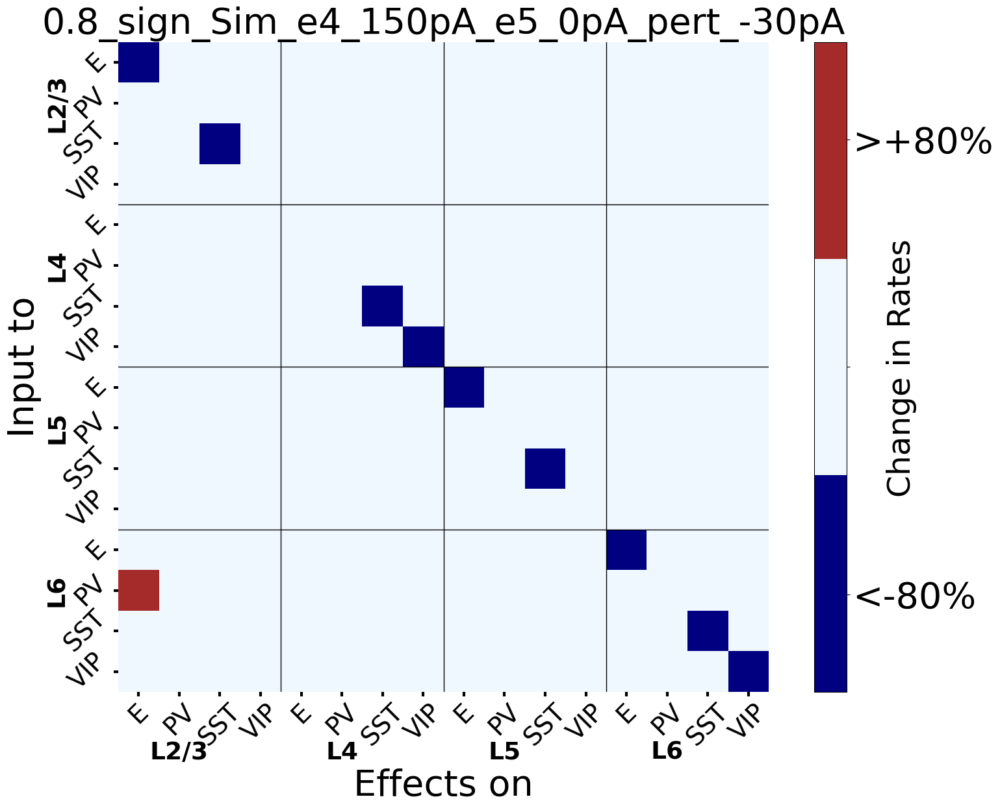

Plot saved for threshold 0.8 and perturbation -30pA.


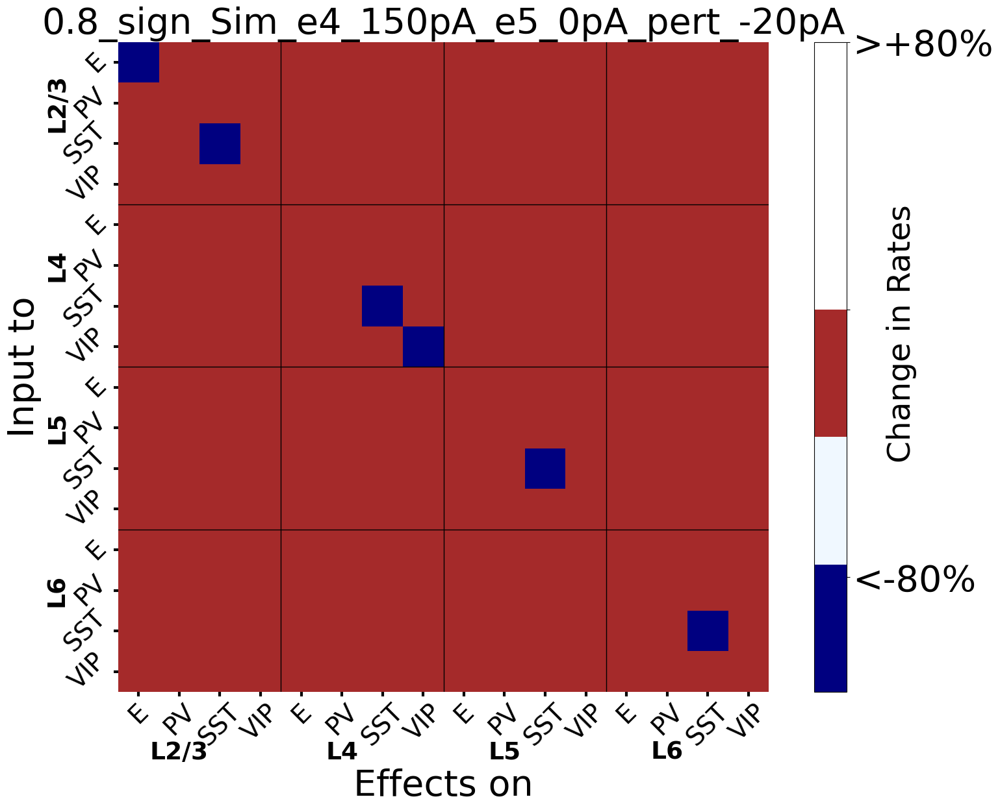

Plot saved for threshold 0.8 and perturbation -20pA.


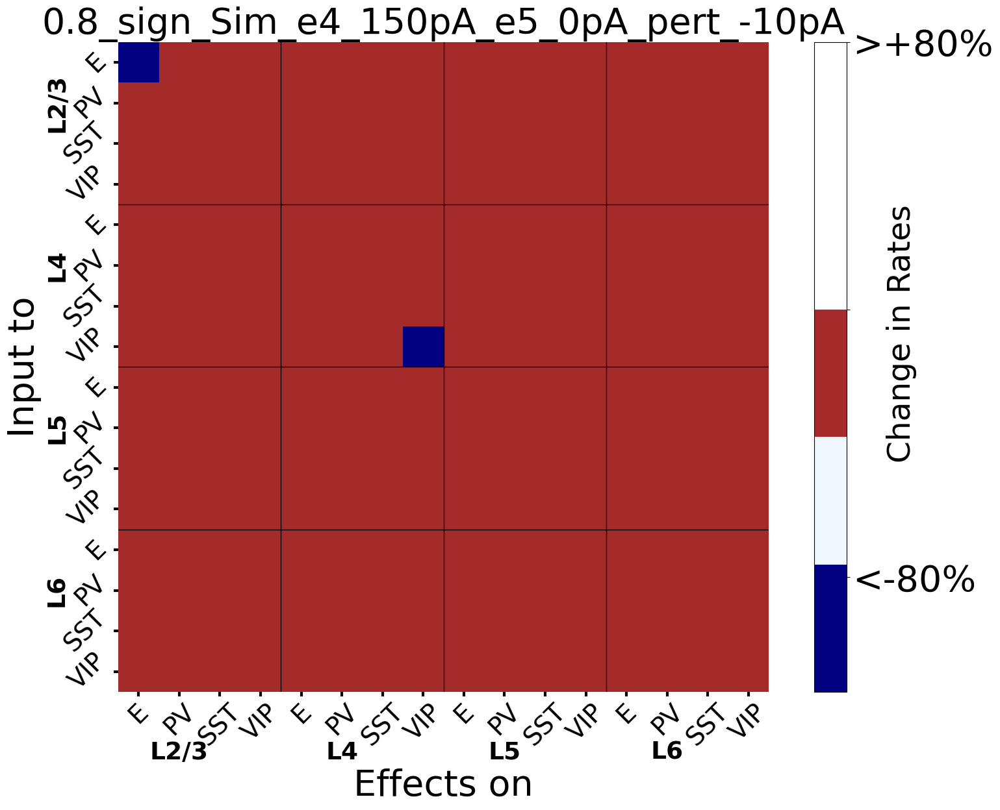

Plot saved for threshold 0.8 and perturbation -10pA.


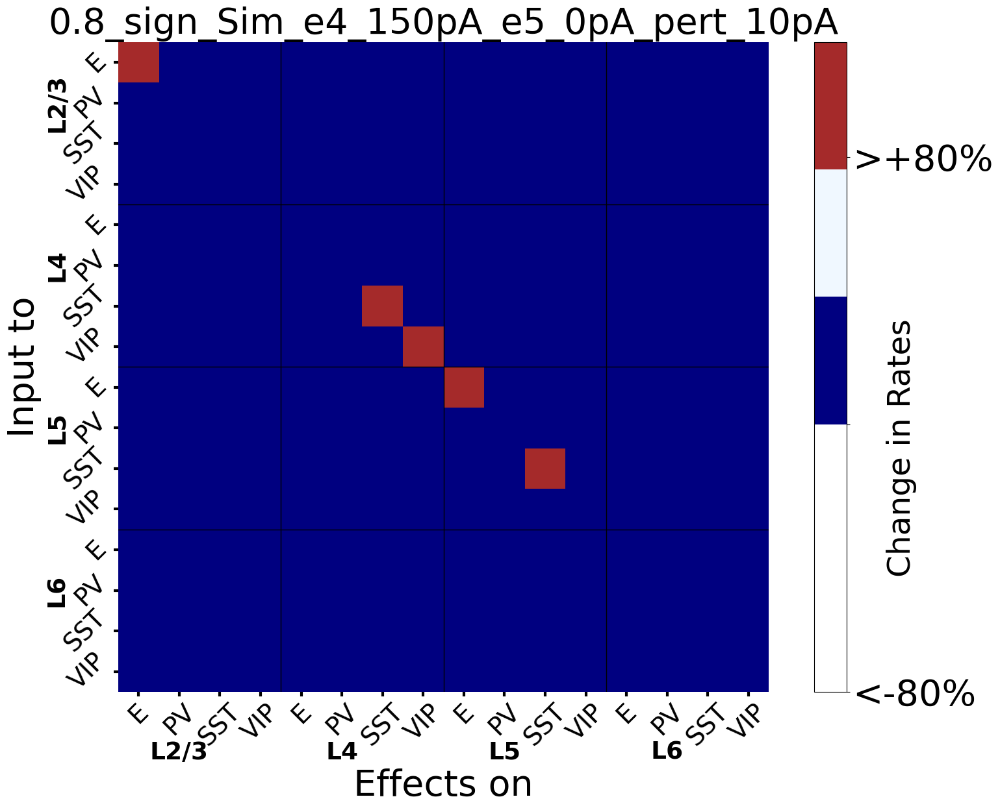

Plot saved for threshold 0.8 and perturbation 10pA.


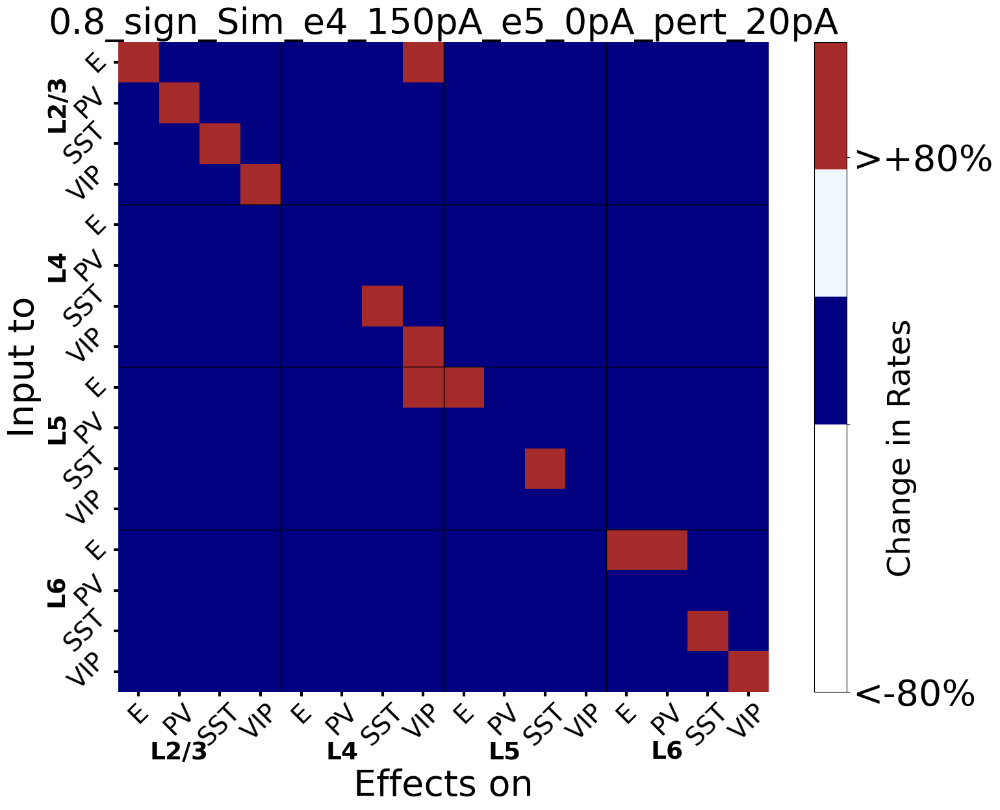

Plot saved for threshold 0.8 and perturbation 20pA.


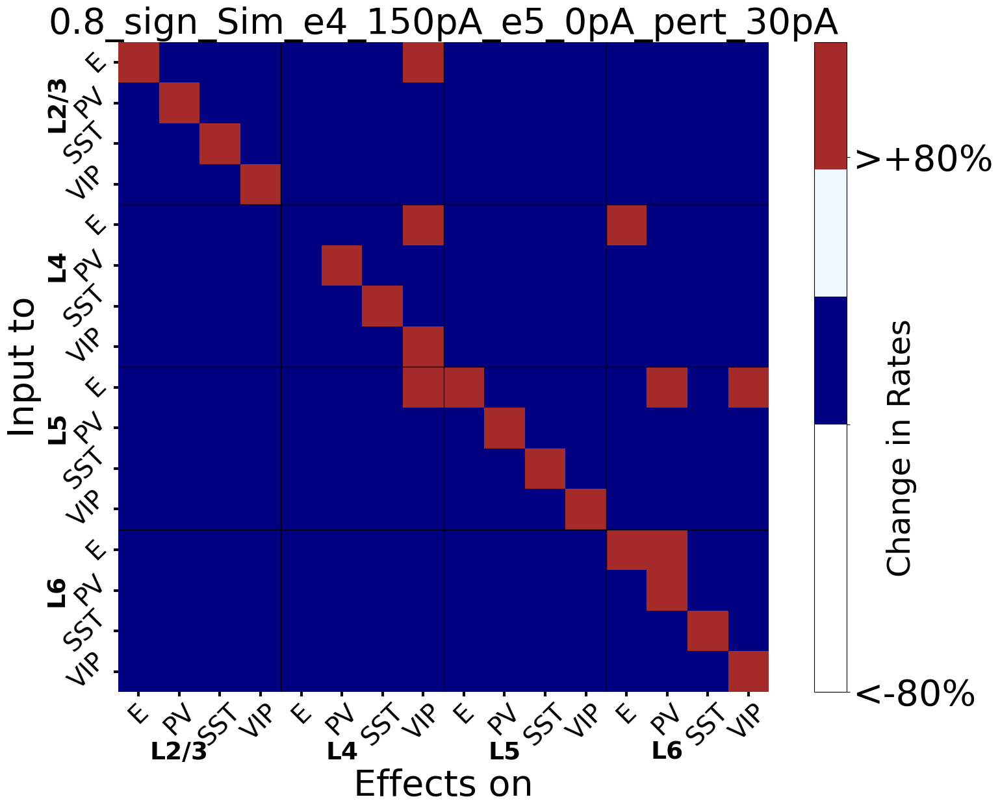

Plot saved for threshold 0.8 and perturbation 30pA.


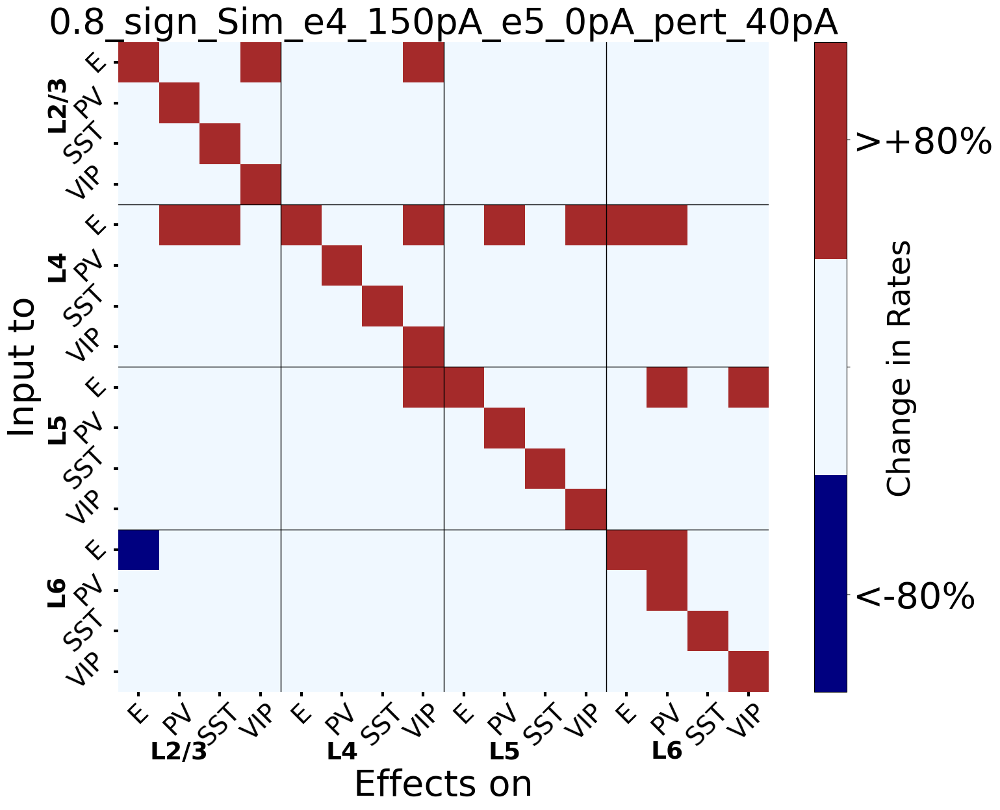

Plot saved for threshold 0.8 and perturbation 40pA.


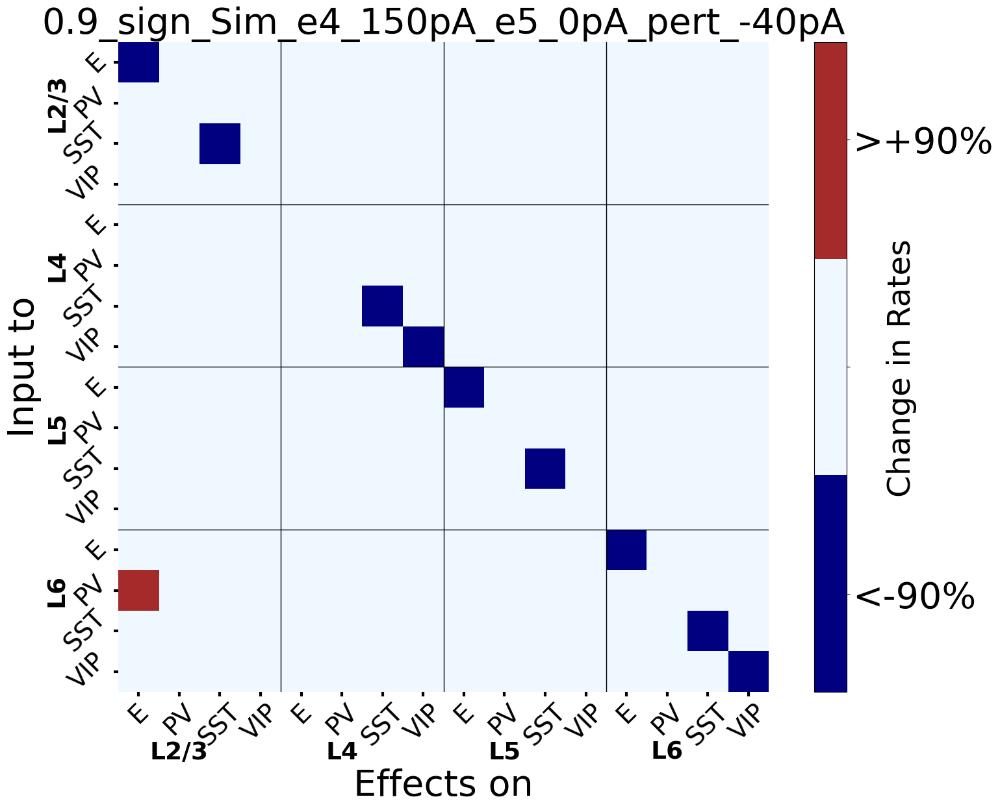

Plot saved for threshold 0.9 and perturbation -40pA.


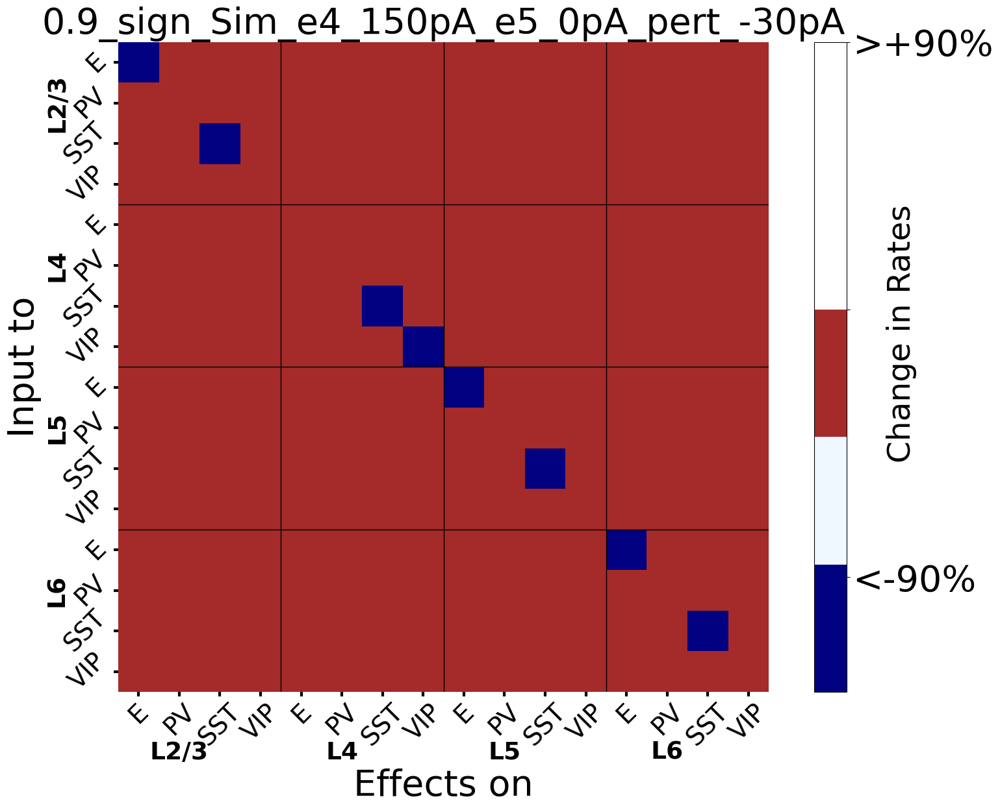

Plot saved for threshold 0.9 and perturbation -30pA.


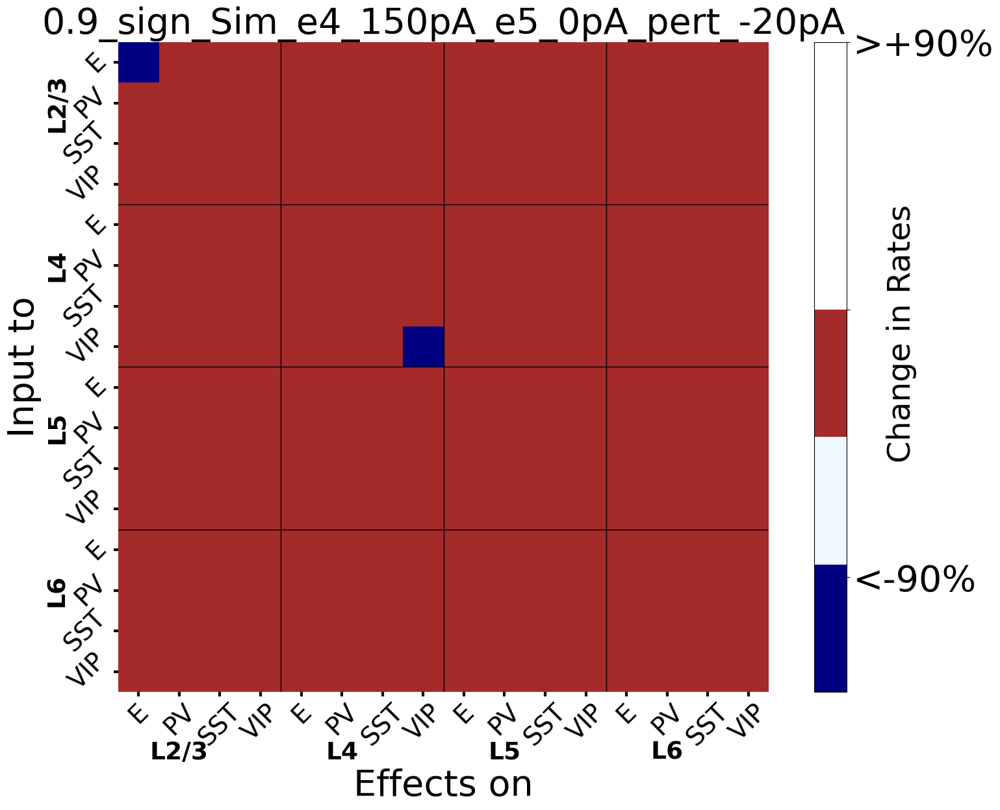

Plot saved for threshold 0.9 and perturbation -20pA.


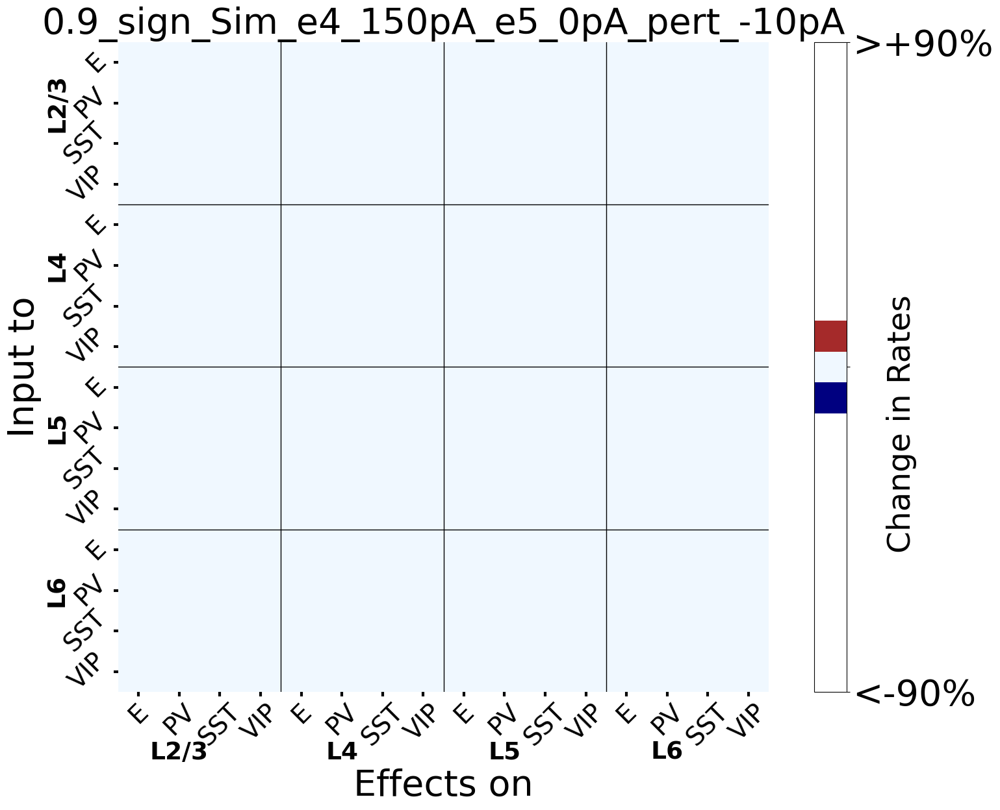

Plot saved for threshold 0.9 and perturbation -10pA.


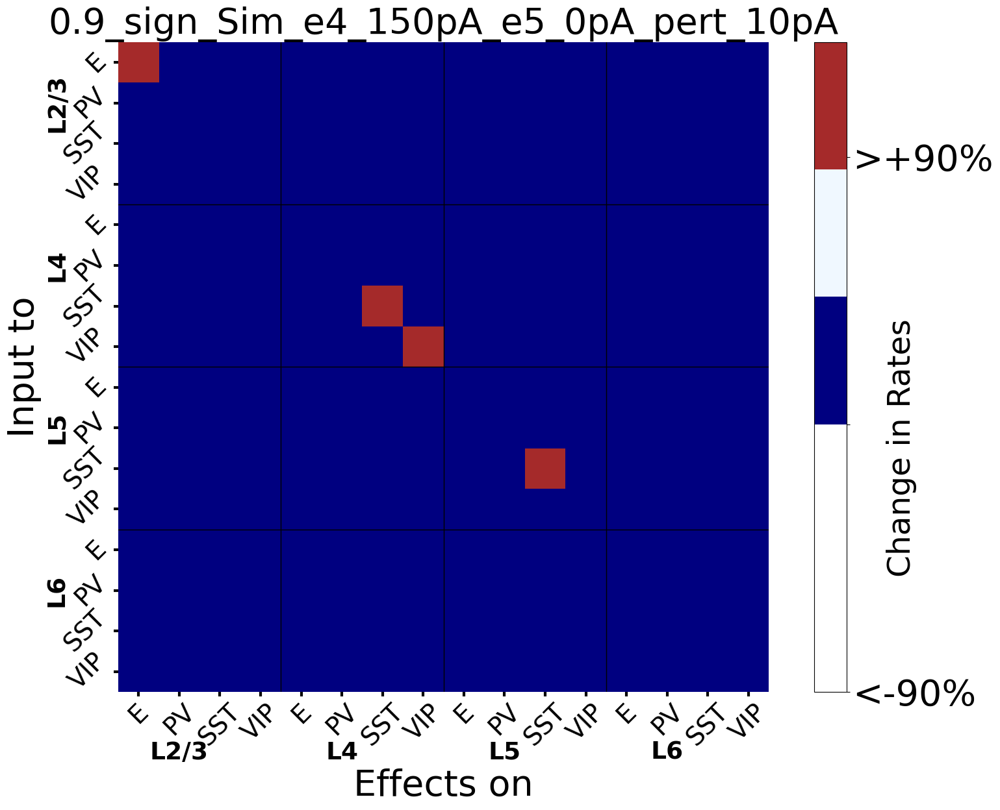

Plot saved for threshold 0.9 and perturbation 10pA.


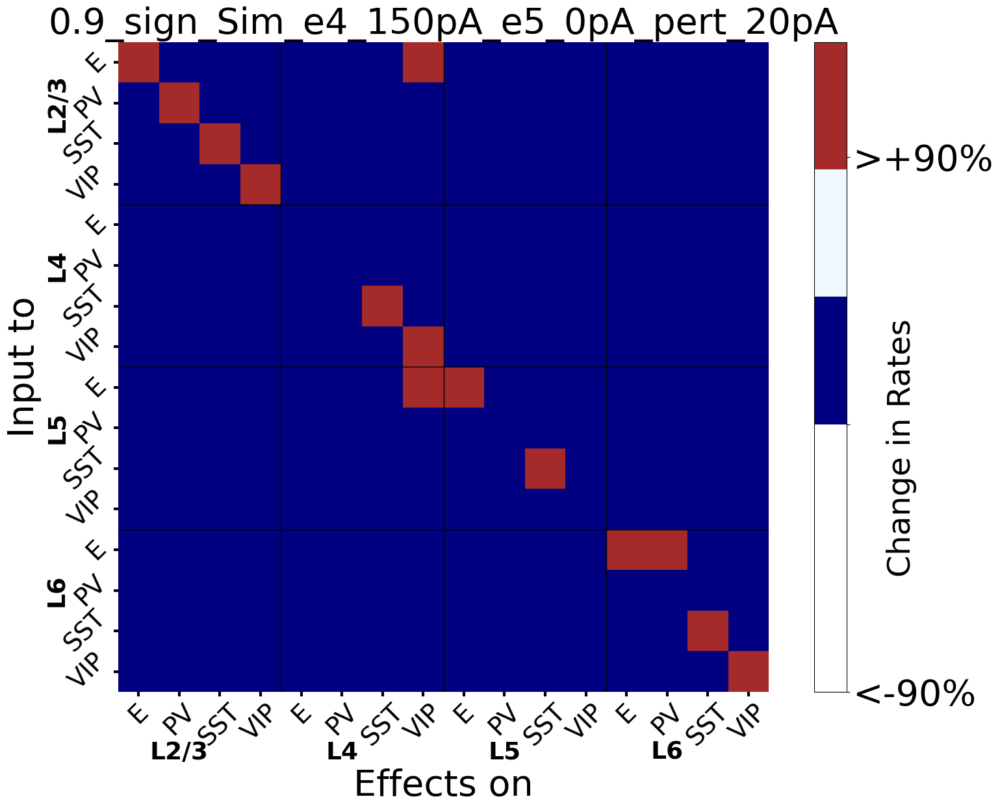

Plot saved for threshold 0.9 and perturbation 20pA.


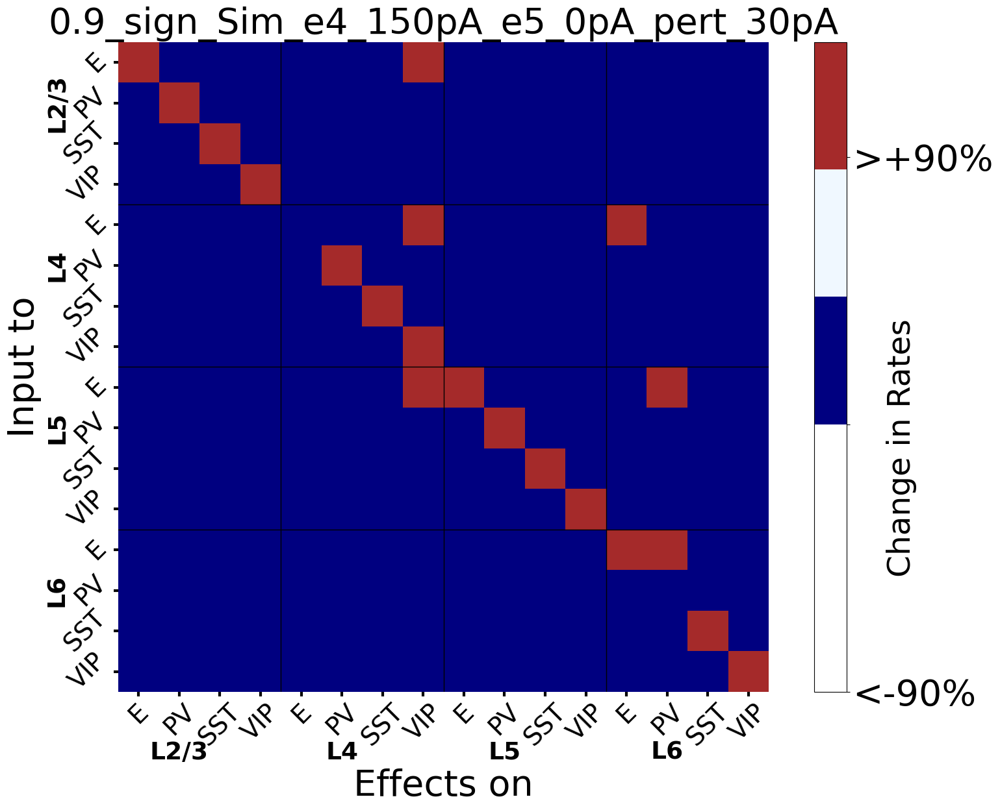

Plot saved for threshold 0.9 and perturbation 30pA.


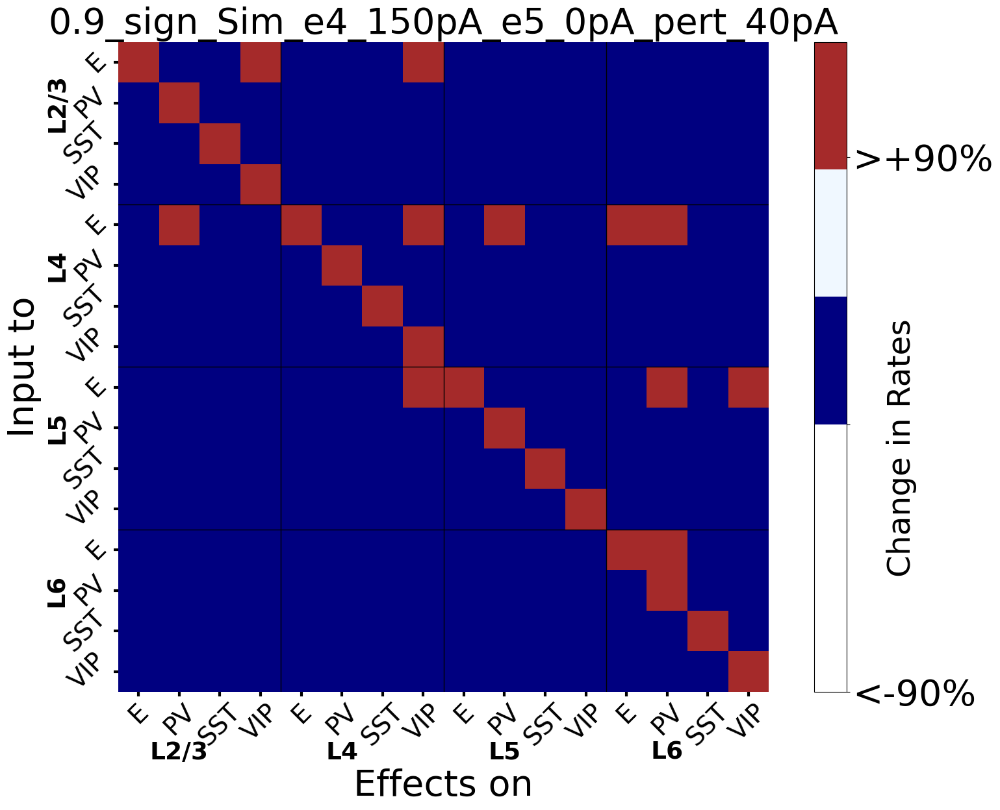

Plot saved for threshold 0.9 and perturbation 40pA.


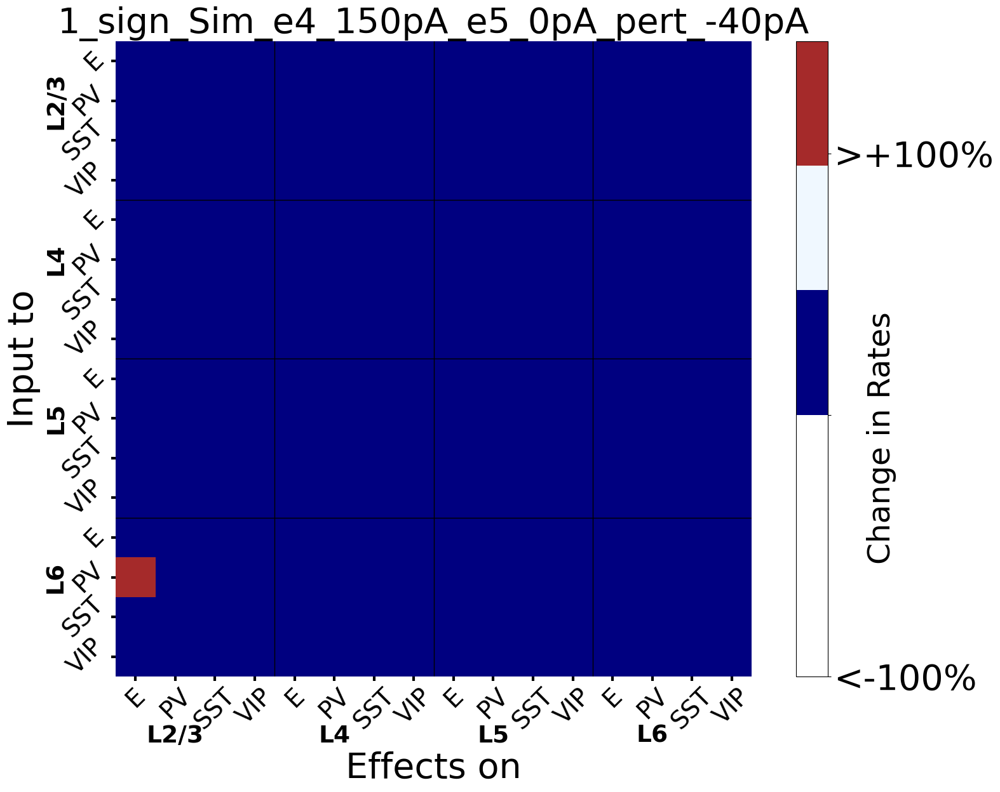

Plot saved for threshold 1 and perturbation -40pA.


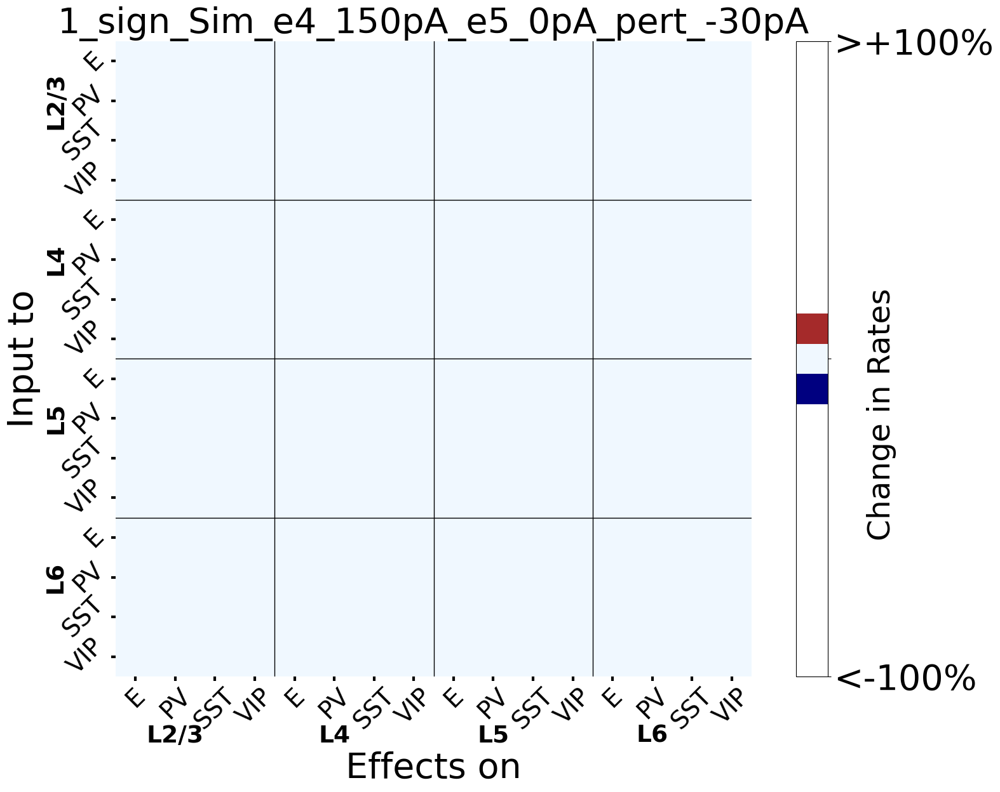

Plot saved for threshold 1 and perturbation -30pA.


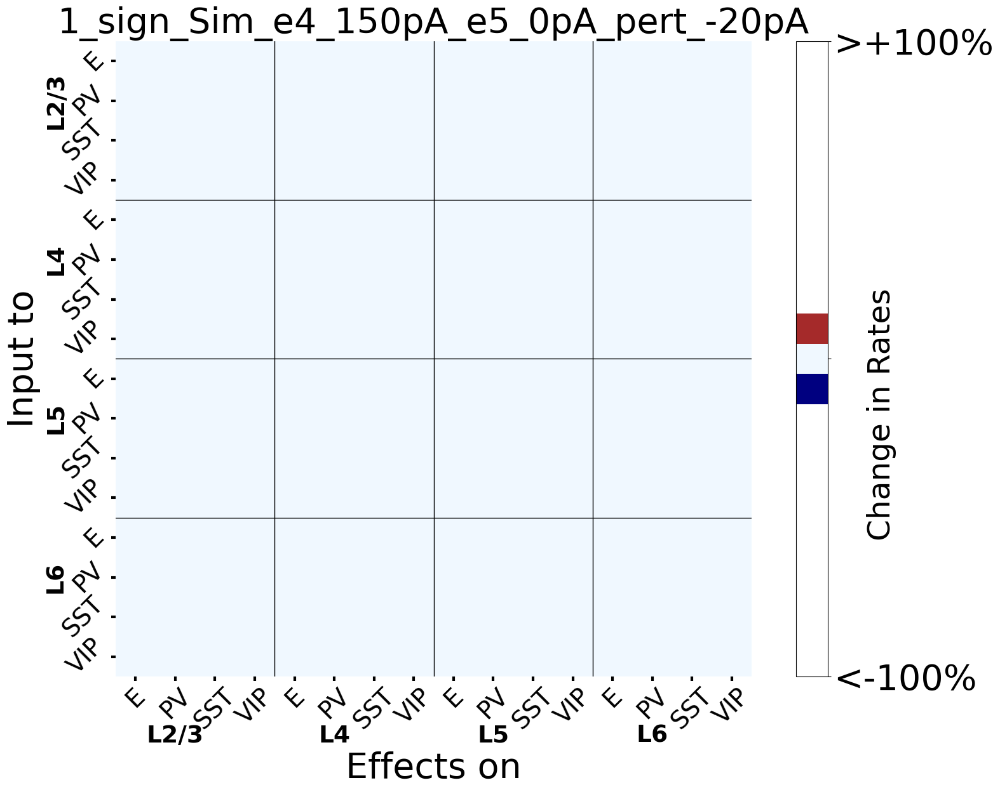

Plot saved for threshold 1 and perturbation -20pA.


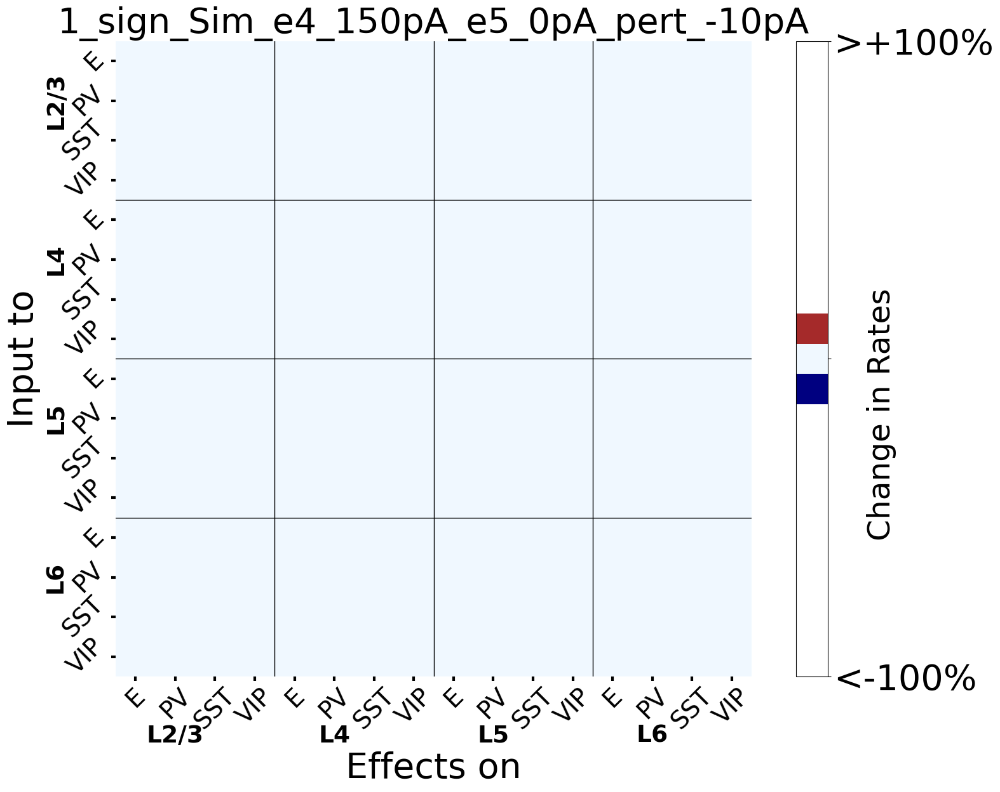

Plot saved for threshold 1 and perturbation -10pA.


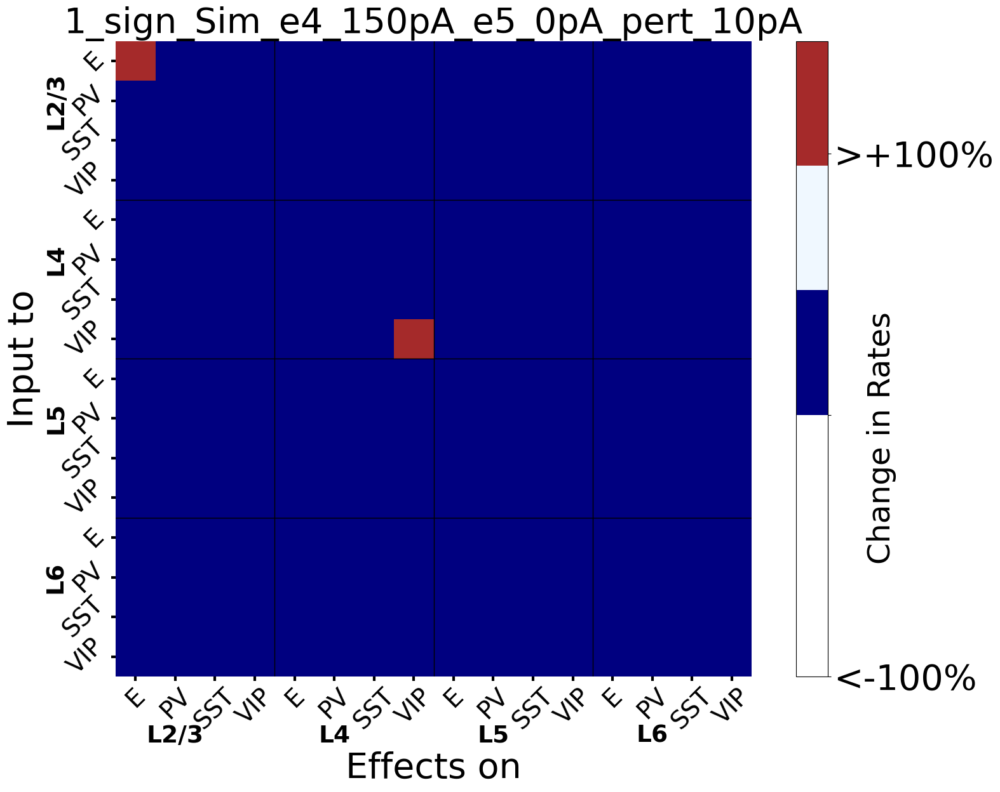

Plot saved for threshold 1 and perturbation 10pA.


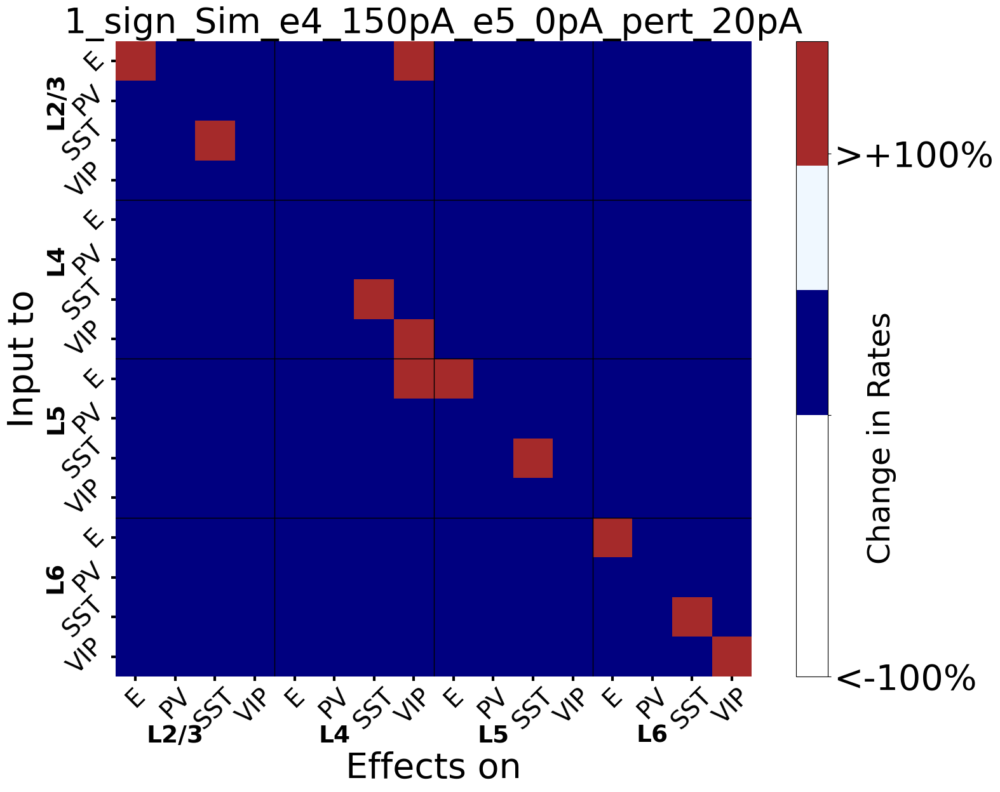

Plot saved for threshold 1 and perturbation 20pA.


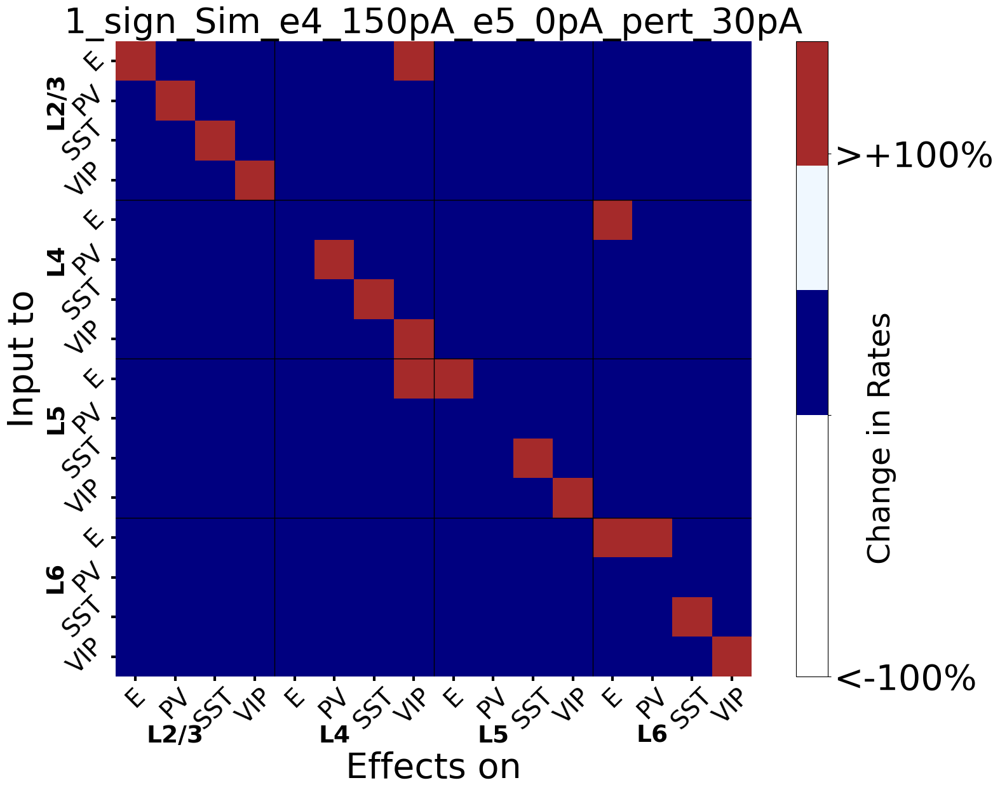

Plot saved for threshold 1 and perturbation 30pA.


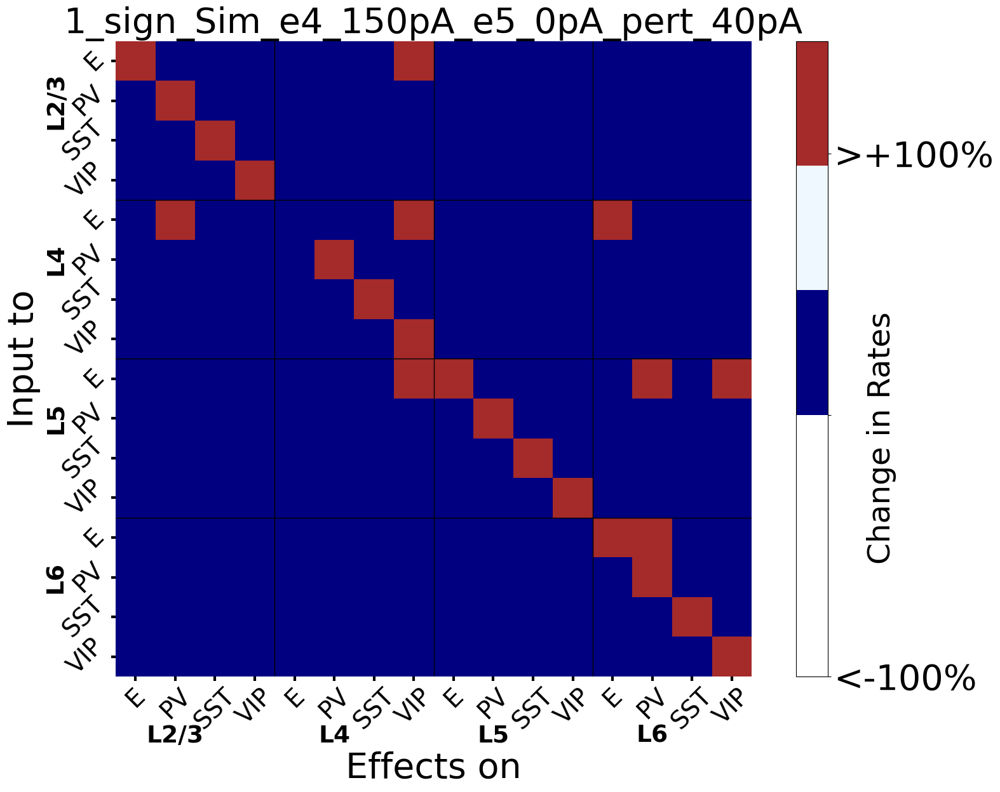

Plot saved for threshold 1 and perturbation 40pA.


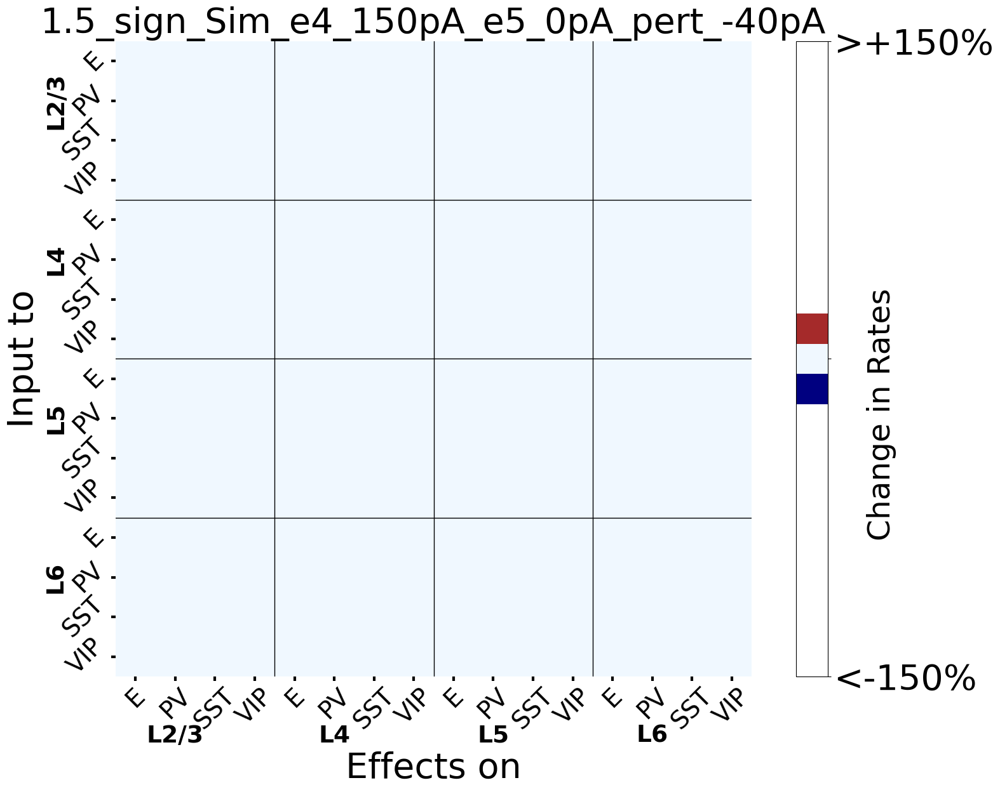

Plot saved for threshold 1.5 and perturbation -40pA.


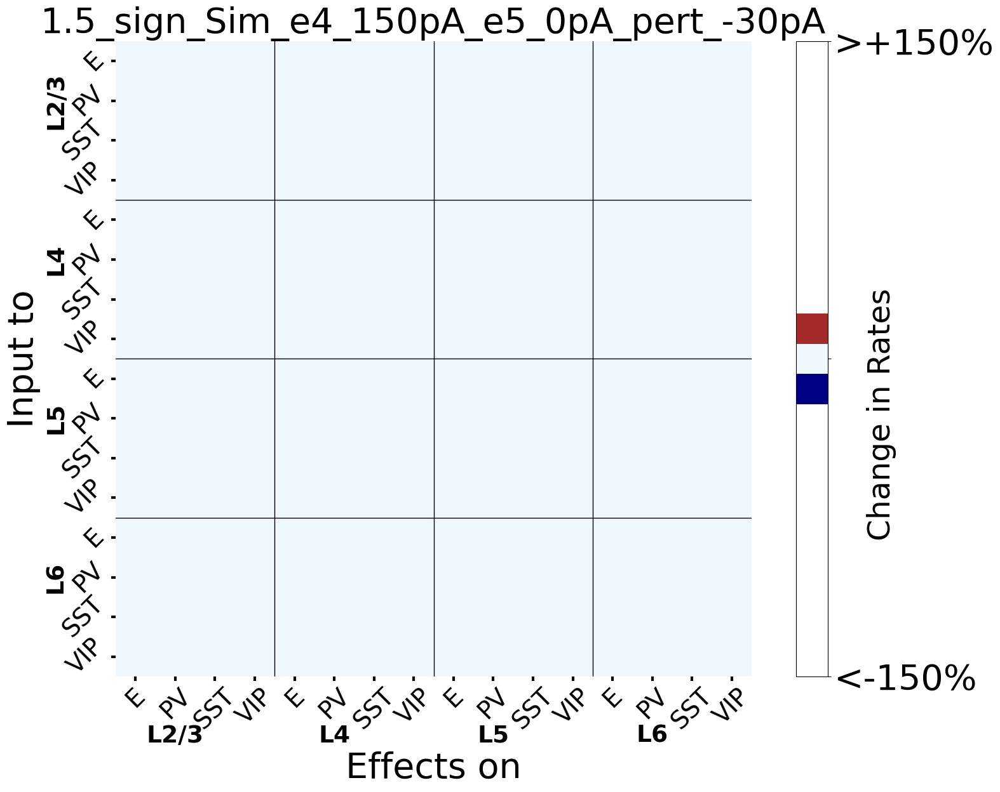

Plot saved for threshold 1.5 and perturbation -30pA.


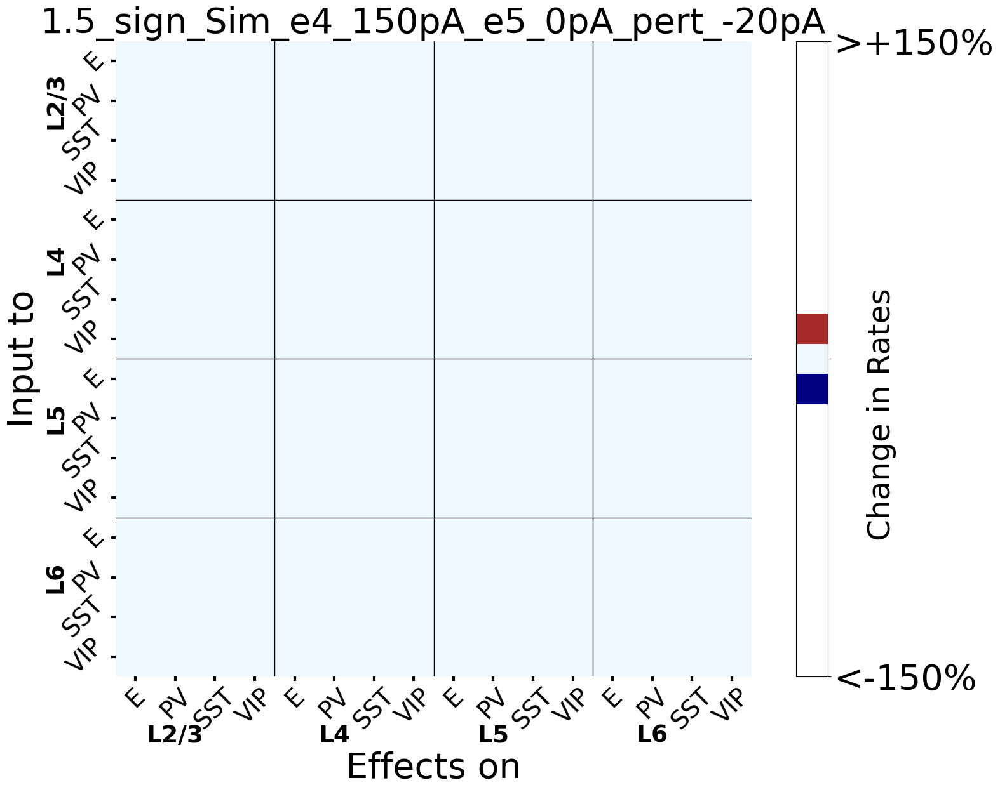

Plot saved for threshold 1.5 and perturbation -20pA.


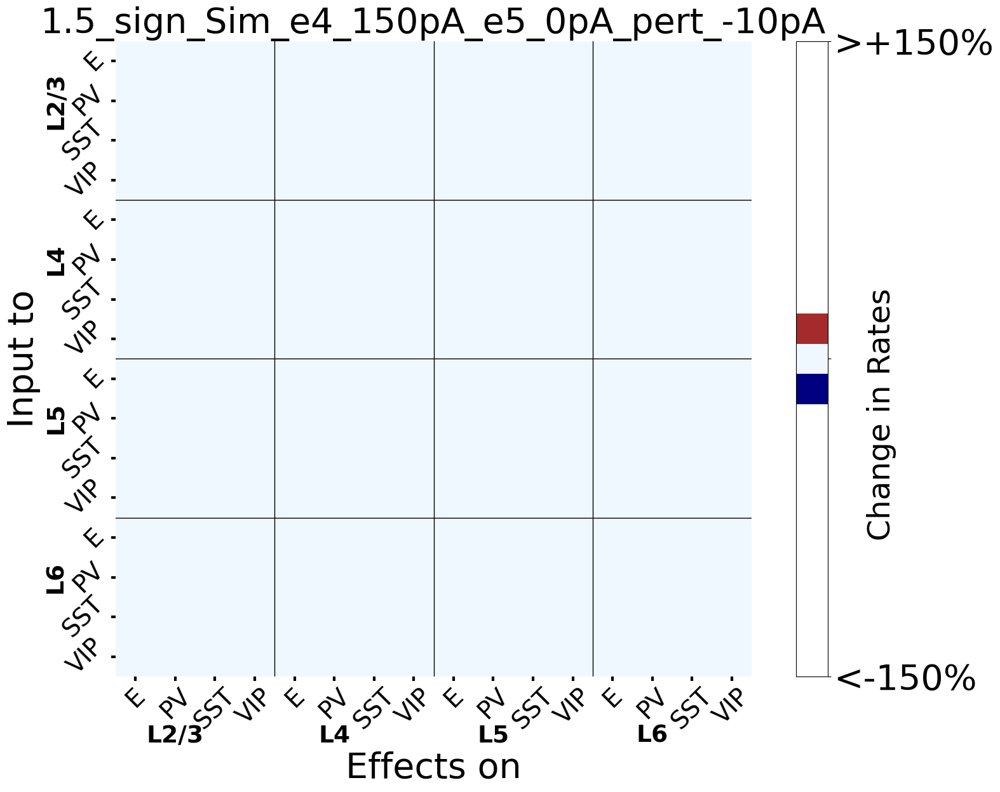

Plot saved for threshold 1.5 and perturbation -10pA.


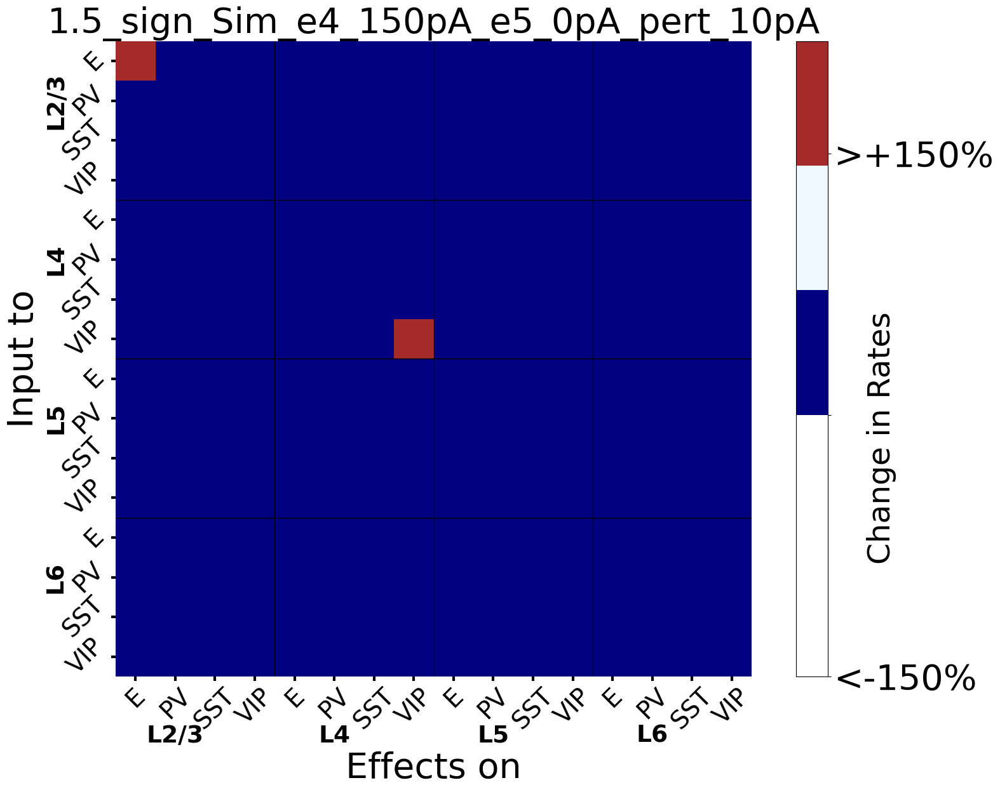

Plot saved for threshold 1.5 and perturbation 10pA.


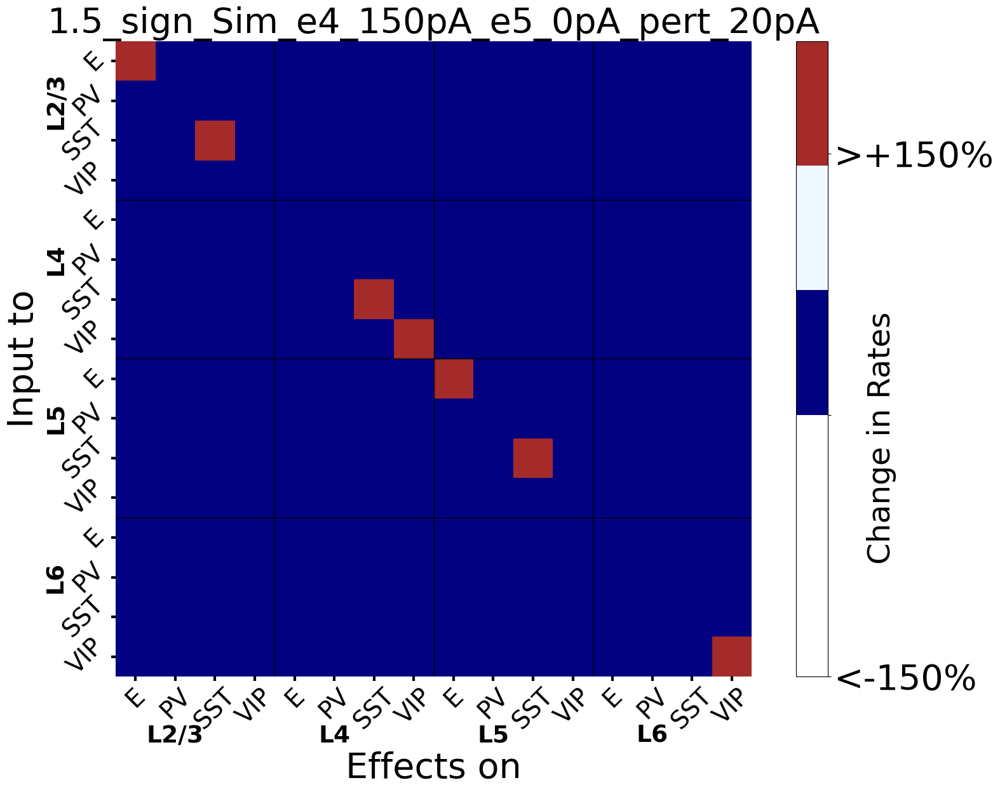

Plot saved for threshold 1.5 and perturbation 20pA.


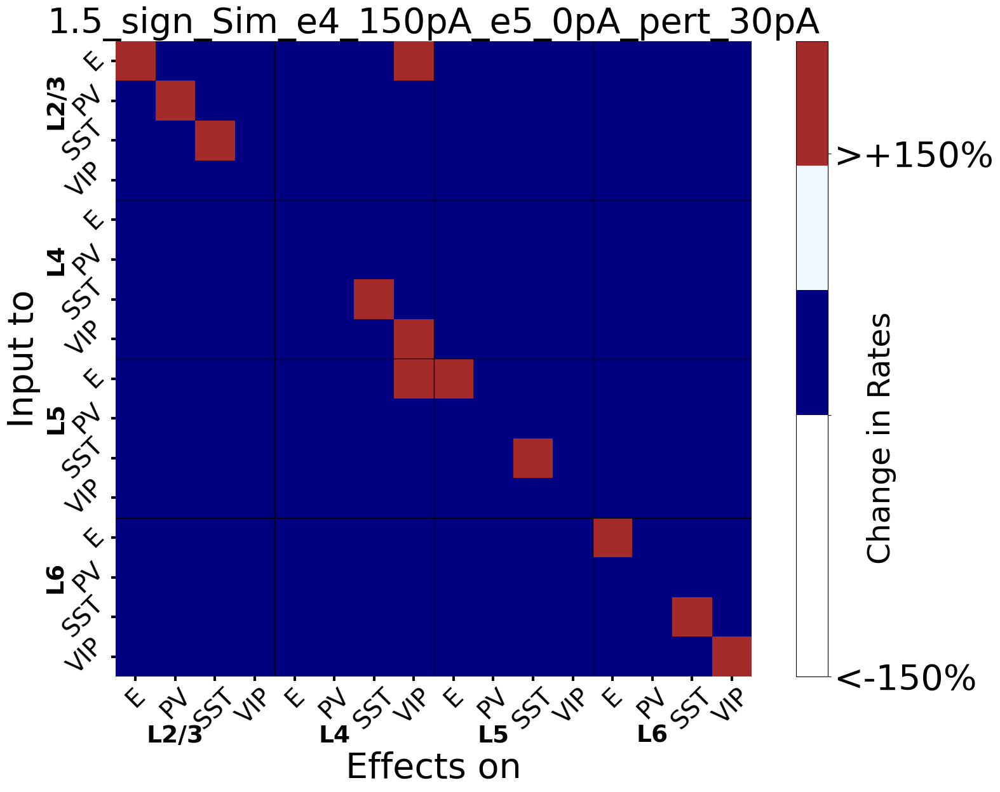

Plot saved for threshold 1.5 and perturbation 30pA.


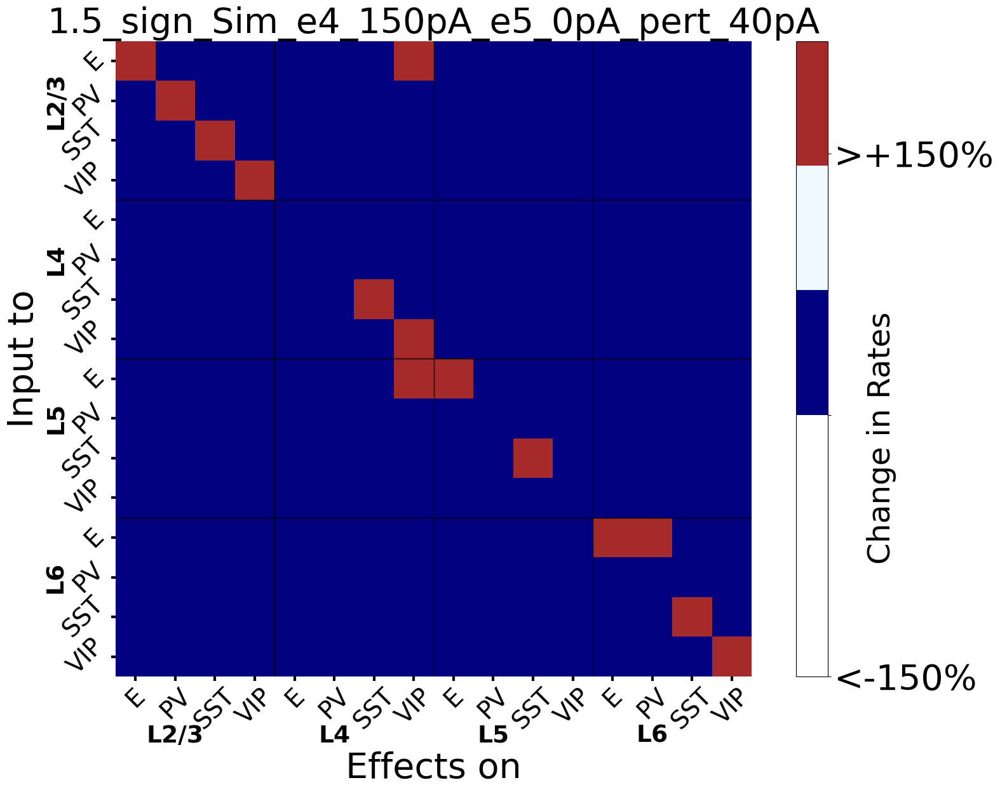

Plot saved for threshold 1.5 and perturbation 40pA.


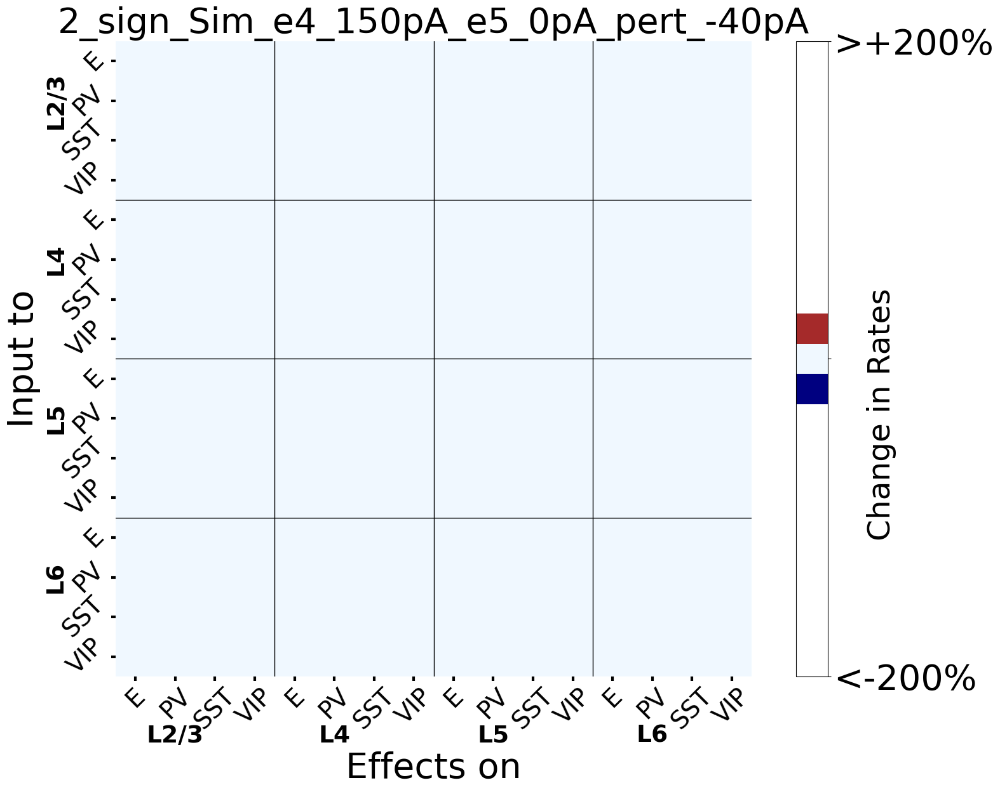

Plot saved for threshold 2 and perturbation -40pA.


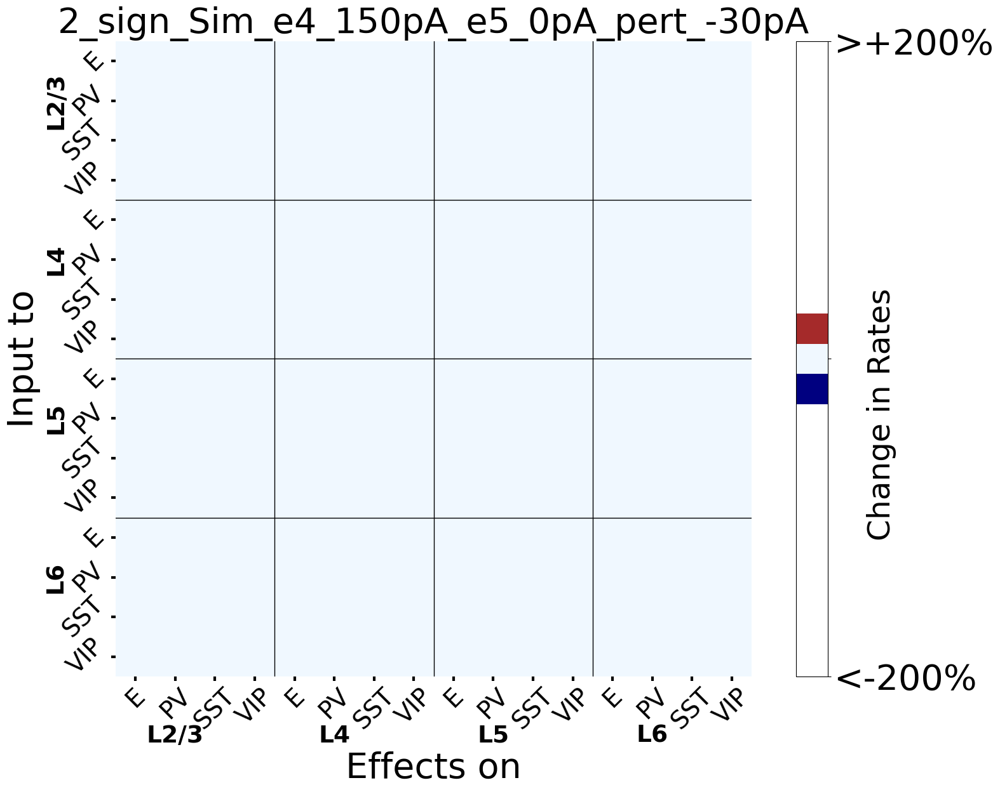

Plot saved for threshold 2 and perturbation -30pA.


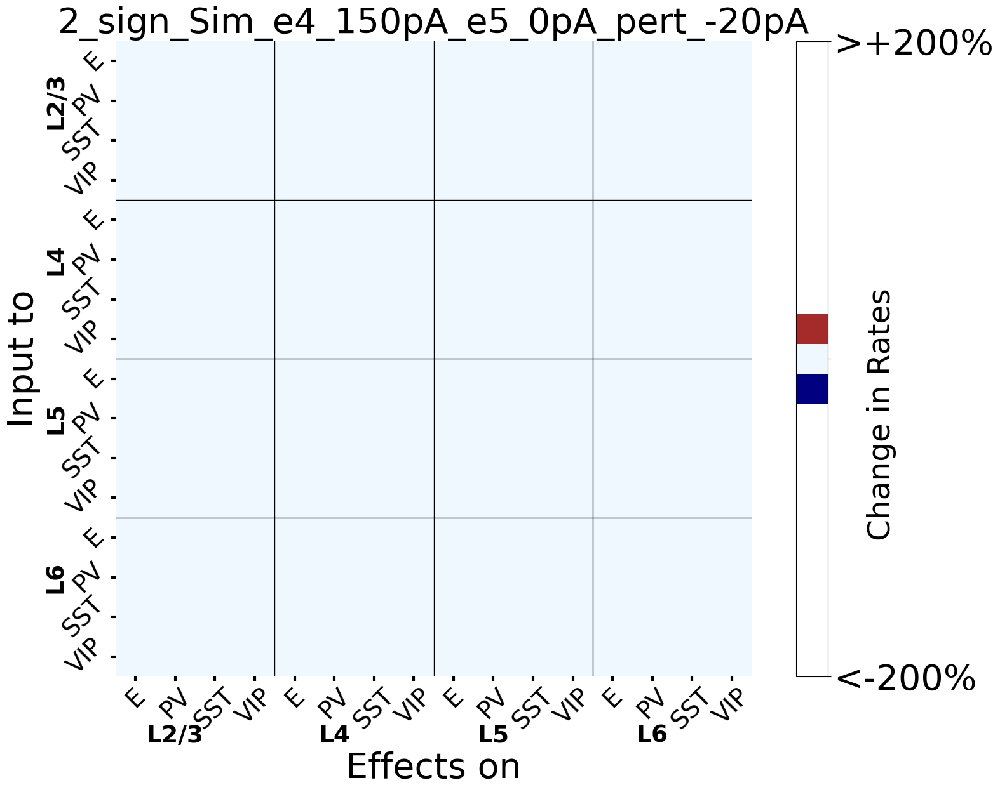

Plot saved for threshold 2 and perturbation -20pA.


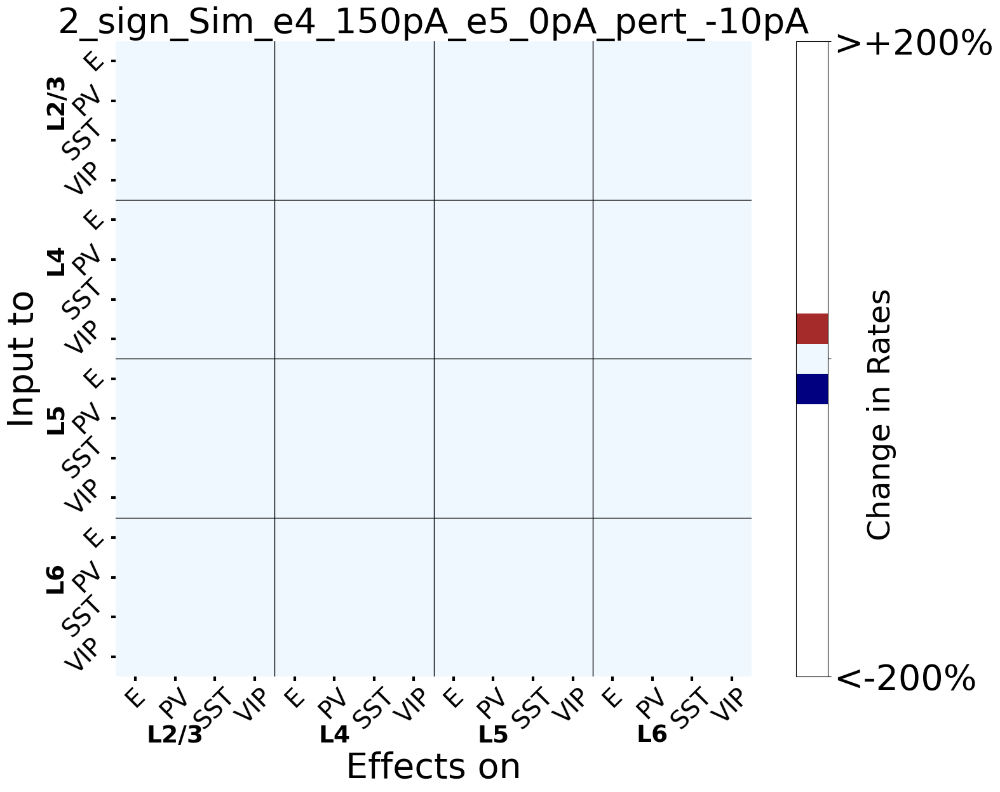

Plot saved for threshold 2 and perturbation -10pA.


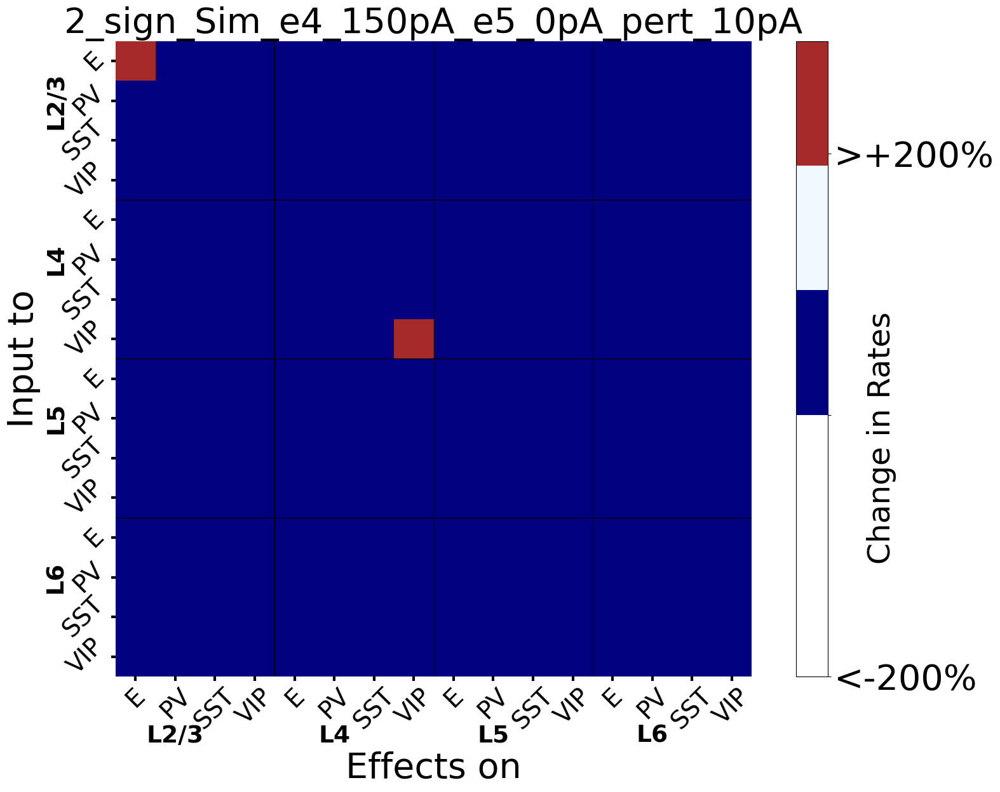

Plot saved for threshold 2 and perturbation 10pA.


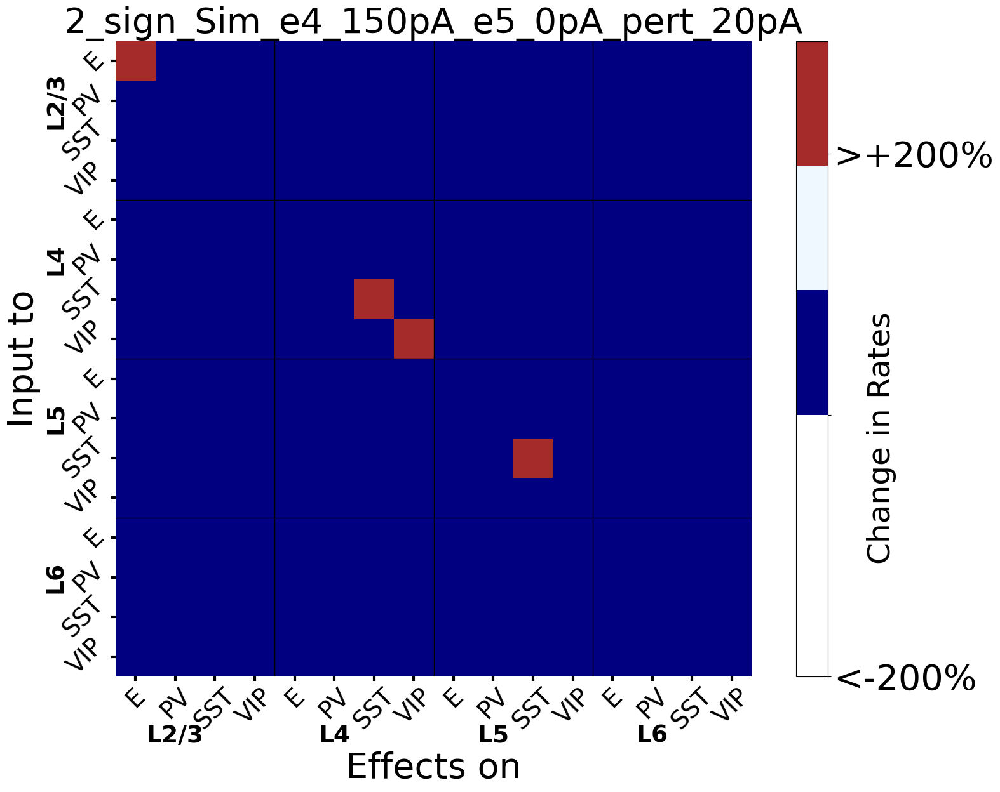

Plot saved for threshold 2 and perturbation 20pA.


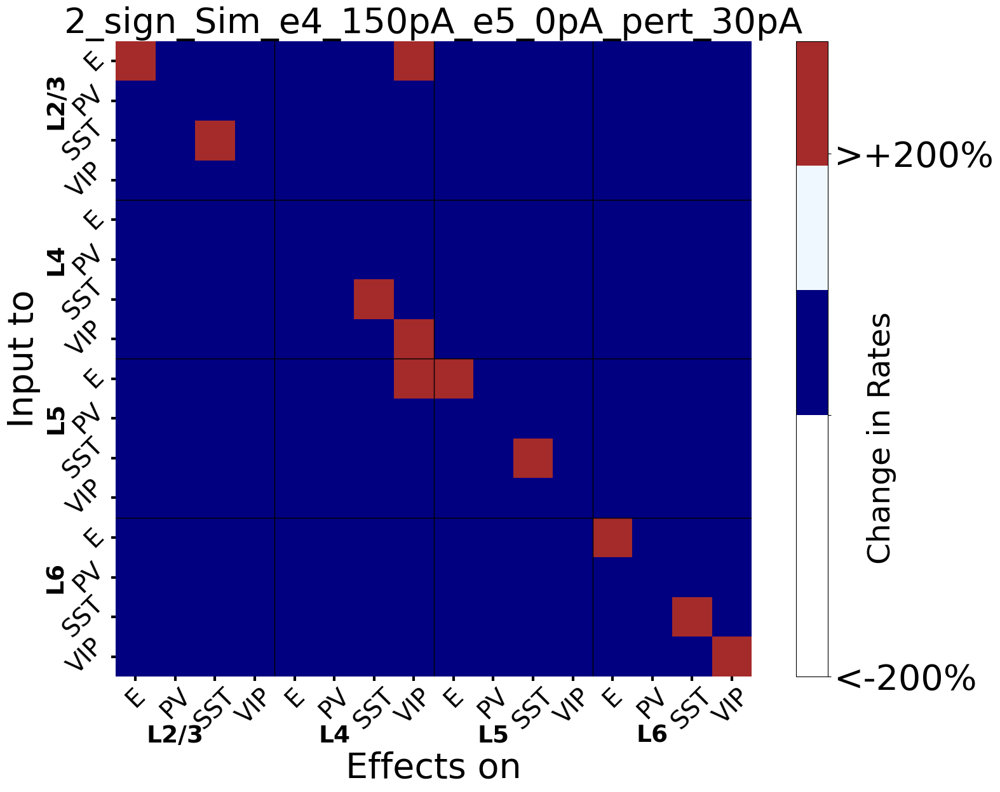

Plot saved for threshold 2 and perturbation 30pA.


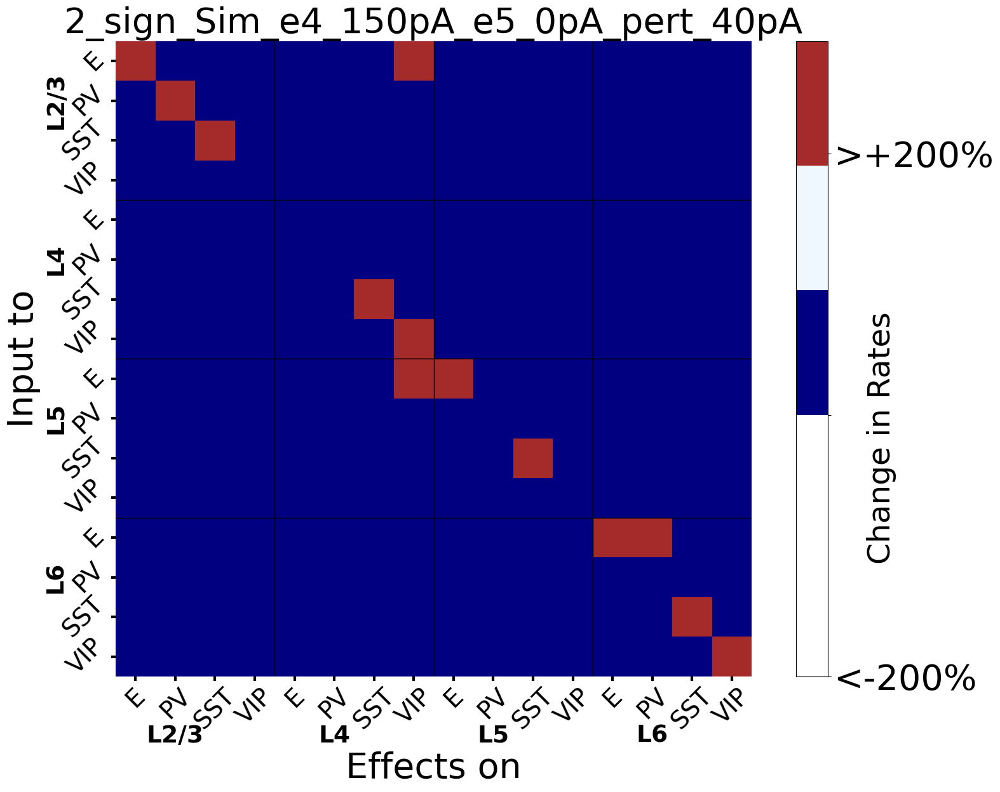

Plot saved for threshold 2 and perturbation 40pA.


In [306]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Define the threshold values and perturbation inputs
threshold_values = [0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.7, 0.8, 0.9, 1, 1.5, 2]    # Example thresholds
perturbation_inputs = [-40, -30, -20, -10, 10, 20, 30, 40]

# Labels for the axes
x_axis_labels = ['E', 'PV', 'SST', 'VIP', 'E', 'PV', 'SST', 'VIP', 'E', 'PV', 'SST', 'VIP', 'E', 'PV', 'SST', 'VIP']
y_axis_labels = ['E', 'PV', 'SST', 'VIP', 'E', 'PV', 'SST', 'VIP', 'E', 'PV', 'SST', 'VIP', 'E', 'PV', 'SST', 'VIP']

# Colors for the heatmap
colors = ["navy", "aliceblue", 'brown']
sns.set_palette(sns.color_palette(colors))
col_map = sns.color_palette(colors)

# Layer labels for the additional text
layer_labels = ['L2/3', 'L4', 'L5', 'L6']
x_positions = [1.5, 5.5, 9.5, 13.5]
y_positions = [1.5, 5.5, 9.5, 13.5]

# Iterate over each threshold value
for threshold in threshold_values:
    for pert in perturbation_inputs:
        # Construct the filename for the saved sign matrix
        filename_matrix_sign = f'{threshold}_sign_Sim_e4_150pA_e5_0pA_pert_{pert}pA.txt'

        # Load the saved sign matrix
        sign_matrix = np.loadtxt('../simulations_data/REVISIONS_1/matrix/' + filename_matrix_sign)

        # Create figure for plotting
        fig = plt.figure(figsize=(18, 13))

        # Plot the heatmap
        mA_plot = sns.heatmap(np.array(sign_matrix), square=True, cmap=col_map, cbar=False,
                              xticklabels=x_axis_labels, yticklabels=y_axis_labels, linewidths=0.)

        # Layout customization
        mA_plot.tick_params(axis='both', which='major', width=3, length=5)
        mA_plot.set_xticklabels(mA_plot.get_xmajorticklabels(), fontsize=28, rotation=45)
        mA_plot.set_yticklabels(mA_plot.get_ymajorticklabels(), fontsize=28, rotation=45)

        # Add text labels for the X and Y axis
        for label, pos in zip(layer_labels, x_positions):
            plt.text(pos, 17.5, label, ha='center', va='center', fontsize=27, fontweight='bold')
        for label, pos in zip(layer_labels, y_positions):
            plt.text(-1.5, pos, label, ha='center', va='center', fontsize=27, fontweight='bold', rotation=90)

        # Lines to guide the eye
        for i in range(4, sign_matrix.shape[0], 4):
            plt.axhline(i, color='black', linewidth=1)
            plt.axvline(i, color='black', linewidth=1)

        # Colorbar
        cbar = mA_plot.figure.colorbar(mA_plot.collections[0])
        colorbar = mA_plot.collections[0].colorbar
        colorbar.set_ticks([-0.7, 0, 0.7])
        colorbar.set_ticklabels(['<-' + str(int(threshold * 100)) + '%', '', '>+' + str(int(threshold * 100)) + '%'])
        cbar_pos = cbar.ax.get_position()
        cbar.ax.text(2.7, -0.4, 'Change in Rates', rotation=90, va='bottom', ha='center', fontsize=35)
        cax = mA_plot.figure.axes[-1]
        cax.tick_params(labelsize=40)

        # Labels for axes
        mA_plot.set_xlabel('Effects on', fontsize=40, labelpad=20)
        mA_plot.set_ylabel('Input to', fontsize=40, labelpad=20)
        
        # Generate the title
        figure_name = filename_matrix_sign.replace('.txt', '')
        plt.title(figure_name, fontsize=40)

        # Save the figure
        plt.savefig('../IMAGES/REVISIONS_1/' + figure_name + '.png', bbox_inches='tight')
        
        # Show the plot
        plt.show()

        print(f'Plot saved for threshold {threshold} and perturbation {pert}pA.')


In [282]:
#COMPUTE THE NUMBER OF SIGNIFICANT CHANGES in each scenario

In [283]:
#function to compute the number of values in the matrix that denote a significant change in firing rates
def count_entry(matrix):
    count=0
    for i in range(len(matrix)):
        for j in range(len(matrix)):
            if matrix[i][j] != 0 :
                count+=1
    #print(count)
    return count

In [269]:
# #Number of counts for each matrix (I call the function I just created)
# #I upload each matrix and compute the number of significant changes
# threshold_values = [0.1,0.2]
# for threshold in threshold_values :

#     count_m40pA= count_entry(np.loadtxt('../simulations_data/REVISIONS_1/matrix/'+str(threshold)+'_sign_Sim_e4_150pA_e5_0pA_pert_-40pA.txt'))
#     count_m30pA= count_entry(np.loadtxt('../simulations_data/REVISIONS_1/matrix/'+str(threshold)+'_sign_Sim_e4_150pA_e5_0pA_pert_-30pA.txt'))
#     count_m20pA= count_entry(np.loadtxt('../simulations_data/REVISIONS_1/matrix/'+str(threshold)+'_sign_Sim_e4_150pA_e5_0pA_pert_-20pA.txt'))
#     count_m10pA= count_entry(np.loadtxt('../simulations_data/REVISIONS_1/matrix/'+str(threshold)+'_sign_Sim_e4_150pA_e5_0pA_pert_-10pA.txt'))
#     count_10pA= count_entry(np.loadtxt('../simulations_data/REVISIONS_1/matrix/'+str(threshold)+'_sign_Sim_e4_150pA_e5_0pA_pert_10pA.txt'))
#     count_20pA= count_entry(np.loadtxt('../simulations_data/REVISIONS_1/matrix/'+str(threshold)+'_sign_Sim_e4_150pA_e5_0pA_pert_20pA.txt'))
#     count_30pA= count_entry(np.loadtxt('../simulations_data/REVISIONS_1/matrix/'+str(threshold)+'_sign_Sim_e4_150pA_e5_0pA_pert_30pA.txt'))
#     count_40pA= count_entry(np.loadtxt('../simulations_data/REVISIONS_1/matrix/'+str(threshold)+'_sign_Sim_e4_150pA_e5_0pA_pert_40pA.txt'))


# #I create an array with these values 
# pert_input=[-40,-30,-20,-10,10,20,30,40]
# counts=[count_m40pA,count_m30pA,count_m20pA,count_m10pA,count_10pA,count_20pA,count_30pA,count_40pA]

In [309]:
# Define your threshold values
threshold_values = [0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.7, 0.8, 0.9, 1, 1.5, 2]  # Add more thresholds as needed

# Define your perturbation inputs
pert_inputs = [-40, -30, -20, -10,0, 10, 20, 30, 40]

# Initialize a list to store results for each threshold
all_counts = []

# Iterate over each threshold value
for threshold in threshold_values:
    # Initialize a dictionary to store the count for each perturbation input
    counts = {}
    
    # Loop through each perturbation input and compute the count
    for pert in pert_inputs:
        # Construct the filename dynamically
        file_path = f'../simulations_data/REVISIONS_1/matrix/{threshold}_sign_Sim_e4_150pA_e5_0pA_pert_{pert}pA.txt'
        if pert == 0:
            counts[pert]= 0
        else:        
        # Compute the count using the count_entry function
            counts[pert] = count_entry(np.loadtxt(file_path))
    
    # Append the dictionary of counts for the current threshold to the list
    all_counts.append(counts)

# Now all_counts contains the results for all thresholds

# Example: Accessing counts for the first threshold
print(all_counts[0])  # Output will be a dictionary of counts for the first threshold

{-40: 135, -30: 132, -20: 107, -10: 82, 0: 0, 10: 107, 20: 160, 30: 174, 40: 187}


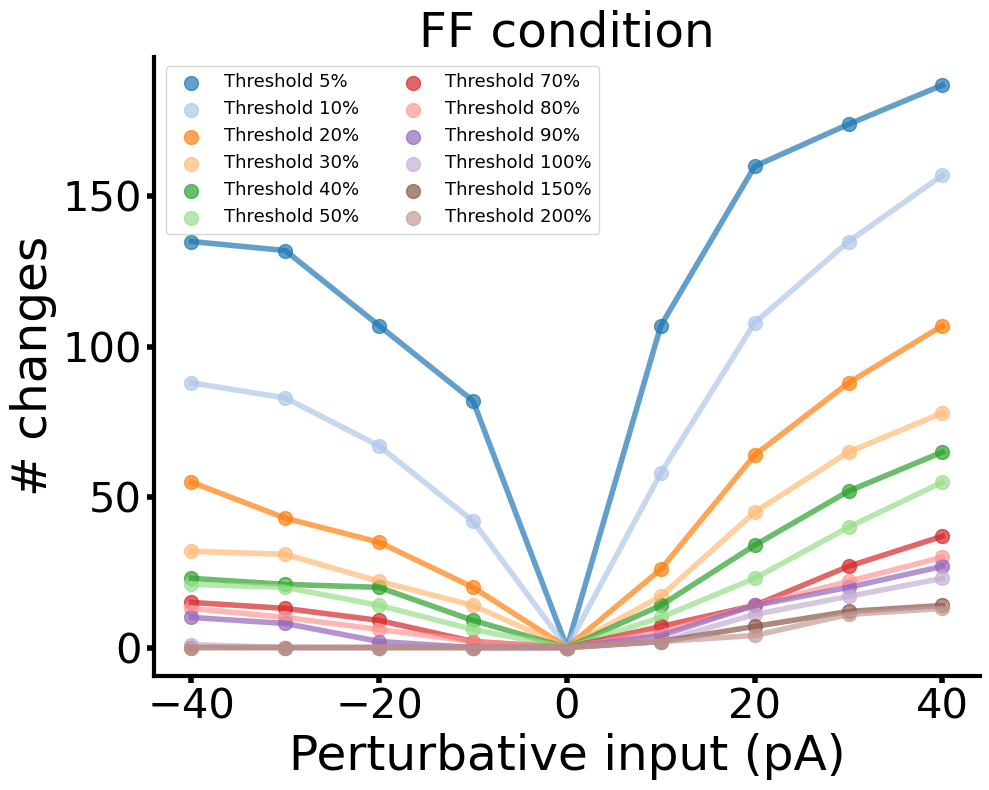

In [314]:
# Prepare to plot
fig, ax = plt.subplots(figsize=(10, 8))

colors = plt.get_cmap('tab20').colors[:len(threshold_values)]

# Plot data for each threshold value
for i, threshold in enumerate(threshold_values):
    counts = all_counts[i]
    count_values = [counts[pert] for pert in pert_inputs]  # Extract counts for each pert_input

    # Scatter and line plot for each threshold
    plt.scatter(pert_inputs, count_values, s=100,color=colors[i], label=f'Threshold {int(threshold*100)}%', alpha=0.7)
    plt.plot(pert_inputs, count_values, linewidth=4,color=colors[i], alpha=0.7)

# Customize the plot
plt.gca().spines['right'].set_color('none')
plt.gca().spines['top'].set_color('none')
plt.setp(ax.spines.values(), linewidth=3)

plt.xticks(size=30)
plt.yticks(size=30)
ax.xaxis.set_tick_params(width=4, length=5)
ax.yaxis.set_tick_params(width=4, length=5)

# Labels and layout
plt.xlabel('Perturbative input (pA)', size=35)
plt.ylabel('# changes', size=35)
plt.title('FF condition', size=35)
plt.locator_params(axis='x', nbins=5)
plt.locator_params(axis='y', nbins=5)

# Add legend
plt.legend(fontsize=13, ncol=2, loc='upper right', bbox_to_anchor=(0.55, 1.0))

plt.tight_layout()

plt.savefig('../IMAGES/REVISIONS_1/figSUPP_FF_perturb_number_changes_allTresholds.png')

# Show plot
plt.show()

In [245]:
#Fig. 2D
#Number of significant counts for each matrix.
#Increase the strenght of FF input for each analyzed situation

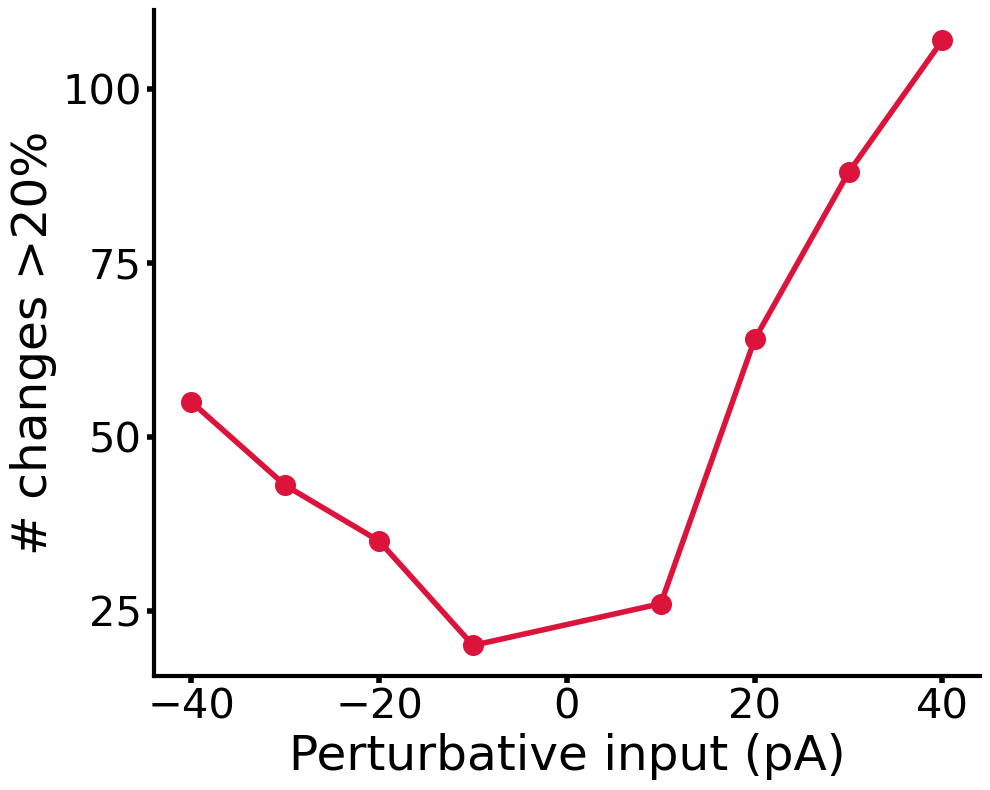

In [192]:
#Create figure
fig , ax = plt.subplots(figsize=(10,8))

#Plot the data
plt.scatter(pert_input,counts, s=200,color='crimson')
plt.plot(pert_input,counts,linewidth=4,  label='E2/3',color='crimson')

# Create names on the x-axis
plt.gca().spines['right'].set_color('none')
plt.gca().spines['top'].set_color('none')
plt.setp(ax.spines.values(), linewidth=3)
#Layout
plt.xticks(size=30)
plt.yticks(size=30)
ax.xaxis.set_tick_params(width=4,length=5)
ax.yaxis.set_tick_params(width=4,length=5)
#Labels
plt.xlabel('Perturbative input (pA)',size=35)
plt.ylabel('# changes >20%',size=35)
plt.locator_params(axis='x', nbins=5)
plt.locator_params(axis='y', nbins=4)
plt.tight_layout()

#Save fig
#plt.savefig('../IMAGES/REVISIONS_1/figSUPP_spont_perturb_number_changes.png')

#plt.savefig('../IMAGES/REVISIONS_1/figSUPP_FF_perturb_number_changes.png')



plt.show()

In [111]:
#Here I create the supplementary figure S2-B

In [244]:
#function to compute the number of values in the matrix that denote a positive change in firing rates
def count_positive(matrix):
    count=0
    for i in range(len(matrix)):
        for j in range(len(matrix)):
            if matrix[i][j] ==1  :
                count+=1
    #print(count)
    return count

In [251]:
#Number of poisitve counts for each matrix (I call the function I just created)
#I am uploading all the matrices and computing it
p_count_0pA= count_positive(np.loadtxt('../simulations_data/REVISIONS_1/matrix/0.2_sign_Sim_e4_0pA.txt'))
p_count_30pA= count_positive(np.loadtxt('../simulations_data/REVISIONS_1/matrix/0.2_sign_Sim_e4_30pA.txt'))
p_count_60pA=count_positive(np.loadtxt('../simulations_data/REVISIONS_1/matrix/0.2_sign_Sim_e4_60pA.txt'))
p_count_80pA= count_positive(np.loadtxt('../simulations_data/REVISIONS_1/matrix/0.2_sign_Sim_e4_80pA.txt'))
p_count_110pA= count_positive(np.loadtxt('../simulations_data/REVISIONS_1/matrix/0.2_sign_Sim_e4_110pA.txt'))
p_count_140pA= count_positive(np.loadtxt('../simulations_data/REVISIONS_1/matrix/0.2_sign_Sim_e4_140pA.txt'))
p_count_170pA= count_positive(np.loadtxt('../simulations_data/REVISIONS_1/matrix/0.2_sign_Sim_e4_170pA.txt'))
p_count_200pA= count_positive(np.loadtxt('../simulations_data/REVISIONS_1/matrix/0.2_sign_Sim_e4_200pA.txt'))
p_count_230pA= count_positive(np.loadtxt('../simulations_data/REVISIONS_1/matrix/0.2_sign_Sim_e4_230pA.txt'))
p_count_260pA= count_positive(np.loadtxt('../simulations_data/REVISIONS_1/matrix/0.2_sign_Sim_e4_260pA.txt'))
p_count_280pA= count_positive(np.loadtxt('../simulations_data/REVISIONS_1/matrix/0.2_sign_Sim_e4_280pA.txt'))
p_count_310pA= count_positive(np.loadtxt('../simulations_data/REVISIONS_1/matrix/0.2_sign_Sim_e4_310pA.txt'))
p_count_370pA= count_positive(np.loadtxt('../simulations_data/REVISIONS_1/matrix/0.2_sign_Sim_e4_370pA.txt'))
p_count_400pA= count_positive(np.loadtxt('../simulations_data/REVISIONS_1/matrix/0.2_sign_Sim_e4_400pA.txt'))

#I create an array with these values 
p_FF_input=[0,30,60,80,110,140,170,200,230,260,280,310,370,400]
p_counts=[p_count_0pA,p_count_30pA,p_count_60pA,p_count_80pA,p_count_110pA,p_count_140pA,p_count_170pA,p_count_200pA,p_count_230pA,p_count_260pA,p_count_280pA,
       p_count_310pA,p_count_370pA,p_count_400pA]

#I compute the percentage of positive counts over the total counts of significant changes
counts_perc= [(a / b)*100 for a, b in zip(p_counts, counts)]
#print(counts_perc)


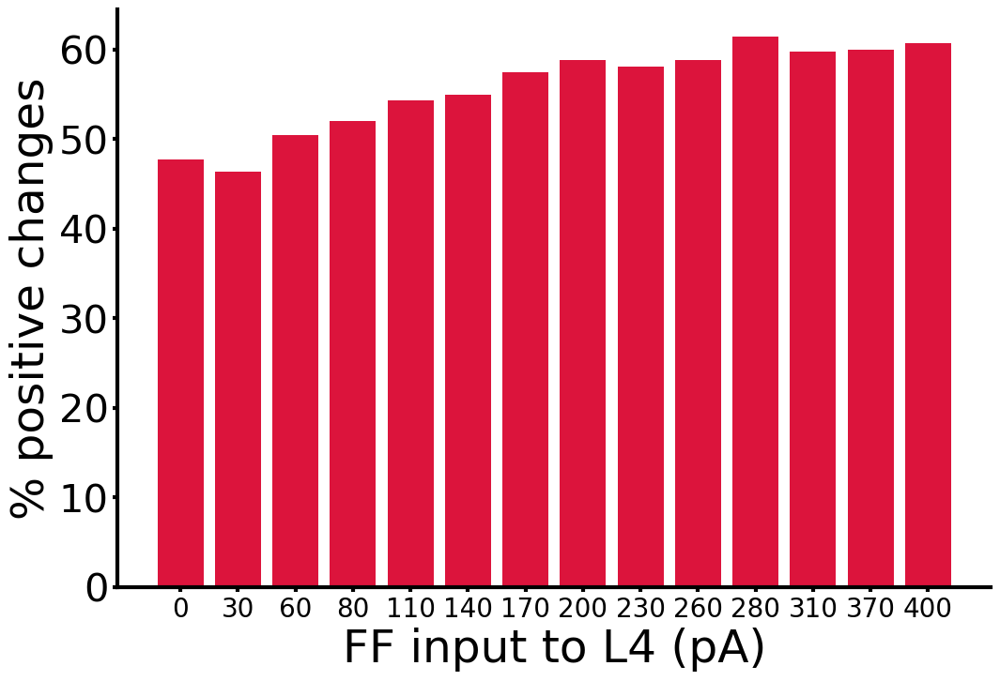

In [252]:
#Create the plot
fig , ax = plt.subplots(figsize=(12,8))
#Labels
labels_all = ('0','30','60','80','110','140','170','200','230','260','280','310','370','400')
x_pos = np.arange(len(labels_all))

#plot the data
plt.bar(x_pos,counts_perc, color='crimson',alpha=1)
#plt.bar(x_pos,p_counts) #If I want the number of positive counts

#layout
ax.xaxis.set_tick_params(width=3)
ax.yaxis.set_tick_params(width=3)
plt.gca().spines['right'].set_color('none')
plt.gca().spines['top'].set_color('none')
plt.setp(ax.spines.values(), linewidth=3)
plt.xticks(x_pos, labels_all,size=20)
plt.tick_params(axis='y', labelsize=30)

#labels of the axes
plt.ylabel('% positive changes', size=35) #out of the number of changes 
#plt.ylabel('# positive changes', size=25) #number of changes 
plt.xlabel('FF input to L4 (pA)', size=35) 

#Save fig
plt.savefig('../IMAGES/REVISIONS_1/figS2_PERCpositiveChangeFFvarying.png', bbox_inches='tight')

plt.show()